<div align="center">
    
# Mortgage Risk Modeling
# 2.0 Data Wrangling

## 2.1 Table of Contents<a id='2.1_Table_of_Contents'></a>
* [2.1 Table of Contents](#2.1_Table_of_Contents)
* [2.2 Introduction](#2.2_Introduction)
* [2.3 Library Imports](#2.3_Library_Imports)
* [2.4 Data Loading](#2.4_Data_Loading)
* [2.5 Data Inspection](#2.5_Data_Inspection)
  * [2.5.1 Numerical Features](#2.5.1_Numerical_Features)
  * [2.5.2 Categorical Features](#2.5.2_Categorical_Features)
* [2.6 Data Cleaning](#2.6_Data_Cleaning)
  * [2.6.1 Duplicates](#2.6.1_Duplicates)
  * [2.6.2 Missing Values](#2.6.2_Missing_Values)
  * [2.6.3 Outliers](#2.6.3_Outliers)
* [2.7 Data Transformation](#2.7_Data_Transformation)
* [2.8 Summary](#2.8_Summary)

## 2.1 Table of Contents<a id='2.1_Table_of_Contents'></a>
* [2.1 Table of Contents](#2.1_Table_of_Contents)
* [2.2 Introduction](#2.2_Introduction)
* [2.3 Library Imports](#2.3_Library_Imports)
* [2.4 Data Loading](#2.4_Data_Loading)
* [2.5 Data Inspection](#2.5_Data_Inspection)
  * [2.5.1 Numerical Features](#2.5.1_Numerical_Features)
  * [2.5.2 Categorical Features](#2.5.2_Categorical_Features)
* [2.6 Data Cleaning](#2.6_Data_Cleaning)
  * [2.6.1 Duplicates](#2.6.1_Duplicates)
  * [2.6.2 Missing Values](#2.6.2_Missing_Values)
  * [2.6.3 Outliers](#2.6.3_Outliers)
* [2.7 Data Transformation](#2.7_Data_Transformation)
* [2.8 Summary](#2.8_Summary)

## 2.2 Introduction<a id='2.2_Introduction'></a>

This project focuses on predicting mortgage default and prepayment risks using a consolidated dataset from the Q1 2020 cohort. This specific period serves as a macroeconomic case study, allowing for the evaluation of credit risk models during a timeframe characterized by high market volatility and significant government intervention. By modeling these "stress-test" conditions, the analysis aims to identify robust predictors of loan performance that remain effective even during major economic disruptions.

This notebook is dedicated to the Data Wrangling phase of the machine learning pipeline. The objective is to transform raw loan performance data into a clean, structured "Analytical Base Table" (ABT) suitable for modeling. Key technical priorities include the implementation of custom credit risk logic, the systematic handling of missing data through feature engineering, and the removal of incomplete records to ensure that only loans with established payment histories are utilized for training.

## 2.3 Library Imports<a id='2.3_Library_Imports'></a>

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import math

## 2.4 Data Loading<a id='2.4_Data_Loading'></a>

In [2]:
# Load data from five US states, CO, GA, MI, OH and VA
path='data/raw/'

file_2020q1_OH=pd.read_csv(path+'file_2020Q1_OH.csv')
file_2020q1_VA=pd.read_csv(path+'file_2020Q1_VA.csv')
file_2020q1_GA=pd.read_csv(path+'file_2020Q1_GA.csv')
file_2020q1_MI=pd.read_csv(path+'file_2020Q1_MI.csv')
file_2020q1_CO=pd.read_csv(path+'file_2020Q1_CO.csv')

In [3]:
# Combine all states into one DataFrame and reset the index
df = pd.concat([file_2020q1_OH, file_2020q1_VA, file_2020q1_GA, file_2020q1_MI, file_2020q1_CO], ignore_index=True)
df.shape

(167630, 108)

In [4]:
df.head()

,POOL_ID,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,MASTER_SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,...,MARGIN,BALLOON_INDICATOR,PLAN_NUMBER,FORBEARANCE_INDICATOR,HIGH_LOAN_TO_VALUE_HLTV_REFINANCE_OPTION_INDICATOR,DEAL_NAME,RE_PROCS_FLAG,ADR_TYPE,ADR_COUNT,ADR_UPB
0,NaN,98836743,12020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN
1,NaN,98836743,22020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN
2,NaN,98836743,32020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN
3,NaN,98836743,42020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN
4,NaN,98836743,52020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN


In [5]:
# Check row counts for each individual file
print(f"OH: {len(file_2020q1_OH)} rows")
print(f"VA: {len(file_2020q1_VA)} rows")
print(f"GA: {len(file_2020q1_GA)} rows")
print(f"MI: {len(file_2020q1_MI)} rows")
print(f"CO: {len(file_2020q1_CO)} rows")
print(f"Total in df: {len(df)} rows")

OH: 19923 rows
VA: 15931 rows
GA: 38254 rows
MI: 26039 rows
CO: 67483 rows
Total in df: 167630 rows


## 2.5 Data Inspection<a id='2.5_Data_Inspection'></a>

In [6]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 167630 entries, 0 to 167629
Columns: 108 entries, POOL_ID to ADR_UPB
dtypes: float64(84), int64(2), str(22)
memory usage: 138.1 MB


### 2.5.1 Numerical Features<a id='2.5.1_Numerical_Features'></a>

In [7]:
# Summary statistics
display(df.describe(include='all'))

,POOL_ID,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,MASTER_SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,...,MARGIN,BALLOON_INDICATOR,PLAN_NUMBER,FORBEARANCE_INDICATOR,HIGH_LOAN_TO_VALUE_HLTV_REFINANCE_OPTION_INDICATOR,DEAL_NAME,RE_PROCS_FLAG,ADR_TYPE,ADR_COUNT,ADR_UPB
count,0.0,1.676300e+05,167630.000000,167629,167629,162606,0.0,167629.000000,162606.000000,167628.000000,...,0.0,0.0,0.0,167625,167625,0.0,5023,167625,3615.000000,3605.000000
unique,NaN,NaN,NaN,3,21,26,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,5,1,NaN,2,2,NaN,NaN
top,NaN,NaN,NaN,R,Other,Other,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,7,N,NaN,N,7,NaN,NaN
freq,NaN,NaN,NaN,91626,68770,54004,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,161010,167625,NaN,5018,164020,NaN,NaN
mean,NaN,9.887015e+07,60804.946012,NaN,NaN,NaN,NaN,3.983373,3.982233,263176.706755,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.021300,10679.181301
std,NaN,2.568713e+04,34701.422407,NaN,NaN,NaN,NaN,0.429567,0.430507,118414.121559,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.144403,9339.525489
min,NaN,9.883674e+07,22.000000,NaN,NaN,NaN,NaN,2.625000,2.625000,10000.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,612.540000
25%,NaN,9.885061e+07,32020.000000,NaN,NaN,NaN,NaN,3.750000,3.750000,171000.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,4576.690000
50%,NaN,9.886354e+07,62020.000000,NaN,NaN,NaN,NaN,3.875000,3.875000,251000.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,7683.650000
75%,NaN,9.888279e+07,92020.000000,NaN,NaN,NaN,NaN,4.125000,4.125000,342000.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,12880.520000


### 2.5.2 Categorical Features<a id='2.5.2_Categorical_Features'></a>

In [8]:
# Updated to avoid Pandas4Warning
display(df.select_dtypes(include=['object', 'category', 'string']).head())

,CHANNEL,SELLER,SERVICER,FIRST_FLAG,PURPOSE,PROP,OCC_STAT,STATE,PRODUCT,PPMT_FLG,...,MOD_FLAG,SERV_IND,HOMEREADY_PROGRAM_INDICATOR,RELOCATION_MORTGAGE_INDICATOR,PROPERTY_INSPECTION_WAIVER_INDICATOR,HIGH_BALANCE_LOAN_INDICATOR,FORBEARANCE_INDICATOR,HIGH_LOAN_TO_VALUE_HLTV_REFINANCE_OPTION_INDICATOR,RE_PROCS_FLAG,ADR_TYPE
0,R,Other,Other,N,R,SF,P,OH,FRM,N,...,N,N,N,N,A,N,7,N,NaN,7
1,R,Other,Other,N,R,SF,P,OH,FRM,N,...,N,N,N,N,A,N,7,N,NaN,7
2,R,Other,Other,N,R,SF,P,OH,FRM,N,...,N,N,N,N,A,N,7,N,NaN,7
3,R,Other,Other,N,R,SF,P,OH,FRM,N,...,N,N,N,N,A,N,7,N,NaN,7
4,R,Other,Other,N,R,SF,P,OH,FRM,N,...,N,N,N,N,A,N,7,N,NaN,7


## 2.6 Data Cleaning<a id='2.6_Data_Cleaning'></a>

### 2.6.2 Missing Values<a id='2.6.2_Missing_Values'></a>

In [9]:
# Check missing values
missing = df.isnull().sum()
missing_summary = missing[missing > 0].sort_values(ascending=False).to_frame(name='Missing Count')
missing_summary['Percentage'] = (missing_summary['Missing Count'] / len(df)) * 100

print(f"Total rows in dataset: {len(df)}")
display(missing_summary)

Total rows in dataset: 167630


,Missing Count,Percentage
POOL_ID,167630,100.000000
MASTER_SERVICER,167630,100.000000
ISSUANCE_UPB,167630,100.000000
MNTHS_TO_AMTZ_IO,167630,100.000000
FIRST_PAY_IO,167630,100.000000
...,...,...
ORIG_UPB,2,0.001193
CURRENT_UPB,2,0.001193
ORIG_RATE,1,0.000597
SELLER,1,0.000597


In [10]:
# Identify columns where missing value percentage is 100%
empty_cols = missing_summary[missing_summary['Percentage'] == 100].index.tolist()

print(empty_cols)

['POOL_ID', 'MASTER_SERVICER', 'ISSUANCE_UPB', 'MNTHS_TO_AMTZ_IO', 'FIRST_PAY_IO', 'MI_CANCEL_FLAG', 'BALLOON_INDICATOR', 'MARGIN', 'DEAL_NAME', 'PLAN_NUMBER', 'CURRENT_PERIOD_CREDIT_EVENT_NET_GAIN_OR_LOSS', 'CUMULATIVE_CREDIT_EVENT_NET_GAIN_OR_LOSS', 'LOAN_HOLDBACK_INDICATOR', 'ZERO_BALANCE_CODE_CHANGE_DATE', 'LOAN_HOLDBACK_EFFECTIVE_DATE', 'MONTHS_UNTIL_FIRST_PAYMENT_RESET', 'ARM_5_YR_INDICATOR', 'CURR_SCOREC', 'ISSUE_SCOREB', 'ISSUE_SCOREC', 'CURRENT_LIST_PRICE', 'CURRENT_LIST_START_DATE', 'ORIGINAL_LIST_START_DATE', 'CURR_SCOREB', 'CURRENT_PERIOD_MODIFICATION_LOSS_AMOUNT', 'CUMULATIVE_MODIFICATION_LOSS_AMOUNT', 'REPURCHASES_MAKE_WHOLE_PROCEEDS', 'OTHER_FORECLOSURE_PROCEEDS', 'ORIGINAL_LIST_PRICE', 'CREDIT_ENHANCEMENT_PROCEEDS', 'ASSET_RECOVERY_COSTS', 'NET_SALES_PROCEEDS', 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY', 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS', 'DISPOSITION_DATE', 'FORECLOSURE_COSTS', 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS', 'FORECLOSURE_DATE', 'UNSCHD_PRNCPL_CURR', 

In [11]:
# Drop columns that has no value at all
df.drop(columns=empty_cols, inplace=True)

print(f"Dropped {len(empty_cols)} empty columns.")
print(f"Remaining columns: {df.shape[1]}")

Dropped 52 empty columns.
Remaining columns: 56


In [13]:
# Identify columns with more than 97% missing values
cols_to_drop_97 = missing_summary[missing_summary['Percentage'] > 97].index.tolist()

# Drop these columns from the dataframe
df.drop(columns=cols_to_drop_97, inplace=True, errors='ignore')

print(f"Dropped {len(cols_to_drop_97)} columns with > 97% missing values.")
print(f"New shape of df: {df.shape}")

Dropped 61 columns with > 97% missing values.
New shape of df: (167630, 47)


In [14]:
# Select 'MI_TYPE' and 'MI_PCT', which has more than 50% of missing values
mi_cols = ['MI_TYPE', 'MI_PCT']

# Display summary statistics (mean, std, min, max for numeric; count, unique for categorical)
display(df[mi_cols].describe(include='all').T)

# Check unique values for the categorical 'MI_TYPE'
print("\nUnique values in MI_TYPE:")
print(df['MI_TYPE'].value_counts(dropna=False))

# Check unique values for the categorical 'MI_PCT'
print("\nUnique values in MI_PCT:")
print(df['MI_PCT'].value_counts(dropna=False))

,count,mean,std,min,25%,50%,75%,max
MI_TYPE,65851.0,1.043750,0.244762,1.0,1.0,1.0,1.0,3.0
MI_PCT,65852.0,25.405956,6.625299,6.0,25.0,25.0,30.0,35.0



Unique values in MI_TYPE:
MI_TYPE
NaN    101779
1.0     63565
2.0      1691
3.0       595
Name: count, dtype: int64

Unique values in MI_PCT:
MI_PCT
NaN     101778
25.0     26739
30.0     22658
12.0      9938
35.0      5342
18.0       841
6.0        189
16.0       145
Name: count, dtype: int64


**MI_TYPE (Mortgage Insurance Type)**

A categorical feature where values like 1, 2, or 3 indicate the specific structure of the mortgage insurance (e.g., borrower-paid vs. lender-paid).

NaN indicates that no mortgage insurance was required for the loan. This typically happens for "low-risk" loans where the borrower had a down payment of 20% or more (Loan-to-Value <= 80%). They will be filled with '0', meaning no insurance.

**MI_PCT (Mortgage Insurance Percentage)**

A numerical value representing the percentage of the total loan amount that is covered by insurance in the event of a default.

NaN indicates that insurance coverage on the loan is 0 percentage. They will be filled with '0' , meaning no insurance.

In [15]:
# 1. Fill MI_TYPE: NaN means no insurance, so we use '0' as a new category
df['MI_TYPE'] = df['MI_TYPE'].fillna(0)

# 2. Fill MI_PCT: NaN means 0% insurance coverage
df['MI_PCT'] = df['MI_PCT'].fillna(0)

# Verify the fills
print("Missing values in MI features:")
print(df[['MI_TYPE', 'MI_PCT']].isnull().sum())

Missing values in MI features:
MI_TYPE    0
MI_PCT     0
dtype: int64


**CSCORE_B (Borrower Credit Score) and CSCORE_C (Co-borrower Credit Score)**

These features represent the FICO scores for the primary and secondary applicants. NaN in CSCORE_C indicate single-borrower loans, which account for 58.7% of the dataset.

To accurately reflect credit risk without overestimating household stability, a new feature CSCORE_L will be created. This column will capture the lower of the two scores. For single-borrower loans, CSCORE_L will default to the primary borrower's score (CSCORE_B). This approach ensures the model focuses on the highest credit risk associated with each loan. 

In [16]:
# 1. Create the 'lower score' feature CSCORE_L
# np.fmin handles NaNs by picking the non-NaN value. 
# If both are NaN, it returns NaN.
df['CSCORE_L'] = np.fmin(df['CSCORE_B'], df['CSCORE_C'].fillna(df['CSCORE_B']))

# 2. Drop rows where 'CSCORE_L' have NO credit score at all
df.dropna(subset=['CSCORE_L'], inplace=True)

# 3. Fill CSCORE_C with 0 for your 'No Co-borrower' flag
df['CSCORE_C'] = df['CSCORE_C'].fillna(0)

print(f"Final row count after keeping all available credit data: {len(df)}")
df[['CSCORE_B', 'CSCORE_C', 'CSCORE_L']].head()

Final row count after keeping all available credit data: 167627


,CSCORE_B,CSCORE_C,CSCORE_L
0,806.0,797.0,797.0
1,806.0,797.0,797.0
2,806.0,797.0,797.0
3,806.0,797.0,797.0
4,806.0,797.0,797.0


**New Loans (Zero History)**

Approximately 5,023 rows (2.99%) represent brand-new loans with no record of LOAN_AGE and PMT_HISTORY. Because these loans have not yet entered a payment cycle, they lack the behavioral data necessary for risk analysis. To ensure the model learns from established payment patterns, these rows will be removed.

In [17]:
# Only drop rows where BOTH Loan Age and Payment History are missing (NaN)
initial_count = len(df)

df = df.dropna(subset=['LOAN_AGE', 'PMT_HISTORY'], how='all')

dropped_count = initial_count - len(df)
print(f"Dropped {dropped_count} rows where both age and payment history were missing.")
print(f"Remaining rows for analysis: {len(df)}")

Dropped 5023 rows where both age and payment history were missing.
Remaining rows for analysis: 162604


**TOT_SCHD_PRNCPL and ADJ_REM_MONTHS**

1. TOT_SCHD_PRNCPL (Total Scheduled Principal): fill NaN with '0', indicating no principal is currently scheduled for payment.
2. ADJ_REM_MONTHS (Adjusted Remaining Months): fill NaN with values in REM_MONTHS, indicating there was no adjuetment.

In [18]:
# 1. If scheduled principal is missing, assume 0 (Interest Only/Modified)
df['TOT_SCHD_PRNCPL'] = df['TOT_SCHD_PRNCPL'].fillna(0)

# 2. Use REM_MONTHS for ADJ_REM_MONTHS as you planned
df['ADJ_REM_MONTHS'] = df['ADJ_REM_MONTHS'].fillna(df['REM_MONTHS'])

initial_count = len(df)

# 3. Final Sweep: Drop the columns with less than 30 missing values.
df.dropna(inplace=True)

dropped_count = initial_count - len(df)
print(f"Dropped {dropped_count} rows with missing values.")
print(f"Remaining rows for analysis: {len(df)}")

Dropped 29 rows with missing values.
Remaining rows for analysis: 162575


### 2.6.1 Duplicates<a id='2.6.1_Duplicates'></a>

In [23]:
# Get the total count of unique loans
unique_loan_count = df['LOAN_ID'].nunique()
print(f"Total number of unique LOAN_ID: {unique_loan_count}")
print(f"Total number of rows: {len(df)}")

Total number of unique LOAN_ID: 8528
Total number of rows: 162575


**LOAN_ID**

Each LOAN_ID contains multiple records representing different monthly snapshots (ACT_PERIOD). These are distinct operations, not duplicates. Duplicates are strictly defined as rows identical across all columns.

In [24]:
# Check for rows that are identical across ALL columns
total_duplicates = df.duplicated().sum()

if total_duplicates == 0:
    print(f"Data Integrity Verified: No identical rows found among {len(df)} records.")
else:
    print(f"Warning: Found {total_duplicates} identical rows. These should be removed.")
    # Optional: df.drop_duplicates(inplace=True)

Data Integrity Verified: No identical rows found among 162575 records.


### 2.6.3 Outliers<a id='2.6.3_Outliers'></a>

In [25]:
# Check the categorical data with unique values and counts
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns

# The rest of your loop remains the same
for col in cat_cols:
    print(f"--- {col} ---")
    print(df[col].value_counts())
    print("\n")

--- CHANNEL ---
CHANNEL
R    89048
C    56408
B    17119
Name: count, dtype: int64


--- SELLER ---
SELLER
Other                                                                 66973
Wells Fargo Bank, N.A.                                                23453
Lakeview Loan Servicing, LLC                                          13630
Quicken Loans, LLC                                                    10088
United Wholesale Mortgage, LLC                                         4951
JPMorgan Chase Bank, National Association                              4789
United Shore Financial Services, LLC dba United Wholesale Mortgage     4469
PennyMac Corp.                                                         4367
Fairway Independent Mortgage Corporation                               3737
Rocket Mortgage, LLC                                                   3651
Truist Bank (formerly SunTrust Bank)                                   3419
NewRez LLC                                               

In [26]:
# Identify columns with only 1 unique value
single_val_cols = [col for col in df.columns if df[col].nunique() <= 1]

print(f"Dropping {len(single_val_cols)} constant features: {single_val_cols}")

# Drop them from the dataframe
df.drop(columns=single_val_cols, inplace=True)

print(f"New dataframe shape: {df.shape}")

Dropping 4 constant features: ['PRODUCT', 'PPMT_FLG', 'IO', 'HIGH_LOAN_TO_VALUE_HLTV_REFINANCE_OPTION_INDICATOR']
New dataframe shape: (162575, 44)


In [27]:
# Summary statistics
display(df.describe(include='all'))

,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,CURRENT_UPB,ORIG_TERM,...,TOT_SCHD_PRNCPL,MI_TYPE,SERV_IND,HOMEREADY_PROGRAM_INDICATOR,RELOCATION_MORTGAGE_INDICATOR,PROPERTY_INSPECTION_WAIVER_INDICATOR,HIGH_BALANCE_LOAN_INDICATOR,FORBEARANCE_INDICATOR,ADR_TYPE,CSCORE_L
count,1.625750e+05,162575.000000,162575,162575,162575,162575.000000,162575.000000,162575.000000,162575.000000,162575.000000,...,162575.000000,162575.000000,162575,162575,162575,162575,162575,162575,162575,162575.000000
unique,NaN,NaN,3,21,26,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,2,2,2,3,2,5,2,NaN
top,NaN,NaN,R,Other,Other,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,N,N,N,A,N,7,7,NaN
freq,NaN,NaN,89048,66973,54001,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,160806,148559,161839,128119,159241,155964,158970,NaN
mean,9.887009e+07,60531.882042,NaN,NaN,NaN,3.982598,3.982002,261885.093034,255717.603458,350.409128,...,524.059699,0.410309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,746.962842
std,2.566948e+04,34632.450978,NaN,NaN,NaN,0.429640,0.430157,118119.999002,116945.248180,38.287306,...,4303.511376,0.532021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.157722
min,9.883674e+07,12020.000000,NaN,NaN,NaN,2.625000,2.625000,10000.000000,0.100000,120.000000,...,-304489.600000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,620.000000
25%,9.885058e+07,32020.000000,NaN,NaN,NaN,3.750000,3.750000,171000.000000,165298.740000,360.000000,...,206.540000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,716.000000
50%,9.886348e+07,62020.000000,NaN,NaN,NaN,3.875000,3.875000,250000.000000,243834.890000,360.000000,...,376.470000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,752.000000
75%,9.888274e+07,92020.000000,NaN,NaN,NaN,4.125000,4.125000,341000.000000,333223.265000,360.000000,...,570.035000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,781.000000


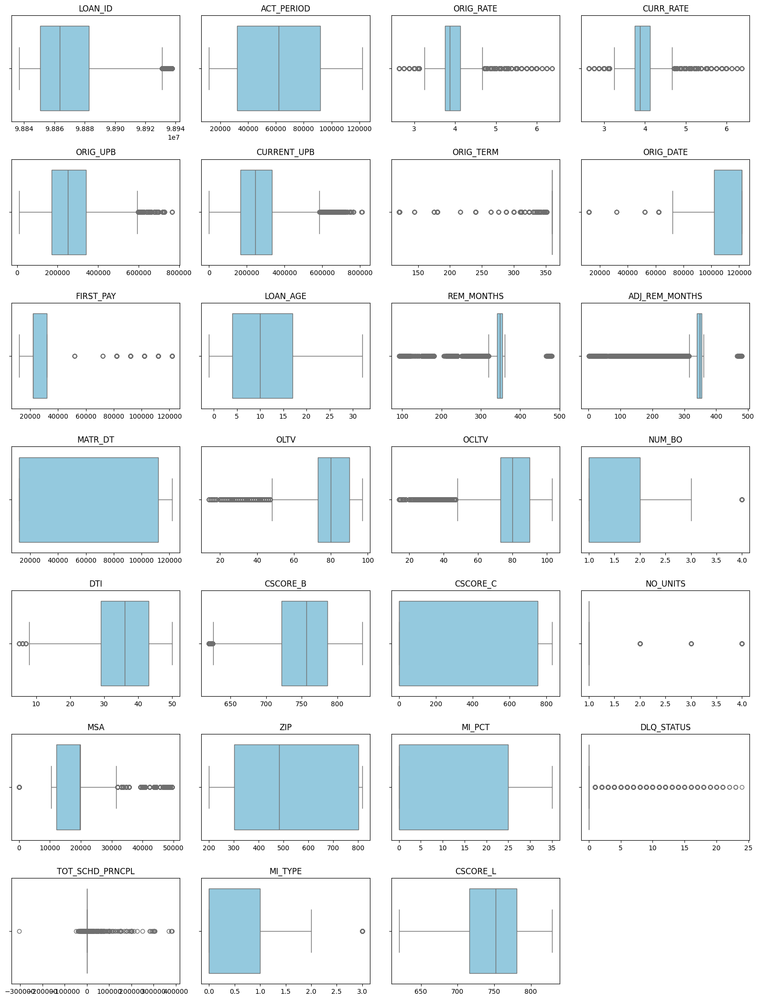

In [28]:
# 1. Select numeric columns
num_cols = df.select_dtypes(include=['number']).columns

# 2. Setup the grid
cols_per_row = 4
n_rows = math.ceil(len(num_cols) / cols_per_row)

fig, axes = plt.subplots(n_rows, cols_per_row, figsize=(16, n_rows * 3))
axes = axes.flatten()

# 3. Generate Boxplots
for i, col in enumerate(num_cols):
    sns.boxplot(x=df[col], ax=axes[i], color='skyblue')
    axes[i].set_title(f'{col}', fontsize=12)
    axes[i].set_xlabel('')

# 4. Clean up empty slots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

New Min TOT_SCHD_PRNCPL: 0.0


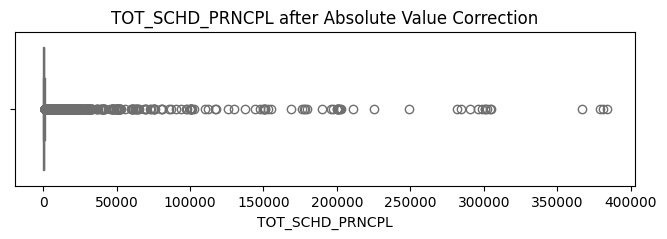

In [29]:
# 1. Flip negative Scheduled Principal to positive
df['TOT_SCHD_PRNCPL'] = df['TOT_SCHD_PRNCPL'].abs()

# 2. Verify the fix - the minimum should now be >= 0
print(f"New Min TOT_SCHD_PRNCPL: {df['TOT_SCHD_PRNCPL'].min()}")

# 3. Re-run the boxplot for this column to see the dot move
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 2))
sns.boxplot(x=df['TOT_SCHD_PRNCPL'], color='skyblue')
plt.title('TOT_SCHD_PRNCPL after Absolute Value Correction')
plt.show()

New Min LOAN_AGE: 0.0


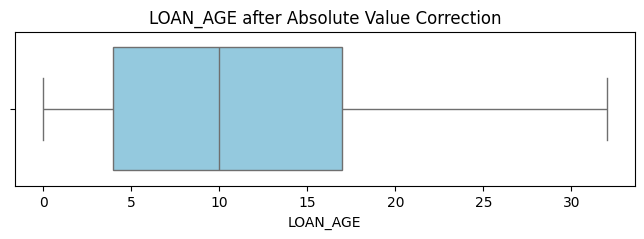

In [30]:
# 1. Flip negative Loan Age to positive
df['LOAN_AGE'] = df['LOAN_AGE'].abs()

# 2. Verify the fix - the minimum should now be >= 0
print(f"New Min LOAN_AGE: {df['LOAN_AGE'].min()}")

# 3. Re-run the boxplot for this column to see the dot move
plt.figure(figsize=(8, 2))
sns.boxplot(x=df['LOAN_AGE'], color='skyblue')
plt.title('LOAN_AGE after Absolute Value Correction')
plt.show()

## 2.7 Data Transformation<a id='2.7_Data_Transformation'></a>

In [33]:
display(df.head())

,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,CURRENT_UPB,ORIG_TERM,...,TOT_SCHD_PRNCPL,MI_TYPE,SERV_IND,HOMEREADY_PROGRAM_INDICATOR,RELOCATION_MORTGAGE_INDICATOR,PROPERTY_INSPECTION_WAIVER_INDICATOR,HIGH_BALANCE_LOAN_INDICATOR,FORBEARANCE_INDICATOR,ADR_TYPE,CSCORE_L
0,98836743,2020-01,R,Other,Other,3.625,3.625,207000.0,206411.45,240.0,...,0.00,0.0,N,N,N,A,N,7,7,797.0
1,98836743,2020-02,R,Other,Other,3.625,3.625,207000.0,205821.12,240.0,...,590.33,0.0,N,N,N,A,N,7,7,797.0
2,98836743,2020-03,R,Other,Other,3.625,3.625,207000.0,205229.01,240.0,...,592.11,0.0,N,N,N,A,N,7,7,797.0
3,98836743,2020-04,R,Other,Other,3.625,3.625,207000.0,204635.11,240.0,...,593.90,0.0,N,N,N,A,N,7,7,797.0
4,98836743,2020-05,R,Other,Other,3.625,3.625,207000.0,204039.42,240.0,...,595.69,0.0,N,N,N,A,N,7,7,797.0


**Date Features**

The raw date features, 'ORIG_DATE', 'FIRST_PAY', 'MATR_DT' and 'ACT_PERIOD' are currently stored as numeric floats (like 122019.0), which prevents time-series analysis. This transformation standardizes them into datetime objects to enable time-based calculations.

In [32]:
# List of columns to convert
date_cols = ['ORIG_DATE', 'FIRST_PAY', 'MATR_DT', 'ACT_PERIOD']

for col in date_cols:
    # 1. Standardize to datetime objects first
    df[col] = pd.to_datetime(df[col].astype(int).astype(str).str.zfill(6), format='%m%Y')
    
    # 2. Convert to Period format to remove the '-01' day display
    df[col] = df[col].dt.to_period('M')

# Verify the result
print(df[date_cols].head())

  ORIG_DATE FIRST_PAY  MATR_DT ACT_PERIOD
0   2019-12   2020-02  2040-01    2020-01
1   2019-12   2020-02  2040-01    2020-02
2   2019-12   2020-02  2040-01    2020-03
3   2019-12   2020-02  2040-01    2020-04
4   2019-12   2020-02  2040-01    2020-05


In [35]:
df.sort_values(by=['LOAN_ID', 'ACT_PERIOD'], inplace=True)

In [34]:
df.info()

<class 'pandas.DataFrame'>
Index: 162575 entries, 0 to 167628
Data columns (total 44 columns):
 #   Column                                Non-Null Count   Dtype    
---  ------                                --------------   -----    
 0   LOAN_ID                               162575 non-null  int64    
 1   ACT_PERIOD                            162575 non-null  period[M]
 2   CHANNEL                               162575 non-null  str      
 3   SELLER                                162575 non-null  str      
 4   SERVICER                              162575 non-null  str      
 5   ORIG_RATE                             162575 non-null  float64  
 6   CURR_RATE                             162575 non-null  float64  
 7   ORIG_UPB                              162575 non-null  float64  
 8   CURRENT_UPB                           162575 non-null  float64  
 9   ORIG_TERM                             162575 non-null  float64  
 10  ORIG_DATE                             162575 non-null  perio

## 2.8 Summary<a id='2.8_Summary'></a>

After data wrangling, the dataset is now optimized for exploratory analysis and modeling. Key actions taken include:

* Dimensionality Reduction: Reduced the feature set from over 100 original columns to 44 essential variables by removing empty and constant features.

* Data Integrity: Validated 162,575 records with zero missing values across all remaining columns.

* Temporal Standardization: Converted numeric date fields (ORIG_DATE, ACT_PERIOD, etc.) into period[M] format for accurate time-series analysis.

* Outlier Treatment: Corrected logical sign errors in LOAN_AGE and TOT_SCHD_PRNCPL using absolute values while preserving meaningful high-risk values in DTI.

* Optimization: Sorted the dataframe chronologically by LOAN_ID and ACT_PERIOD to ensure logical flow for sequence-based modeling.

In [36]:
output_path = "../data/processed/mrm_data_01_cleaned.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df.to_csv(output_path, index=False)
print(f"Cleaned data saved to {output_path}")

Cleaned data saved to ../data/processed/mrm_data_01_cleaned.csv


<div align="center">
    
# Mortgage Risk Modeling
# 3.0 Exploratory Data Analysis

## 3.1 Table of Contents<a id='3.1_Table_of_Contents'></a>
* [3.1 Table of Contents](#3.1_Table_of_Contents)
* [3.2 Introduction](#3.2_Introduction)
* [3.3 Library Imports](#3.3_Library_Imports)
* [3.4 Data Loading](#3.4_Data_Loading)
* [3.5 Data Overview](#3.5_Data_Overview)
  * [3.5.1 Data Structure](#3.5.1_Data_Structure)
  * [3.5.2 Correlation Overview](#3.5.2_Correlation_Overview)
* [3.6 Feature Analysis](#3.6_Feature_Analysis)
  * [3.6.1 Numerical Features](#3.6.1_Numerical_Features)
  * [3.6.2 Categorical Features](#3.6.2_Categorical_Features)
  * [3.6.3 Numerical vs Categorical](#3.6.3_Numerical_vs_Categorical)
* [3.7 Summary](#3.7_Summary)

## 3.2 Introduction<a id='3.2_Introduction'></a>

This notebook performs Exploratory Data Analysis (EDA) on the cleaned mortgage dataset. Following the data wrangling phase, we now aim to uncover the underlying patterns and risk drivers that influence loan performance.

The primary objectives of this analysis are:

Understand Feature Distributions: Analyze the spread and central tendencies of key risk factors like Interest Rates (ORIG_RATE), Debt-to-Income ratios (DTI), and Credit Scores (CSCORE_B).

Detect Relationships & Correlations: Identify which variables move together—for example, how Loan-to-Value (OLTV) correlates with the likelihood of delinquency.

Identify Patterns & Trends: Observe how loan characteristics fluctuate over time (ACT_PERIOD) or across different geographical regions (States).

Risk Profile Segmentation: Compare the behaviors of different borrower groups to identify high-risk segments before moving into formal feature engineering.

## 3.3 Library Imports<a id='3.3_Library_Imports'></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import math

In [2]:
# display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 120)

# Plot style
sns.set(style='whitegrid', palette='muted', font_scale=1.1)

## 3.4 Data Loading<a id='3.4_Data_Loading'></a>

In [4]:
# Load preprocessed data from previous step
df = pd.read_csv('../data/processed/mrm_data_01_cleaned.csv')

print(f"Shape: {df.shape}")

Shape: (162575, 44)


## 3.5 Data Overview<a id='3.5_Data_Overview'></a>

### 3.5.1 Data Structure<a id='3.5.1_Data_Structure'></a>

In [6]:
df.info()
df.sample(5)

<class 'pandas.DataFrame'>
RangeIndex: 162575 entries, 0 to 162574
Data columns (total 44 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   LOAN_ID                               162575 non-null  int64  
 1   ACT_PERIOD                            162575 non-null  str    
 2   CHANNEL                               162575 non-null  str    
 3   SELLER                                162575 non-null  str    
 4   SERVICER                              162575 non-null  str    
 5   ORIG_RATE                             162575 non-null  float64
 6   CURR_RATE                             162575 non-null  float64
 7   ORIG_UPB                              162575 non-null  float64
 8   CURRENT_UPB                           162575 non-null  float64
 9   ORIG_TERM                             162575 non-null  float64
 10  ORIG_DATE                             162575 non-null  str    
 11  FIRST_PAY  

,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,CURRENT_UPB,ORIG_TERM,ORIG_DATE,FIRST_PAY,LOAN_AGE,REM_MONTHS,ADJ_REM_MONTHS,MATR_DT,OLTV,OCLTV,NUM_BO,DTI,CSCORE_B,CSCORE_C,FIRST_FLAG,PURPOSE,PROP,NO_UNITS,OCC_STAT,STATE,MSA,ZIP,MI_PCT,DLQ_STATUS,PMT_HISTORY,MOD_FLAG,TOT_SCHD_PRNCPL,MI_TYPE,SERV_IND,HOMEREADY_PROGRAM_INDICATOR,RELOCATION_MORTGAGE_INDICATOR,PROPERTY_INSPECTION_WAIVER_INDICATOR,HIGH_BALANCE_LOAN_INDICATOR,FORBEARANCE_INDICATOR,ADR_TYPE,CSCORE_L
104658,98872559,2021-08,C,Other,Other,4.000,4.000,199000.0,192837.74,360.0,2019-11,2020-01,20.0,340.0,340.0,2049-12,75.0,75.0,1.0,40.0,734.0,0.0,N,P,SF,2.0,I,MI,11460.0,481.0,0.0,0.0,XXXXXXXX0000000000000000000000000000000000000000,N,305.05,0.0,N,N,N,A,N,7,7,734.0
123049,98883526,2020-03,R,Fairway Independent Mortgage Corporation,RoundPoint Mortgage Servicing Corporation,4.000,4.000,415000.0,413200.20,360.0,2019-12,2020-02,2.0,358.0,357.0,2050-01,77.0,77.0,1.0,43.0,774.0,0.0,N,R,SF,1.0,P,CO,19740.0,801.0,0.0,0.0,XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX000000,N,1201.86,0.0,N,N,N,A,N,7,7,774.0
119757,98880928,2021-11,R,Other,Other,3.375,3.375,274000.0,260726.08,360.0,2019-12,2020-02,22.0,338.0,332.0,2050-01,64.0,64.0,2.0,17.0,776.0,778.0,N,R,SF,1.0,P,GA,12060.0,303.0,0.0,0.0,XX0000000000000000000000000000000000000000000000,N,475.33,0.0,N,N,N,W,N,7,7,776.0
1193,98837180,2020-08,C,"Wells Fargo Bank, N.A.","Wells Fargo Bank, N.A.",4.375,4.375,315000.0,311528.64,360.0,2019-11,2020-01,8.0,352.0,352.0,2049-12,93.0,93.0,1.0,37.0,703.0,0.0,N,R,PU,1.0,P,CO,19740.0,802.0,30.0,0.0,XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX0000000000000000,N,435.38,1.0,N,N,N,A,N,7,7,703.0
81578,98863583,2020-11,R,Other,"Lakeview Loan Servicing, LLC",4.250,4.250,242000.0,238217.83,360.0,2019-12,2020-02,10.0,350.0,350.0,2050-01,80.0,80.0,2.0,36.0,728.0,748.0,N,C,SF,1.0,P,GA,12060.0,302.0,0.0,0.0,XXXXXXXXXXXXXXXXXXXXXXXXXX0000000000000000000000,N,343.62,0.0,N,N,N,A,N,7,7,728.0


In [7]:
df.describe(include='all')

,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,CURRENT_UPB,ORIG_TERM,ORIG_DATE,FIRST_PAY,LOAN_AGE,REM_MONTHS,ADJ_REM_MONTHS,MATR_DT,OLTV,OCLTV,NUM_BO,DTI,CSCORE_B,CSCORE_C,FIRST_FLAG,PURPOSE,PROP,NO_UNITS,OCC_STAT,STATE,MSA,ZIP,MI_PCT,DLQ_STATUS,PMT_HISTORY,MOD_FLAG,TOT_SCHD_PRNCPL,MI_TYPE,SERV_IND,HOMEREADY_PROGRAM_INDICATOR,RELOCATION_MORTGAGE_INDICATOR,PROPERTY_INSPECTION_WAIVER_INDICATOR,HIGH_BALANCE_LOAN_INDICATOR,FORBEARANCE_INDICATOR,ADR_TYPE,CSCORE_L
count,1.625750e+05,162575,162575,162575,162575,162575.000000,162575.000000,162575.000000,162575.000000,162575.000000,162575,162575,162575.000000,162575.000000,162575.000000,162575,162575.000000,162575.000000,162575.000000,162575.000000,162575.000000,162575.000000,162575,162575,162575,162575.000000,162575,162575,162575.000000,162575.000000,162575.000000,162575.000000,162575,162575,162575.000000,162575.000000,162575,162575,162575,162575,162575,162575,162575,162575.000000
unique,NaN,27,3,21,26,NaN,NaN,NaN,NaN,NaN,10,10,NaN,NaN,NaN,70,NaN,NaN,NaN,NaN,NaN,NaN,2,3,4,NaN,3,5,NaN,NaN,NaN,NaN,5182,2,NaN,NaN,2,2,2,3,2,5,2,NaN
top,NaN,2020-01,R,Other,Other,NaN,NaN,NaN,NaN,NaN,2019-12,2020-02,NaN,NaN,NaN,2050-01,NaN,NaN,NaN,NaN,NaN,NaN,N,P,SF,NaN,P,CO,NaN,NaN,NaN,NaN,000000000000000000000000000000000000000000000000,N,NaN,NaN,N,N,N,A,N,7,7,NaN
freq,NaN,8528,89048,66973,54001,NaN,NaN,NaN,NaN,NaN,87374,86397,NaN,NaN,NaN,79183,NaN,NaN,NaN,NaN,NaN,NaN,124239,80296,89247,NaN,149144,64969,NaN,NaN,NaN,NaN,12559,162420,NaN,NaN,160806,148559,161839,128119,159241,155964,158970,NaN
mean,9.887009e+07,NaN,NaN,NaN,NaN,3.982598,3.982002,261885.093034,255717.603458,350.409128,NaN,NaN,10.930537,339.623688,336.898564,NaN,79.541141,79.801821,1.422107,35.400498,751.734153,312.174516,NaN,NaN,NaN,1.009060,NaN,NaN,19487.736306,541.093372,9.999416,0.166372,NaN,NaN,576.059884,0.410309,NaN,NaN,NaN,NaN,NaN,NaN,NaN,746.962842
std,2.566948e+04,NaN,NaN,NaN,NaN,0.429640,0.430157,118119.999002,116945.248180,38.287306,NaN,NaN,7.526604,39.291361,43.359978,NaN,13.836906,13.877937,0.515684,9.235068,41.999533,374.258411,NaN,NaN,NaN,0.120169,NaN,NaN,11420.856222,227.710867,13.093752,1.235782,NaN,NaN,4296.859713,0.532021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.157722
min,9.883674e+07,NaN,NaN,NaN,NaN,2.625000,2.625000,10000.000000,0.100000,120.000000,NaN,NaN,0.000000,92.000000,1.000000,NaN,14.000000,14.000000,1.000000,5.000000,620.000000,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,0.000000,201.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,620.000000
25%,9.885058e+07,NaN,NaN,NaN,NaN,3.750000,3.750000,171000.000000,165298.740000,360.000000,NaN,NaN,4.000000,341.000000,339.000000,NaN,73.000000,73.000000,1.000000,29.000000,722.000000,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,12060.000000,303.000000,0.000000,0.000000,NaN,NaN,209.200000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,716.000000
50%,9.886348e+07,NaN,NaN,NaN,NaN,3.875000,3.875000,250000.000000,243834.890000,360.000000,NaN,NaN,10.000000,349.000000,348.000000,NaN,80.000000,80.000000,1.000000,36.000000,757.000000,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,19740.000000,482.000000,0.000000,0.000000,NaN,NaN,378.510000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,752.000000
75%,9.888274e+07,NaN,NaN,NaN,NaN,4.125000,4.125000,341000.000000,333223.265000,360.000000,NaN,NaN,17.000000,355.000000,355.000000,NaN,90.000000,90.000000,2.000000,43.000000,786.000000,753.000000,NaN,NaN,NaN,1.000000,NaN,NaN,19820.000000,802.000000,25.000000,0.000000,NaN,NaN,573.420000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,781.000000


### 3.5.2 Correlation Overview<a id='3.5.2_Correlation_Overview'></a>

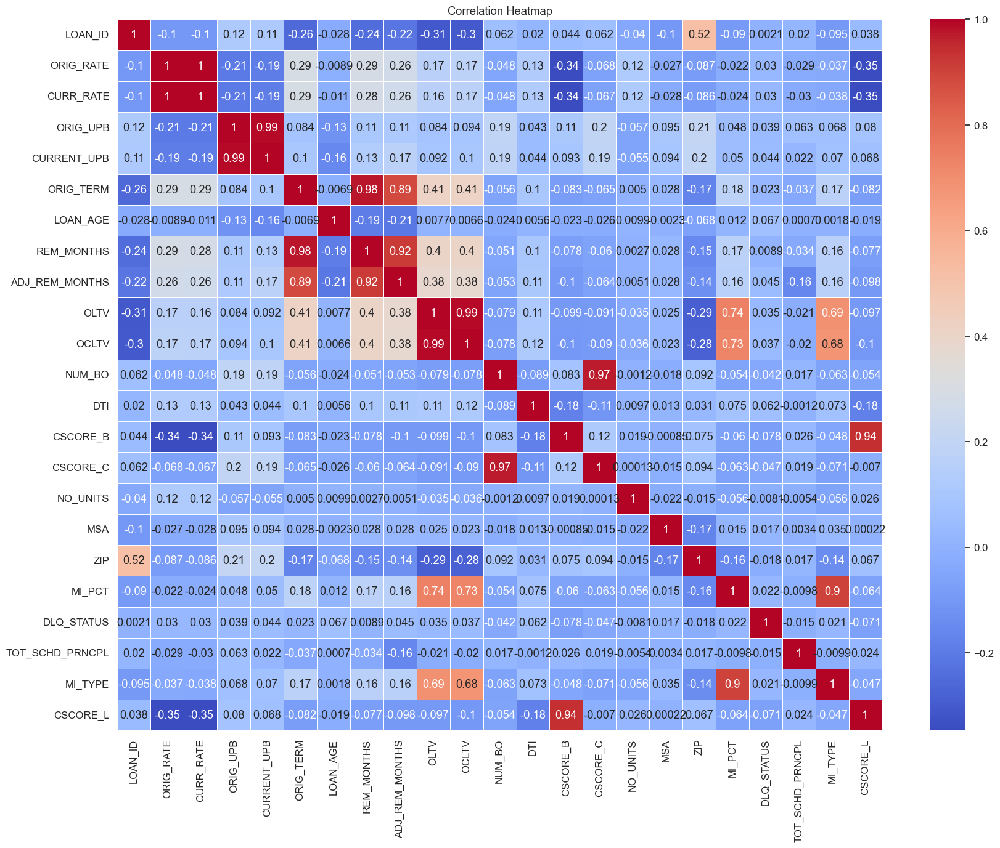

In [12]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

- **Highly Correlated features:**

1. ORIG_RATE vs. CURR_RATE ($1.0$):

    Keep ORIG_RATE (Original Interest Rate). The original interest rate is a fixed baseline for the loan's risk profile.

4. OLTV vs. OCLTV ($0.99$):

    Keep OLTV (Original Loan-to-Value). Combined LTV (OCLTV) only differs if there is a second mortgage, which is rare in this sample.

6. ORIG_UPB vs. CURRENT_UPB ($0.99$):

    Keep ORIG_UPB. For a risk model at the time of origination, the original balance is the standard predictor.

8. ORIG_TERM vs. REM_MONTHS vs. ADJ_REM_MONTHS ($0.98$):

    Keep ORIG_TERM (Original Term). The remaining months change every month, whereas the original term is a static feature easier for models to digest.

10. CSCORE_B vs. CSCORE_L ($1.0$):

    Keep CSCORE_L (Lower Credit Score). It is the lower value between CSCORE_B (Borrower Credit Score) and CSCORE_C (Co-Borrower Credit Score.). CSCORE_B and CSCORE_C will be dropped.

In [13]:
# List of redundant columns to remove based on correlation analysis
cols_to_exclude = [
    'CURR_RATE',       # Perfect correlation with ORIG_RATE
    'OCLTV',           # High correlation with OLTV
    'CURRENT_UPB',     # High correlation with ORIG_UPB
    'REM_MONTHS',      # Redundant with ORIG_TERM
    'ADJ_REM_MONTHS',  # Redundant with ORIG_TERM
    'CSCORE_B',        # Represented by engineered feature CSCORE_L
    'CSCORE_C'         # Represented by engineered feature CSCORE_L
]

# Drop the columns from the dataframe
df.drop(columns=cols_to_exclude, inplace=True)

# Verify the remaining columns
print(f"Columns removed. New dataframe shape: {df.shape}")
print(df.columns.tolist())

Columns removed. New dataframe shape: (162575, 37)
['LOAN_ID', 'ACT_PERIOD', 'CHANNEL', 'SELLER', 'SERVICER', 'ORIG_RATE', 'ORIG_UPB', 'ORIG_TERM', 'ORIG_DATE', 'FIRST_PAY', 'LOAN_AGE', 'MATR_DT', 'OLTV', 'NUM_BO', 'DTI', 'FIRST_FLAG', 'PURPOSE', 'PROP', 'NO_UNITS', 'OCC_STAT', 'STATE', 'MSA', 'ZIP', 'MI_PCT', 'DLQ_STATUS', 'PMT_HISTORY', 'MOD_FLAG', 'TOT_SCHD_PRNCPL', 'MI_TYPE', 'SERV_IND', 'HOMEREADY_PROGRAM_INDICATOR', 'RELOCATION_MORTGAGE_INDICATOR', 'PROPERTY_INSPECTION_WAIVER_INDICATOR', 'HIGH_BALANCE_LOAN_INDICATOR', 'FORBEARANCE_INDICATOR', 'ADR_TYPE', 'CSCORE_L']


## 3.6 Feature Analysis<a id='3.6_Feature_Analysis'></a>

### 3.6.1 Numerical Features<a id='3.6.1_Numerical_Features'></a>

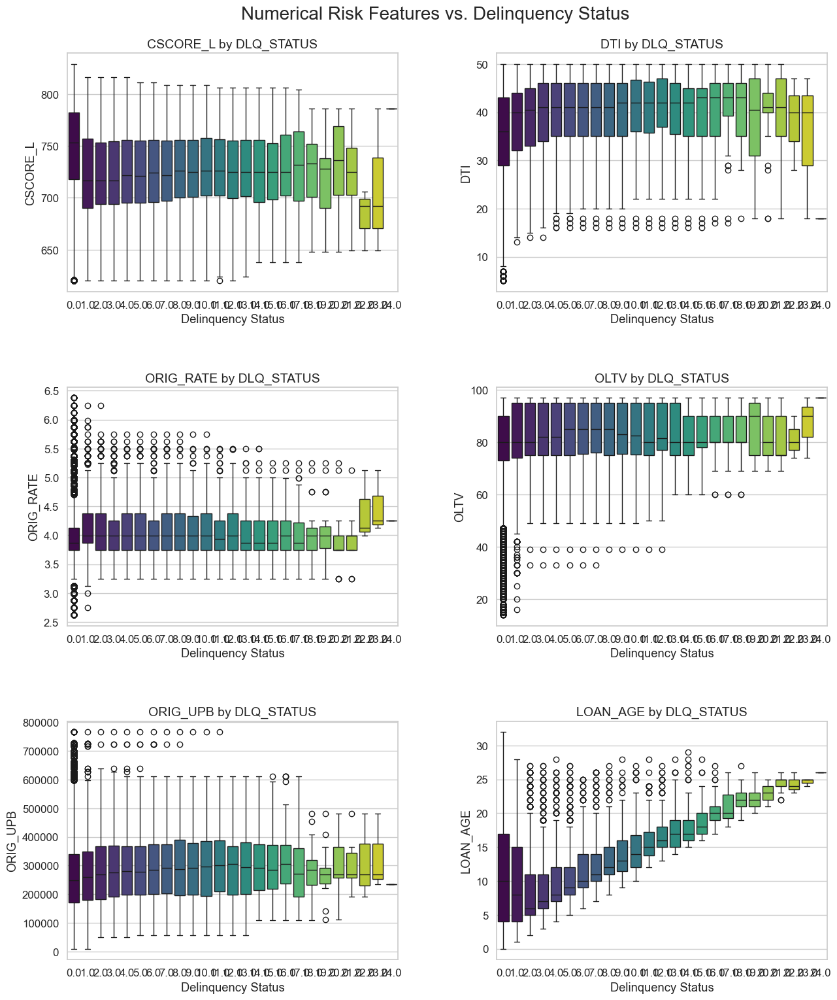

In [20]:
# Select the numerical features to compare against delinquency
num_features = ['CSCORE_L', 'DTI', 'ORIG_RATE', 'OLTV', 'ORIG_UPB', 'LOAN_AGE']

# Set up the plotting grid (3 rows, 2 columns)
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 18)) # Increased height for 3 rows
fig.subplots_adjust(hspace=0.4, wspace=0.3)

# Plot boxplots for each feature against DLQ_STATUS
for i, col in enumerate(num_features):
    # Updated indexing for 2 columns: row is i // 2, col is i % 2
    ax = axes[i // 2, i % 2]
    
    sns.boxplot(data=df, x='DLQ_STATUS', y=col, ax=ax, palette='viridis', hue='DLQ_STATUS', legend=False)
    
    ax.set_title(f'{col} by DLQ_STATUS', fontsize=14)
    ax.set_xlabel('Delinquency Status')
    ax.set_ylabel(col)

plt.suptitle('Numerical Risk Features vs. Delinquency Status', fontsize=20, y=0.92)
plt.show()

- **Primary Metric: DLQ_STATUS**

DLQ_STATUS is established as the definitive standard for evaluating loan health, directly reflecting the transition from current to default states.

Temporal Influence: LOAN_AGE exhibits a significant correlation with delinquency status, showing that loans demonstrate higher susceptibility to performance issues during specific stages of their lifecycle.

Secondary Indicators: Factors such as CSCORE_L, DTI, and ORIG_RATE show measurable trends across delinquency categories, confirming their roles as supporting risk predictors.

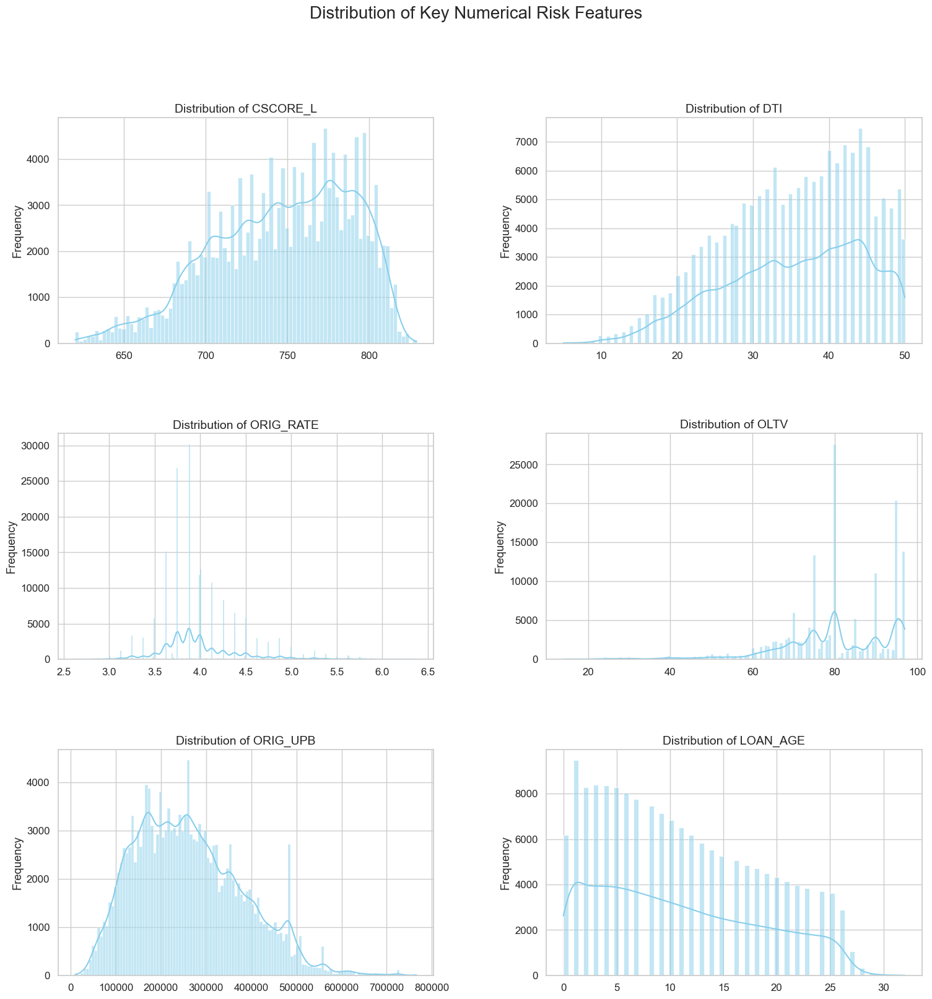

In [17]:
# Select the most important numerical features for distribution analysis
num_features = ['CSCORE_L', 'DTI', 'ORIG_RATE', 'OLTV', 'ORIG_UPB', 'LOAN_AGE']

# Set up the plotting grid
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 18))
fig.subplots_adjust(hspace=0.4, wspace=0.3)

# Plot histograms for each feature
for i, col in enumerate(num_features):
    ax = axes[i // 2, i % 2]
    sns.histplot(df[col], kde=True, ax=ax, color='skyblue')
    ax.set_title(f'Distribution of {col}', fontsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Frequency')

plt.suptitle('Distribution of Key Numerical Risk Features', fontsize=20)
plt.show()

- **Feature–price relationships:**

CSCORE_L: Exhibits a left-skewed distribution, indicating a concentration of borrowers with higher credit scores.

DTI, ORIG_UPB, and LOAN_AGE: These features are notably right-skewed, with the majority of data points clustered at lower values and long tails extending to the right.

OLTV and ORIG_RATE: Show multimodal tendencies with distinct spikes at common industry thresholds (such as the 80% LTV mark), rather than following a smooth normal distribution.

### 3.6.2 Categorical Features<a id='3.6.2_Categorical_Features'></a>

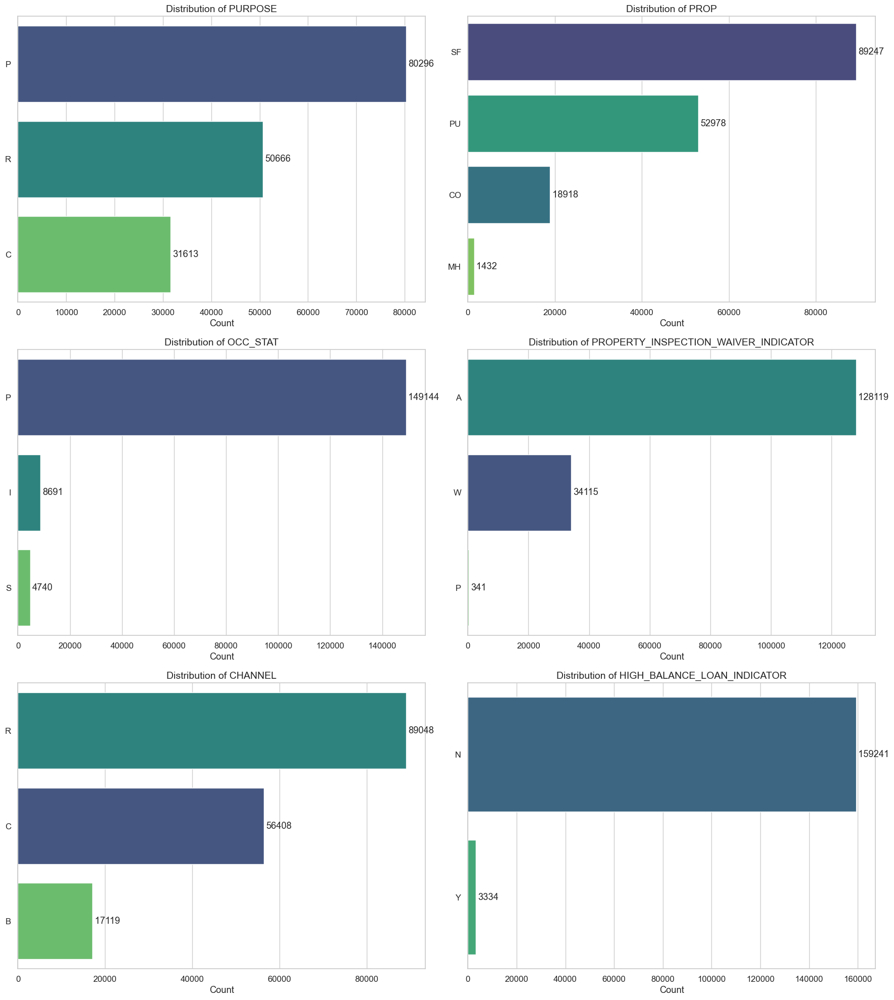

In [23]:
# Updated analysis with 6 categorical features
selected_cats = [
    'PURPOSE', 
    'PROP', 
    'OCC_STAT', 
    'PROPERTY_INSPECTION_WAIVER_INDICATOR', 
    'CHANNEL', 
    'HIGH_BALANCE_LOAN_INDICATOR'
]

# Set up a 3x2 grid
fig, axes = plt.subplots(3, 2, figsize=(18, 20))

for i, col in enumerate(selected_cats):
    # Adjust indexing for 2 columns
    ax = axes[i // 2, i % 2]
    
    # Create countplot with sorted order
    sns.countplot(
        data=df, 
        y=col, 
        order=df[col].value_counts().index, 
        ax=ax, 
        palette='viridis',
        hue=col,
        legend=False
    )
    
    ax.set_title(f'Distribution of {col}', fontsize=14)
    ax.set_xlabel('Count')
    ax.set_ylabel('')

    # Add count labels to the bars
    for container in ax.containers:
        ax.bar_label(container, fmt='%d', padding=3)

plt.tight_layout()
plt.show()

- **Geographic distribution:**

Market Concentration: The portfolio is heavily dominated by Purchase (P) loans and Single-Family (SF) properties, which are generally considered lower-risk categories compared to cash-out refinances or multi-unit dwellings.

Risk Profiles: A vast majority of loans are for Primary Residences (P), with a small fraction allocated to investment properties and second homes.

Operational Trends: Most loans utilize an Appraisal Waiver (A), and the portfolio consists almost entirely of standard conforming loans rather than High Balance indicators, suggesting a very standardized lending profile.

Acquisition Strategy: The distribution across Channels shows a primary reliance on [Top Channel from plot], indicating a specific sourcing preference that may impact overall credit quality.

### 3.6.3 Numerical vs Categorical<a id='3.6.3_Numerical_vs_Categorical'></a>

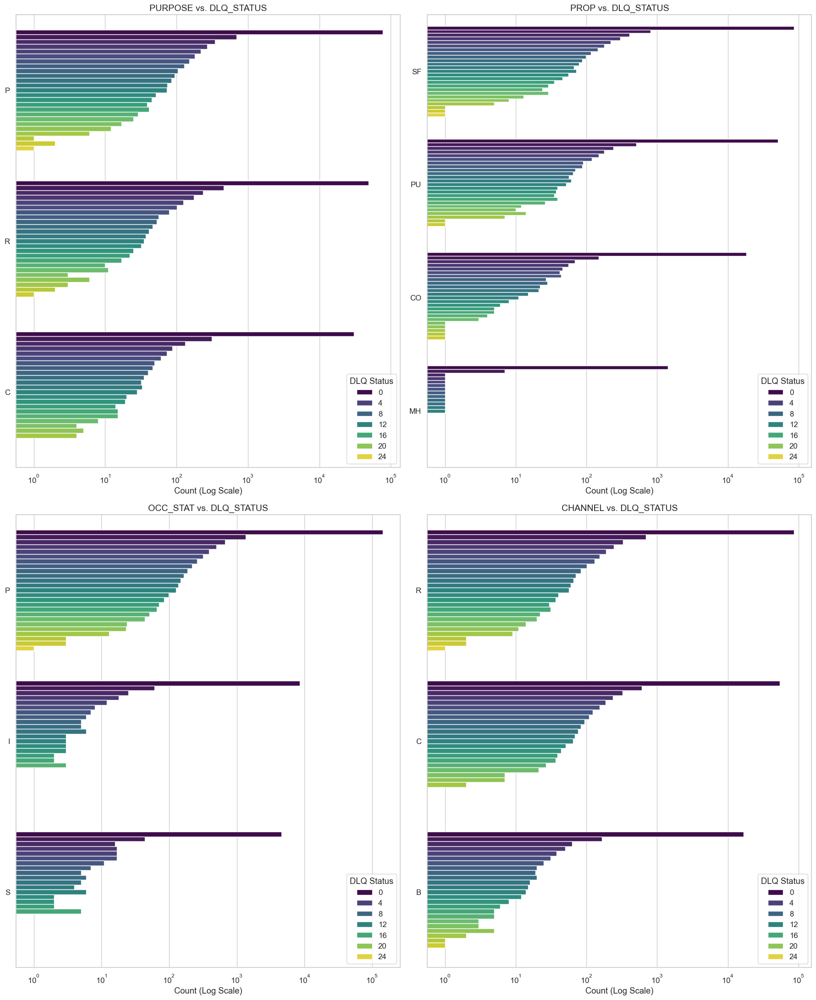

In [26]:
# Bivariate Analysis: Categorical Features vs. Delinquency Status
selected_cats = [
    'PURPOSE', 
    'PROP', 
    'OCC_STAT', 
    'CHANNEL', 
]

# Set up a 3x2 grid
fig, axes = plt.subplots(2, 2, figsize=(18, 22))

for i, col in enumerate(selected_cats):
    # Adjust indexing for 2 columns
    ax = axes[i // 2, i % 2]
    
    # Create countplot with DLQ_STATUS as the hue
    # Using a log scale because status '0' (Current) usually dwarfs other categories
    sns.countplot(
        data=df, 
        y=col, 
        hue='DLQ_STATUS', 
        order=df[col].value_counts().index,
        ax=ax, 
        palette='viridis'
    )
    
    ax.set_title(f'{col} vs. DLQ_STATUS', fontsize=14)
    ax.set_xlabel('Count (Log Scale)')
    ax.set_ylabel('')
    ax.set_xscale('log')  # Log scale makes the smaller delinquency counts visible
    ax.legend(title='DLQ Status', loc='lower right')

plt.tight_layout()
plt.show()

PURPOSE vs. Delinquency: While Purchase (P) loans comprise the majority of the portfolio, the log-scaled distributions highlight that Cash-out Refinances (C) show a higher proportional density of delinquency.

PROP vs. Delinquency: Single-Family (SF) homes exhibit the most stable performance. Other property types, despite lower overall volume, show varying degrees of delinquency risk that will be critical for target definition.

Risk Consistency: The OCC_STAT and CHANNEL plots reveal that delinquency is not restricted to a single segment, though primary residences and certain acquisition channels maintain higher "Current" (Status 0) ratios.

Log-Scale Utility: Applying a log scale to the x-axis was essential for visualizing the smaller delinquency counts (Statuses 1, 2, and 3+) that would otherwise be obscured by the high volume of performing loans.

## 3.7 Summary<a id='3.7_Summary'></a>

The Exploratory Data Analysis phase has provided a robust understanding of the factors driving mortgage risk:

Performance Benchmark: DLQ_STATUS was confirmed as the primary standard for evaluating loan health, showing a clear transition from performing to default states.

Temporal Risk Drivers: LOAN_AGE emerged as a dominant predictor, identifying specific "hazard windows" where delinquency is most likely to escalate.

Credit & Financial Indicators: Numerical analysis validated that lower CSCORE_L and higher DTI ratios correlate with increased delinquency risk.

Categorical Insights: While Purchase (P) loans and Single-Family (SF) properties dominate the volume, Cash-out Refinances (C) and non-primary residences show higher proportional densities of delinquency.

Data Readiness: The dataset has been refined to 26 key features and saved as data_02_analyzed.csv, providing a clean foundation for the modeling phase.

In [27]:
output_path = "../data/processed/mrm_data_02_analyzed.csv"
os.makedirs(os.path.dirname(output_path), exist_ok=True)
df.to_csv(output_path, index=False)
print(f"Updated data saved to {output_path}")
print(f"Shape: {df.shape}")

Updated data saved to ../data/processed/mrm_data_02_analyzed.csv
Shape: (162575, 37)


In [7]:
df['LOAN_ID'].nunique()

8529

In [8]:
df.groupby('STATE')['LOAN_ID'].count()

STATE
CO    67482
GA    38254
MI    26038
OH    19922
VA    15930
Name: LOAN_ID, dtype: int64

In [9]:
df.groupby('STATE')['LOAN_ID'].nunique()

STATE
CO    3725
GA    1812
MI    1295
OH     908
VA     789
Name: LOAN_ID, dtype: int64

- **Dataset overview:**

The consolidated dataset contains mortgage records from five states (CO, GA, MI, OH, and VA). Key takeaways from the initial inspection include:

Total Records: 167,630 rows across 108 columns.

Unique Loans: 104,924 unique LOAN_IDs, indicating a longitudinal structure where multiple rows exist for individual loans.

State Distribution (Unique): Colorado has the highest representation (27,121 loans), while Ohio has the lowest (15,667 loans).

Data Types: Predominantly numerical (84 floats, 2 integers) with 22 categorical string columns.

Data Sparsity: Several features, such as POOL_ID and DEAL_NAME, appear to be entirely empty and will require removal.

# Step 2: Define 'bad'

* The purpose of developing a Mortgage Default Model is to classify loans as either 'good' or 'bad.' 
* A new column labeled 'bad' will be added, where a value of '1' indicates a 'bad' loan (i.e., defaulted) and '0' indicates a 'good' loan (i.e., not defaulted).

In [8]:
df.columns.tolist()

['POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS',
 'REPUR

* The column 'DLQ_Status' (Delinquency Status) indicates the number of months the client has failed to make their monthly loan payments. 
* The values range from 0 to 24, where 0 means the loan is current and higher numbers represent increasing months of delinquency.

In [9]:
df.groupby('DLQ_STATUS')['LOAN_ID'].count()

DLQ_STATUS
0     2019379
1       14783
2        7204
3        5353
4        3983
5        3351
6        2724
7        2209
8        1934
9        1704
10       1510
11       1368
12       1146
13        963
14        856
15        746
16        617
17        557
18        409
19        296
20        250
21        145
22         70
23         40
24         14
Name: LOAN_ID, dtype: int64

* A threshold of 6 is used to define 'bad' loans. 
* DLQ_Status values less than 6 are defined as 'good', while values equal to or greater than 6 are defined as 'bad'.

In [10]:
df['bad']=np.where(df['DLQ_STATUS'] >= 6, 1, 0)
df_bad=df.groupby('LOAN_ID')['bad'].sum().reset_index()
df_bad['bad']=np.where(df_bad['bad'] > 0, 1, 0)

In [11]:
df_bad.head

<bound method NDFrame.head of          LOAN_ID  bad
0       98836742    0
1       98836743    0
2       98836744    0
3       98836781    0
4       98836789    0
...          ...  ...
104919  99520417    0
104920  99520428    0
104921  99520430    0
104922  99520446    1
104923  99520476    0

[104924 rows x 2 columns]>

In [12]:
print(df_bad['bad'].mean())
print(df_bad['bad'].sum())

0.02353131790629408
2469


* Out of 104,924 loan accounts, there are 2,469 'bad' loans, which represent 2.35% of the total.

# Step 3: Define prepayment
* When a loan is completely paid off before reaching its full maturity, a prepayment occurs. There are several types of prepayment:

    * Voluntary prepayment: The borrower chooses to pay off the loan early, either by making extra payments or paying the full outstanding balance. This can happen when the borrower has extra funds or refinances the loan at better terms. In such cases, the old loan is removed from the books.

    * Involuntary prepayment: This occurs when a loan is paid off early due to external events such as foreclosure, charge-off, or the sale of the property by the lender after a default. These types of prepayments should be excluded in this case.

* Asset holders (usually banks) prefer loans with low default rates and low prepayment rates.

In [13]:
df.groupby('Zero_Bal_Code')['LOAN_ID'].count()

Zero_Bal_Code
1.0     54061
2.0         3
6.0        98
9.0         4
16.0        5
Name: LOAN_ID, dtype: int64

In [14]:
df['prepaid']=np.where(df['Zero_Bal_Code'] > 0, 1, 0)
df_prepaid=df.groupby('LOAN_ID')['prepaid'].sum().reset_index()
df_prepaid['prepaid']=np.where(df_prepaid['prepaid'] > 0, 1, 0)

* The 'prepaid' column is created to indicate whether the loan has been prepaid or is current. 
* Zero_Bal_Code indicates if the loan has been prepaid: 
    * Values greater than 1 mean the loan is prepaid
    * Values less than 1 or missing indicate the loan is current.

### Combine payment default and prepayment data

* Involuntary prepayments are marked as both 'bad' and 'prepaid' because the balance was written off.
* These cases need to be identified, and the 'prepaid' label should be changed to '0' to exclude them from voluntary prepayments

In [15]:
df_bad_prepaid=pd.merge(df_bad, df_prepaid, on='LOAN_ID', how='inner')
df_bad_prepaid['prepaid']=np.where((df_bad_prepaid['bad']==1) & (df_bad_prepaid['prepaid']==1), 0, df_bad_prepaid['prepaid'])

In [16]:
df_bad_prepaid[['bad', 'prepaid']].mean()

bad        0.023531
prepaid    0.509645
dtype: float64

* About 2.35% of the loans are classified as bad, representing an unbalanced sample.
* About 51% of the loans are voluntarily prepaid, which can be considered a balanced sample.

In [17]:
df_bad_prepaid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104924 entries, 0 to 104923
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   LOAN_ID  104924 non-null  int64
 1   bad      104924 non-null  int32
 2   prepaid  104924 non-null  int32
dtypes: int32(2), int64(1)
memory usage: 2.4 MB


<div align="center">
    
# Mortage Risk Modeling
# 4.0 Feature Engineering

# Step 4: Convert character/text/categorical variables to dummy variables

Select relevant features for further analysis.

In [18]:
df.columns.tolist()

['POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS',
 'REPUR

In [19]:
columns_to_keep=["ACT_PERIOD", "POOL_ID", "LOAN_ID", "ACT_PERIOD", "CHANNEL", "ORIG_RATE", "CURR_RATE", "ORIG_UPB", "ISSUANCE_UPB",
                 "CURRENT_UPB", "ORIG_TERM", "ORIG_DATE", "OLTV", "OCLTV",
                 "DTI", "CSCORE_B", "CSCORE_C", "PURPOSE",
                 "PROP", "NO_UNITS", "STATE", "MSA", "ZIP", "MI_PCT", "DLQ_STATUS", "ORIGINAL_LIST_PRICE",
                 "CURRENT_LIST_PRICE"]

In [20]:
df_nodup=df.drop_duplicates(subset='LOAN_ID', keep='first').reset_index()

In [21]:
df_nodup.groupby('PURPOSE')['LOAN_ID'].count()

PURPOSE
C    26651
P    37427
R    40846
Name: LOAN_ID, dtype: int64

Purpose of loans:
* C (Cash-out Refinance)
* P (Purchase)
* R (Rate/Term Refinance)

In [22]:
# Create dummy variables for 'purpose'
df_nodup['purpose_rate_refi']=np.where(df_nodup['PURPOSE'].str.strip()=='R', 1, 0)
df_nodup['purpose_cashout_refi']=np.where(df_nodup['PURPOSE'].str.strip()=='C', 1, 0)

In [23]:
df.groupby('PROP')['LOAN_ID'].count()

PROP
CO     216617
CP        550
MH      15317
PU     606558
SF    1232569
Name: LOAN_ID, dtype: int64

Type of Property:
* CO: Condominium
* CP: Cooperative Housing (Co-op)
* MH: Manufactured Housing
* PU: Planned Unit Development (PUD)
* SF: Single-Family Residence

In [24]:
# Create dummy variables for 'property'
df_nodup['property_pud']=np.where(df_nodup['PROP'].str.strip()=='PU', 1, 0)
df_nodup['property_condo']=np.where(df_nodup['PROP'].str.strip()=='CO', 1, 0)
df_nodup['property_other']=np.where(df_nodup['PROP'].str.strip().isin(['CP', 'MH']), 1, 0)

In [25]:
df_nodup.groupby('ORIG_TERM')['LOAN_ID'].count()

ORIG_TERM
96        71
108       18
120     1609
121        1
132       24
       ...  
356        1
357        1
358        1
359        1
360    77853
Name: LOAN_ID, Length: 101, dtype: int64

In [26]:
# Create dummy variables for 'term'
df_nodup['term_30years']=np.where(df_nodup['ORIG_TERM']==360, 1, 0)
df_nodup['term_15years']=np.where(df_nodup['ORIG_TERM']==180, 1, 0)

* Columns 'term_30years' and 'term_15years' are created because they may have a strong impact and will be analyzed at the end.

In [27]:
df_nodup['mi']=np.where(df_nodup['MI_PCT'] > 0, 1, 0)

* The 'mi' column is created to indicate whether Mortgage Insurance was purchased, as it may have a strong impact on the target variable.

In [28]:
df_nodup.groupby('PRODUCT')['LOAN_ID'].count()

PRODUCT
FRM    104924
Name: LOAN_ID, dtype: int64

* Column 'PRODUCT' doesn't show variety.

In [29]:
df_nodup.columns.tolist()

['index',
 'POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS

In [30]:
columns_to_keep=['LOAN_ID', 'PURPOSE', 'purpose_rate_refi', 'purpose_cashout_refi', 'property_pud', 'property_condo', 'property_other', 
                'term_30years', 'term_15years', 'mi', 'CSCORE_B', 'DTI', 'OLTV', 'ORIG_UPB']

In [31]:
df_select=pd.merge(df_nodup[columns_to_keep], df_bad_prepaid, on='LOAN_ID', how='inner')

In [32]:
df_select.describe().T

,count,mean,std,min,25%,50%,75%,max
LOAN_ID,104924.0,9.917922e+07,197019.945107,98836742.0,99009455.75,99180553.5,99349026.75,99520476.0
purpose_rate_refi,104924.0,3.892913e-01,0.487592,0.0,0.00,0.0,1.00,1.0
purpose_cashout_refi,104924.0,2.540029e-01,0.435301,0.0,0.00,0.0,1.00,1.0
property_pud,104924.0,3.136461e-01,0.463977,0.0,0.00,0.0,1.00,1.0
property_condo,104924.0,1.024360e-01,0.303222,0.0,0.00,0.0,0.00,1.0
property_other,104924.0,6.376044e-03,0.079596,0.0,0.00,0.0,0.00,1.0
term_30years,104924.0,7.419942e-01,0.437539,0.0,0.00,1.0,1.00,1.0
term_15years,104924.0,1.481930e-01,0.355293,0.0,0.00,0.0,0.00,1.0
mi,104924.0,2.826999e-01,0.450314,0.0,0.00,0.0,1.00,1.0
CSCORE_B,104873.0,7.567624e+02,42.412137,620.0,729.00,766.0,791.00,835.0


# Step 5: Generate additional features

In [33]:
# Create 'home_value' and 'home_value_log' as additional feature
df_select['home_value']=df_select['ORIG_UPB']/df_select['OLTV']
df_select['home_value_log']=np.log(df_select['home_value'])

In [34]:
df_select.describe().T

,count,mean,std,min,25%,50%,75%,max
LOAN_ID,104924.0,9.917922e+07,197019.945107,9.883674e+07,9.900946e+07,9.918055e+07,9.934903e+07,9.952048e+07
purpose_rate_refi,104924.0,3.892913e-01,0.487592,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
purpose_cashout_refi,104924.0,2.540029e-01,0.435301,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
property_pud,104924.0,3.136461e-01,0.463977,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
property_condo,104924.0,1.024360e-01,0.303222,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
property_other,104924.0,6.376044e-03,0.079596,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
term_30years,104924.0,7.419942e-01,0.437539,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
term_15years,104924.0,1.481930e-01,0.355293,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
mi,104924.0,2.826999e-01,0.450314,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
CSCORE_B,104873.0,7.567624e+02,42.412137,6.200000e+02,7.290000e+02,7.660000e+02,7.910000e+02,8.350000e+02


* There are missing values in column 'CSCORE_B' and 'DTI'

In [35]:
# Remove rows that have missing values
df_select=df_select[(df_select['CSCORE_B'] > 0) & (df_select['DTI'] >= 0)]

In [36]:
# create additional features
df_select['DTI_LTV']=df_select['DTI']*df_select['OLTV']*100
df_select['DTI_LTV2']=df_select['DTI']/df_select['OLTV']
df_select['DTI_UPB_log']=df_select['DTI']*df_select['ORIG_UPB']
df_select['DTI_UPB_log2']=df_select['DTI']/df_select['ORIG_UPB']*100

* DTI: Debt-to-Income ratio
* OLTV: Original Loan-to-Value ratio
* ORIG_UPB: Original Unpaid Principal Balance

# Step 6: Split the sample into modeling sample and validation sample

In [37]:
#!pip install xgboost
#!pip install featurewiz
#!pip install imlearn
#!pip install Pillow==9.0.0

In [38]:
# split the sample to modeling sample and validation sample
df_select['random']=np.random.uniform(0, 1, len(df_select['LOAN_ID']))
df_select['seg']=np.where(df_select['random'] <= 0.6, 'mod', 'val')

In [39]:
df_select.groupby('seg')['LOAN_ID'].count()

seg
mod    62810
val    42061
Name: LOAN_ID, dtype: int64

<div align="center">
    
# Mortage Risk Modeling
# 5.0 Modeling

<div align="center">
    
# Mortage Risk Modeling
# 6.0 Deep Learning

# Step 7: Prepayment Model

In [40]:
!pip install featurewiz
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from featurewiz import featurewiz
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

tensorflow >= 2.5 not installed in machine. Please install and try again. 


NameError: name 'layers' is not defined

* Develop an evaluation function and output AUC-ROC as the weight for ensemble method later.

In [41]:
def model_evaluation():

    #Accuracy score
    print('Accuracy: %.3f' % accuracy_score(y_test, preds))

    #Precision score - model precision score represents the model’s ability to correctly predict the positives out of all the positive predictions it made
    print('Precision: %.3f' % precision_score(y_test, preds)) 

    #Recall score - model recall score represents the model’s ability to correctly predict the positives out of actual positives
    print('Recall: %.3f' % recall_score(y_test, preds))

    #Confusion matrix
    ConfusionMatrixDisplay.from_estimator(model, X_test, y_test)       

    #ROC & AUC
    #Generate a baseline prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test))]

    #Predict probabilities
    lr_probs = model.predict_proba(X_test)

    #Keep probabilities for the positive outcome only
    lr_probs = lr_probs[:, 1]

    #Calculate scores
    ns_auc = roc_auc_score(y_test, ns_probs)
    lr_auc = roc_auc_score(y_test, lr_probs)

    #Summarize scores
    print('Baseline: ROC AUC = %.3f' % (ns_auc))
    print(model_name+': ROC AUC = %.3f' % (lr_auc))

    #Calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
    lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)

    #Plot the roc curve for the model
    plt.figure()
    plt.plot(ns_fpr, ns_tpr, linestyle = '--', label = 'Baseline')
    plt.plot(lr_fpr, lr_tpr, marker = '.', label = model_name)

    #Axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.title("ROC Curve")
    plt.show()

    #Predicted vs. actual graphs
    actuals_y = pd.DataFrame(data = actuals, columns = [target])
    probs_y = pd.DataFrame(data = probs, columns = ['score1', 'score2'])
    actuals_probs = pd.concat([actuals_y, probs_y], axis = 1)
    num_bins = 20
    binlabels = list(range(0, num_bins))
    actuals_probs['score_bin'] = pd.qcut(actuals_probs['score2'].rank(method = 'first'), num_bins, labels = binlabels)
    actuals_probs['score_bin'] = num_bins - actuals_probs['score_bin'].astype(int)
    df_grp = actuals_probs.groupby('score_bin')['score2'].mean()
    df_grp.plot()
    df_grp2 = actuals_probs.groupby('score_bin')[target].mean()
    df_grp2.plot()
    plt.legend(["Predicted", "Actual"])
    plt.xlabel('Score Bin')
    plt.title("Predicted vs. Actual")
    
    # save AUC ROC and use it as the weight in the ensemble method later
    return(lr_auc)

#### Define the target variable

In [42]:
target='prepaid'

In [43]:
X=['purpose_rate_refi', 'purpose_cashout_refi', 'property_pud', 'property_condo', 'property_other',
   'term_30years', 'term_15years', 'mi', 'CSCORE_B', 'DTI', 'OLTV', 'ORIG_UPB', 'home_value', 'home_value_log',
   'DTI_LTV', 'DTI_LTV2', 'DTI_UPB_log', 'DTI_UPB_log2']

In [44]:
# examine correlations 
df_select[df_select['seg']=='mod'][X].corr()

,purpose_rate_refi,purpose_cashout_refi,property_pud,property_condo,property_other,term_30years,term_15years,mi,CSCORE_B,DTI,OLTV,ORIG_UPB,home_value,home_value_log,DTI_LTV,DTI_LTV2,DTI_UPB_log,DTI_UPB_log2
purpose_rate_refi,1.000000,-0.465311,0.017251,-0.023232,-0.023364,-0.203582,0.110110,-0.075720,0.108582,-0.106009,-0.142433,0.108184,0.158503,0.175011,-0.158722,-0.004285,0.033704,-0.136805
purpose_cashout_refi,-0.465311,1.000000,-0.059099,-0.062685,-0.012574,-0.109808,0.078581,-0.366155,-0.127067,0.029839,-0.327986,-0.132433,0.008809,0.014603,-0.178282,0.209060,-0.099055,0.100793
property_pud,0.017251,-0.059099,1.000000,-0.228270,-0.055078,0.051472,-0.036813,0.019430,0.063487,0.022034,0.020970,0.333503,0.290460,0.329183,0.032717,-0.002746,0.289816,-0.254107
property_condo,-0.023232,-0.062685,-0.228270,1.000000,-0.027699,0.015991,0.007700,0.028563,0.041362,0.021478,0.031782,-0.080873,-0.091172,-0.079459,0.033620,-0.006139,-0.061186,0.047155
property_other,-0.023364,-0.012574,-0.055078,-0.027699,1.000000,-0.006279,0.000480,0.016159,-0.035898,0.011173,0.006665,-0.080661,-0.076802,-0.102113,0.011662,0.005115,-0.063420,0.100375
term_30years,-0.203582,-0.109808,0.051472,0.015991,-0.006279,1.000000,-0.707873,0.236525,-0.053342,0.122739,0.315888,0.166386,0.015760,0.023728,0.267383,-0.118286,0.191141,-0.082717
term_15years,0.110110,0.078581,-0.036813,0.007700,0.000480,-0.707873,1.000000,-0.190090,0.038292,-0.104585,-0.253491,-0.130002,-0.003342,-0.020509,-0.216436,0.095417,-0.151319,0.072050
mi,-0.075720,-0.366155,0.019430,0.028563,0.016159,0.236525,-0.190090,1.000000,-0.068283,0.105255,0.682886,0.112455,-0.175521,-0.163734,0.483834,-0.289097,0.149263,-0.060944
CSCORE_B,0.108582,-0.127067,0.063487,0.041362,-0.035898,-0.053342,0.038292,-0.068283,1.000000,-0.206768,-0.103362,0.122534,0.164010,0.176420,-0.206050,-0.064206,0.005997,-0.180675
DTI,-0.106009,0.029839,0.022034,0.021478,0.011173,0.122739,-0.104585,0.105255,-0.206768,1.000000,0.142551,0.041503,-0.030903,-0.015061,0.805706,0.572281,0.505766,0.341167


<Axes: >

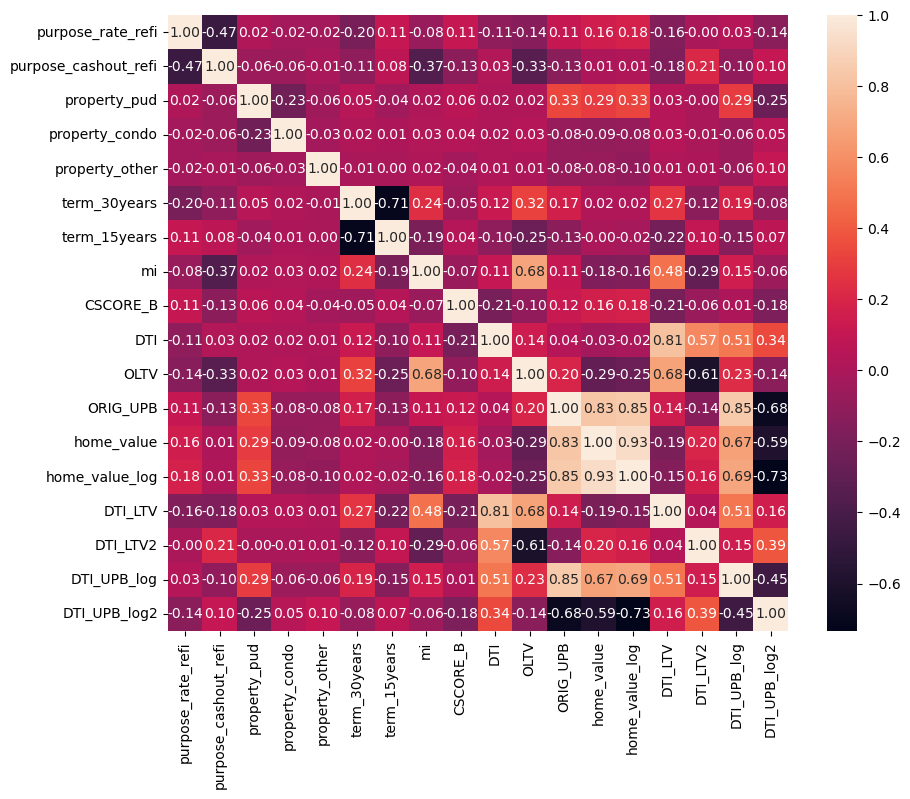

In [45]:
# visualize the correlation
fig=plt.figure(figsize=(10, 8))
sns.heatmap(df_select[df_select['seg']=='mod'][X].corr(), annot=True, fmt=".2f")

#### The following variables are removed because they show strong correlations (greater than 0.8) with other original features.
* home_value
* home_value_log
* DTI_LTV
* DTI_UPB_log

In [46]:
X=['purpose_rate_refi', 'purpose_cashout_refi', 'property_pud', 'property_condo', 'property_other',
   'term_30years', 'term_15years', 'mi', 'CSCORE_B', 'DTI', 'OLTV', 'ORIG_UPB', 'DTI_LTV2', 'DTI_UPB_log2']

X_train=df_select[df_select['seg']=='mod'][X]
y_train=df_select[df_select['seg']=='mod'][target]

X_test=df_select[df_select['seg']=='val'][X]
y_test=df_select[df_select['seg']=='val'][target]

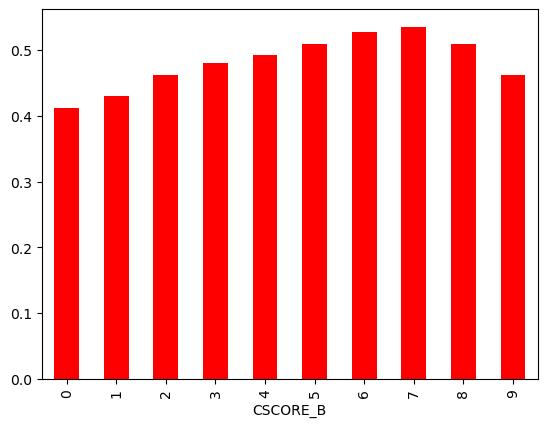

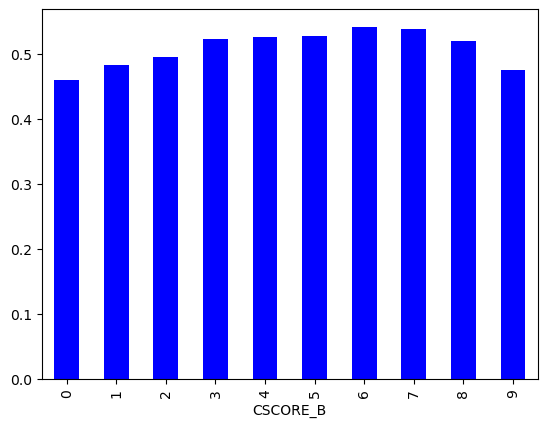

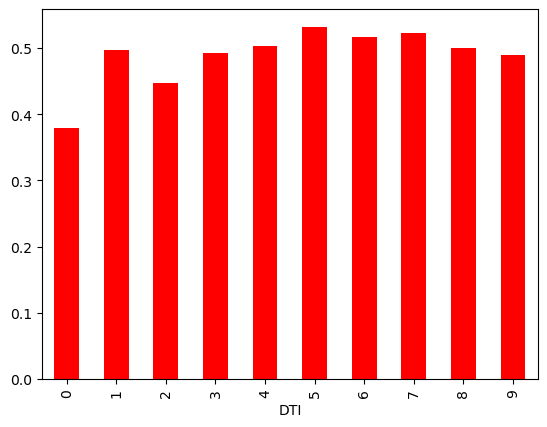

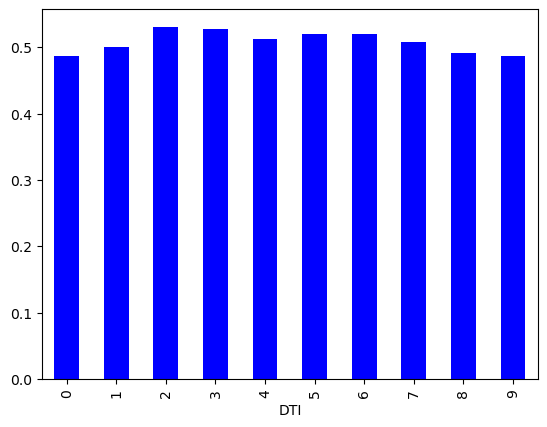

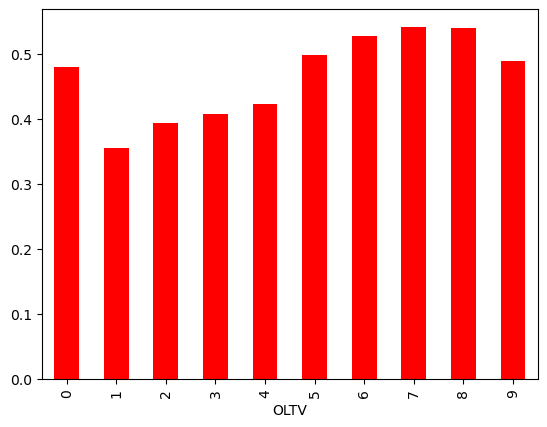

...

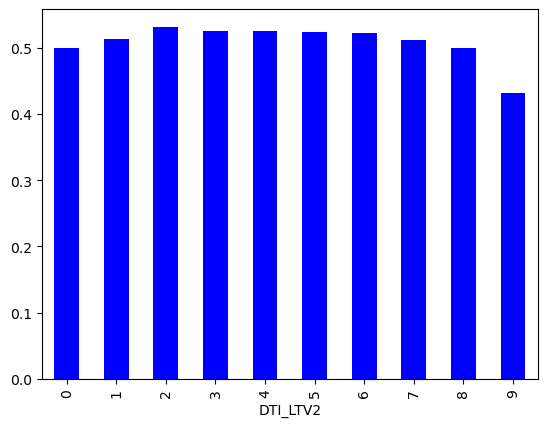

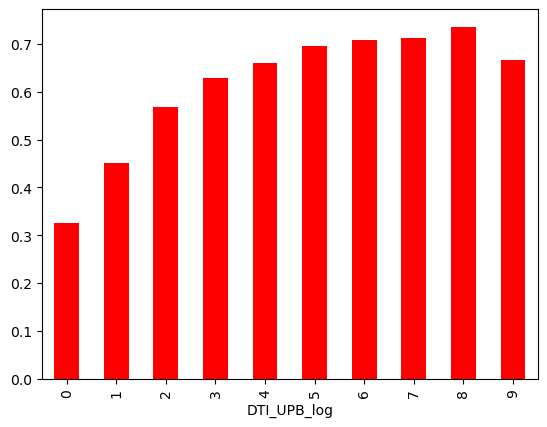

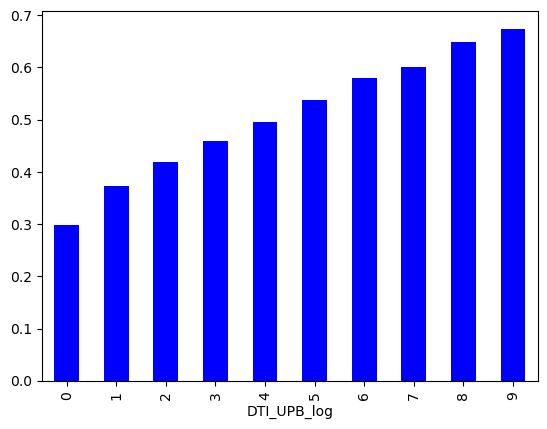

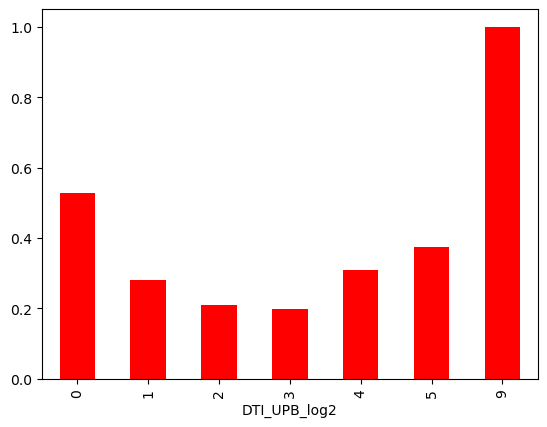

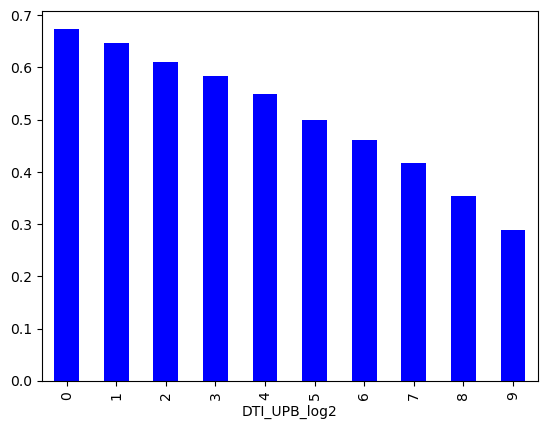

In [47]:
samp_mod=df_select[df_select['seg']=='mod']

def explore_numeric(x):
    # cut x into 10 bins according to its value
    samp_mod['value_ranks']=pd.cut(samp_mod[x], 10, labels=False)
    # print(samp_mod.groupby(['value_ranks']).size())
    # print(samp_mod[x].groupby(samp_mod['value_ranks']).mean())
    samp_mod[target].groupby(samp_mod['value_ranks']).mean().plot(kind='bar', color='red')
    plt.xlabel(x)
    plt.show()
    
    # cut x into 10 evenly distributed bins
    samp_mod['dist_ranks']=pd.qcut(samp_mod[x], 10, labels=False, duplicates="drop")
    # print(samp_mod.groupby(['dist_ranks']).size())
    # print(samp_mod[x].groupby(samp_mod['dist_ranks']).mean())
    samp_mod[target].groupby(samp_mod['dist_ranks']).mean().plot(kind='bar', color='blue')
    plt.xlabel(x)
    plt.show()

explore_numeric('CSCORE_B')
explore_numeric('DTI')
explore_numeric('OLTV')
explore_numeric('ORIG_UPB')
explore_numeric('home_value')
explore_numeric('DTI_LTV')
explore_numeric('DTI_LTV2')
explore_numeric('DTI_UPB_log')
explore_numeric('DTI_UPB_log2')

In [48]:
df_select.groupby('seg')['LOAN_ID'].count()

seg
mod    62810
val    42061
Name: LOAN_ID, dtype: int64

In [49]:
X_train[X].describe().T

,count,mean,std,min,25%,50%,75%,max
purpose_rate_refi,62810.0,0.388712,0.487462,0.000000,0.0000,0.000000,1.000000,1.000000
purpose_cashout_refi,62810.0,0.254004,0.435303,0.000000,0.0000,0.000000,1.000000,1.000000
property_pud,62810.0,0.312196,0.463393,0.000000,0.0000,0.000000,1.000000,1.000000
property_condo,62810.0,0.102977,0.303932,0.000000,0.0000,0.000000,0.000000,1.000000
property_other,62810.0,0.006639,0.081210,0.000000,0.0000,0.000000,0.000000,1.000000
term_30years,62810.0,0.741076,0.438047,0.000000,0.0000,1.000000,1.000000,1.000000
term_15years,62810.0,0.148989,0.356080,0.000000,0.0000,0.000000,0.000000,1.000000
mi,62810.0,0.282694,0.450312,0.000000,0.0000,0.000000,1.000000,1.000000
CSCORE_B,62810.0,756.775482,42.387894,620.000000,729.0000,766.000000,791.000000,835.000000
DTI,62810.0,34.142859,9.570540,1.000000,27.0000,35.000000,42.000000,50.000000


Accuracy: 0.614
Precision: 0.630
Recall: 0.594
Baseline: ROC AUC = 0.500
Logistic Regression - Prepayment: ROC AUC = 0.657


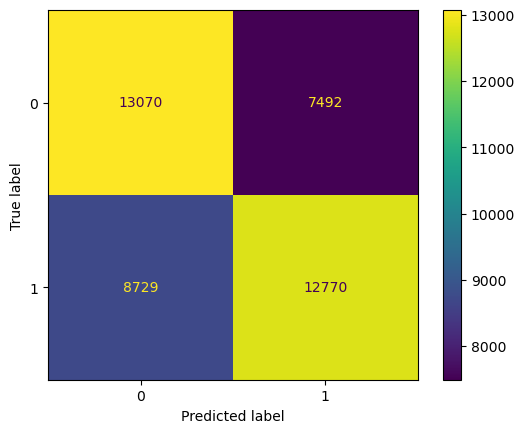

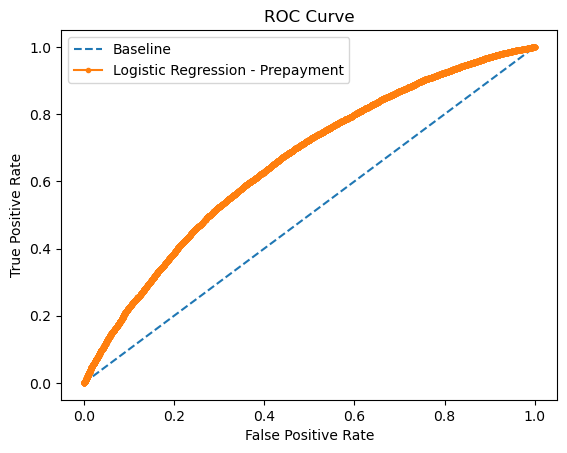

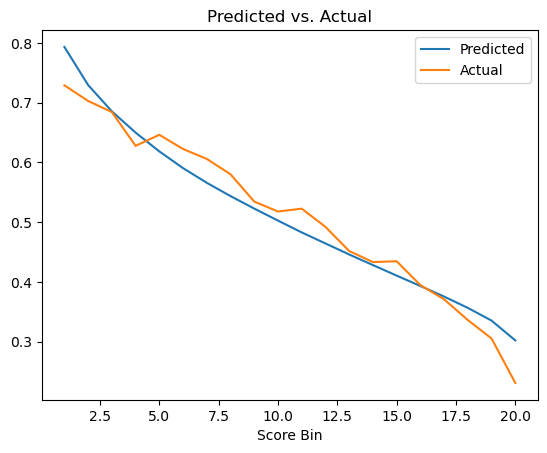

In [50]:
# 1) logistic regression
model=LogisticRegression()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Logistic Regression - Prepayment'

LR=model_evaluation()

Accuracy: 0.616
Precision: 0.609
Recall: 0.693
Baseline: ROC AUC = 0.500
Decision Tree - Prepayment: ROC AUC = 0.652


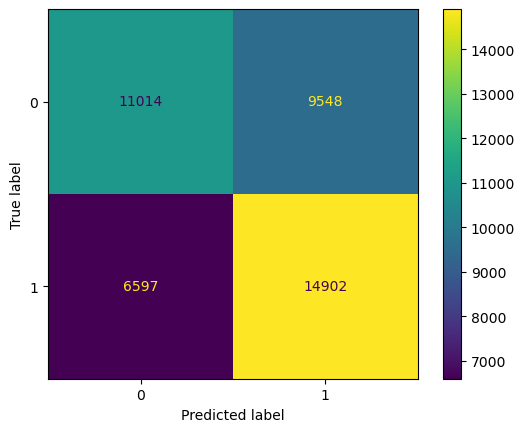

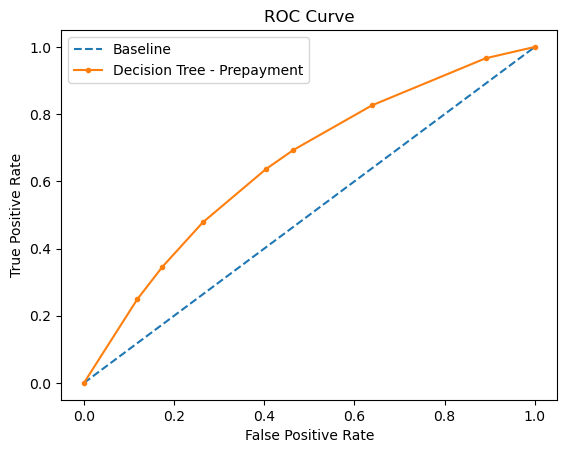

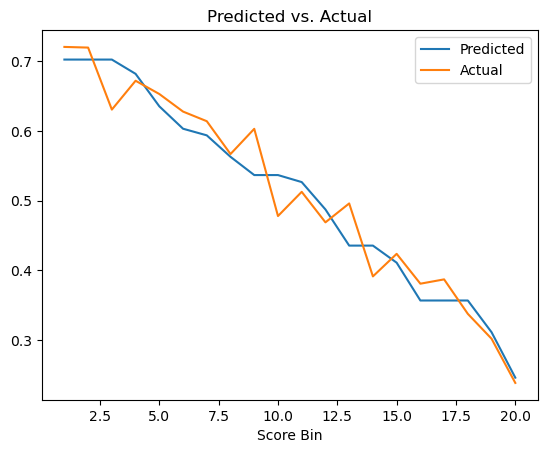

In [51]:
# 2) Decision Tree
model=DecisionTreeClassifier(max_depth=3, random_state=101, max_features=None, min_samples_leaf=3)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Decision Tree - Prepayment'

DT=model_evaluation()

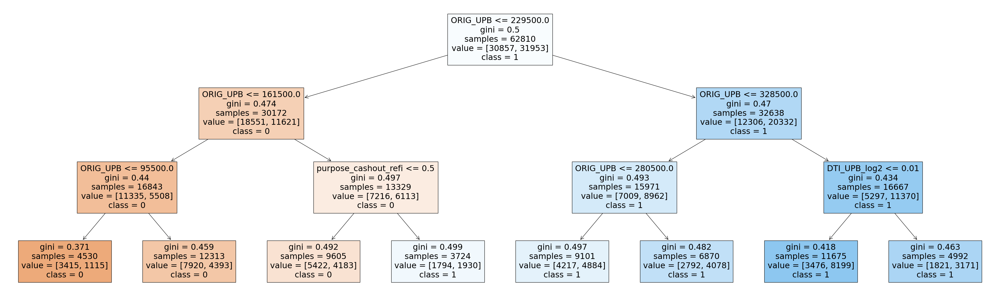

In [52]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

model=DecisionTreeClassifier(max_depth=3, random_state=101, max_features=None, min_samples_leaf=3)
model=model.fit(X_train, y_train)

fig=plt.figure(figsize=(50, 15))
_ =tree.plot_tree(model, 
                  feature_names=X_train.columns, 
                  class_names=['0', '1'], filled=True)

Accuracy: 0.614
Precision: 0.635
Recall: 0.576
Baseline: ROC AUC = 0.500
Naive Bayes - Prepayment: ROC AUC = 0.649


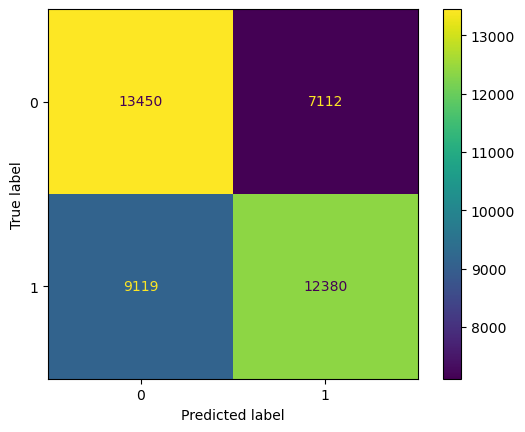

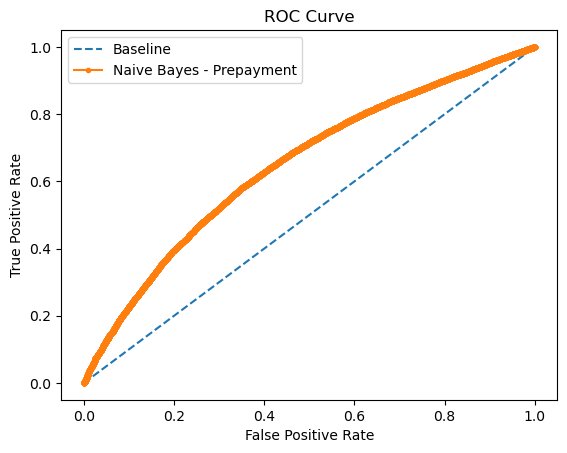

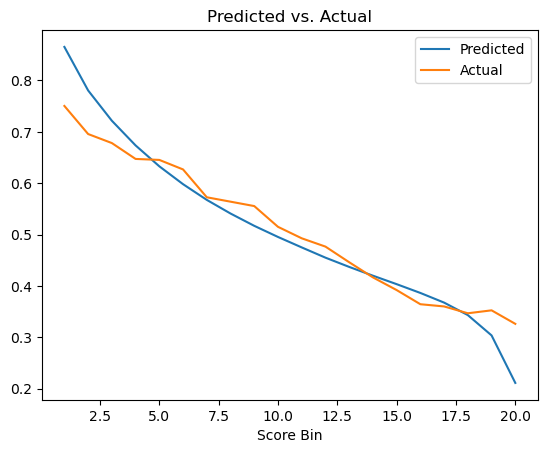

In [53]:
# 3) Naive Bayes
model=GaussianNB()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Naive Bayes - Prepayment'

NB=model_evaluation()

Accuracy: 0.617
Precision: 0.616
Recall: 0.667
Baseline: ROC AUC = 0.500
Stochastic Gradient Descent - Prepayment: ROC AUC = 0.616


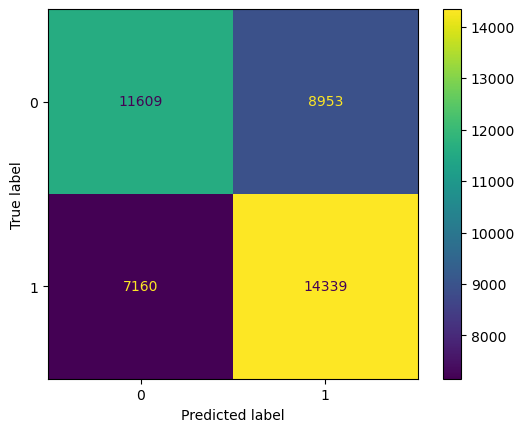

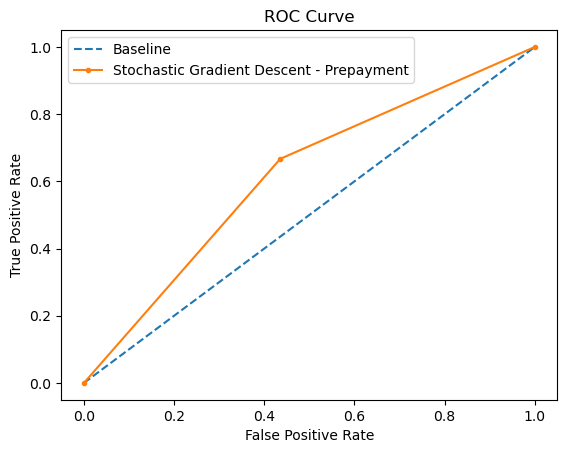

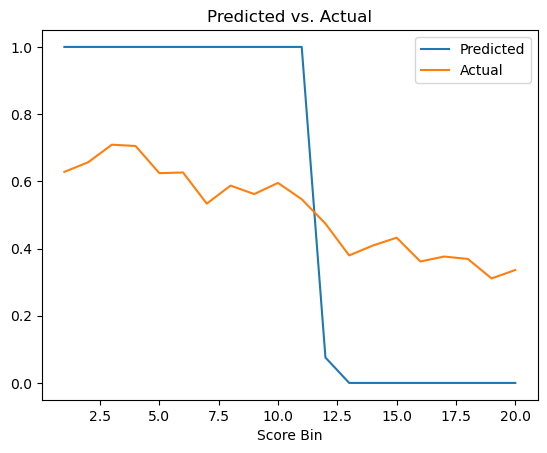

In [54]:
# 4) Stochastic Gradient Descent
model=SGDClassifier(loss='modified_huber', shuffle=True, random_state=101)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Stochastic Gradient Descent - Prepayment'

SGD=model_evaluation()

Accuracy: 0.594
Precision: 0.598
Recall: 0.630
Baseline: ROC AUC = 0.500
KNN - Prepayment: ROC AUC = 0.623


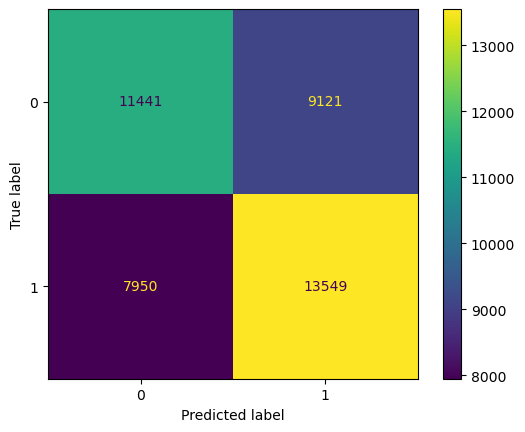

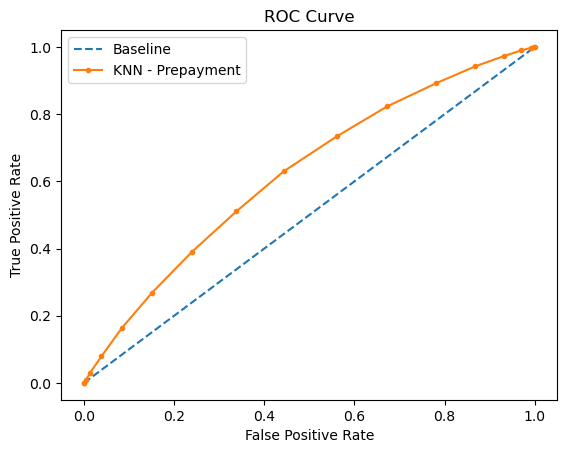

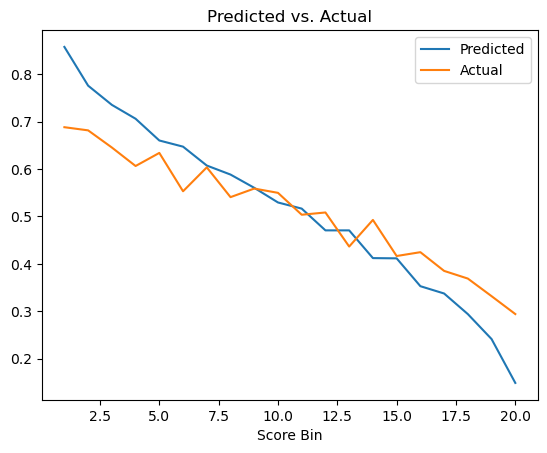

In [55]:
# 5) K Nearest Neighborhood (KNN)
model=KNeighborsClassifier(n_neighbors=17)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='KNN - Prepayment'

KNN=model_evaluation()

Accuracy: 0.621
Precision: 0.624
Recall: 0.653
Baseline: ROC AUC = 0.500
Light Gradient Boosting - Prepayment: ROC AUC = 0.666


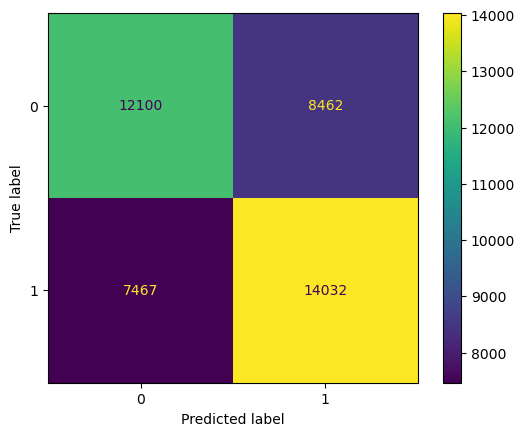

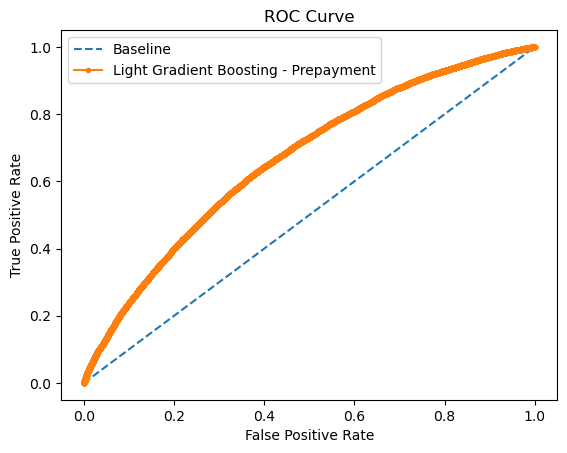

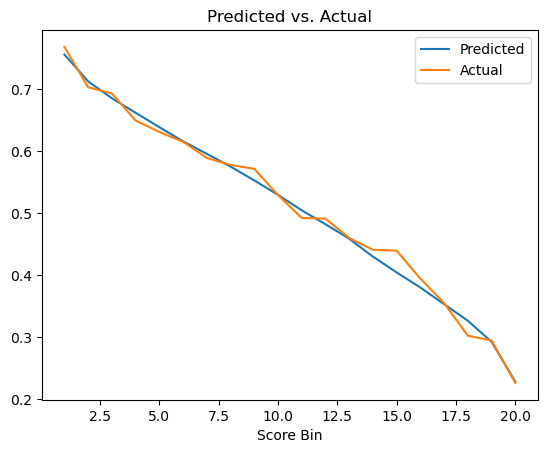

In [56]:
# 6) Light Gradint Boosting
model=GradientBoostingClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Light Gradient Boosting - Prepayment'

LGB=model_evaluation()

Accuracy: 0.616
Precision: 0.618
Recall: 0.652
Baseline: ROC AUC = 0.500
XGBoost - Prepayment: ROC AUC = 0.657


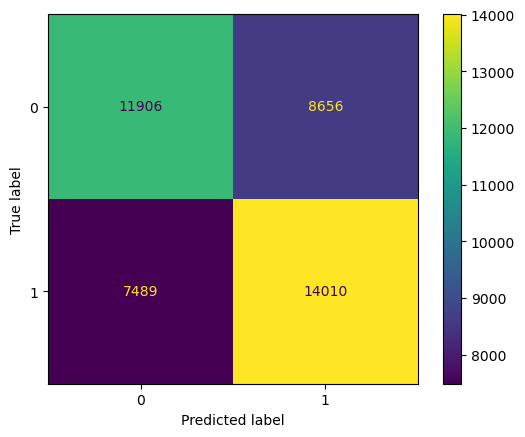

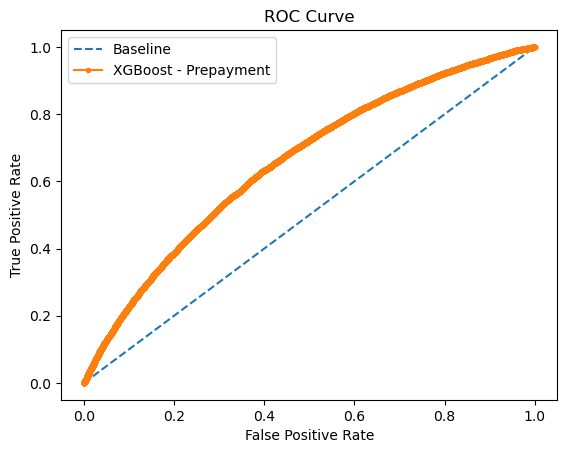

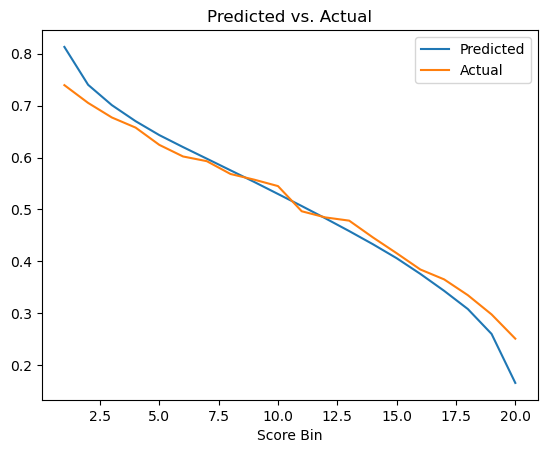

In [57]:
# 7) XGboost
model=XGBClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='XGBoost - Prepayment'

XGB=model_evaluation()

In [58]:
# 8) SVM of SVC
# from sklearn.svm import SVC

# model=SVC(probability=True)
# modelname='SVM'

# model.fit(X_train, y_train)

# preds=model.predict(X_test)
# probs=model.predict_proba(X_test)
# actuals=y_test.reset_index(drop=True)
# model_name='SVM - Prepayment'

# SVM=model_evaluation()

Accuracy: 0.594
Precision: 0.602
Recall: 0.607
Baseline: ROC AUC = 0.500
Random Forest - Prepayment: ROC AUC = 0.629


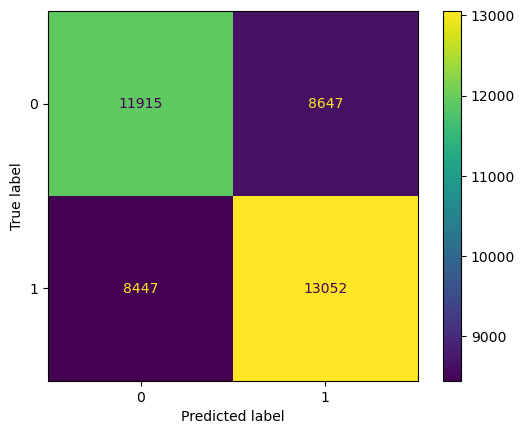

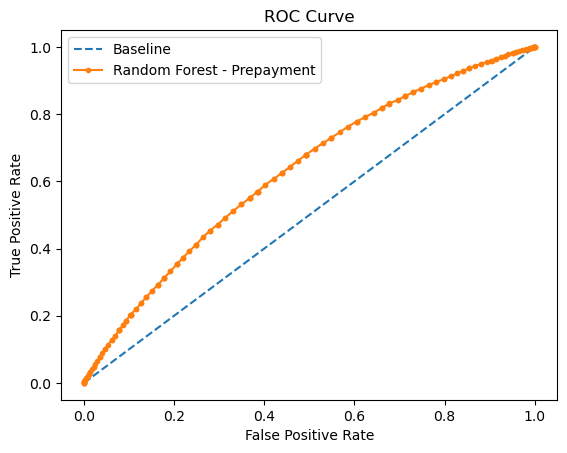

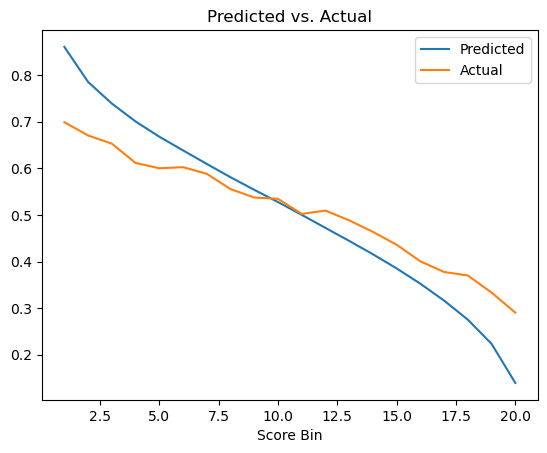

In [59]:
# 8) Random Forest
model=RandomForestClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Random Forest - Prepayment'

RF=model_evaluation()

In [60]:
def model_evaluation():

    #ROC & AUC
    #Generate a baseline prediction (majority class)
    ns_probs = [0 for _ in range(len(y_test))]

    #Predict probabilities
    lr_probs = model.predict_proba(X_test)

    #Keep probabilities for the positive outcome only
    lr_probs = lr_probs[:, 1]

    #Calculate scores
    ns_auc = roc_auc_score(y_test, ns_probs)
    lr_auc = roc_auc_score(y_test, lr_probs)

    #Summarize scores
    print('Baseline: ROC AUC = %.3f' % (ns_auc))
    print(model_name+': ROC AUC = %.3f' % (lr_auc))

    #Calculate roc curves
    ns_fpr, ns_tpr, _ = roc_curve(y_test, ns_probs)
    lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_probs)

    #Plot the roc curve for the model
    plt.figure()
    plt.plot(ns_fpr, ns_tpr, linestyle = '--', label = 'Baseline')
    plt.plot(lr_fpr, lr_tpr, marker = '.', label = model_name)

    #Axis labels
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.title("ROC Curve")
    plt.show()

    #Predicted vs. actual graphs
    actuals_y = pd.DataFrame(data = actuals, columns = [target])
    probs_y = pd.DataFrame(data = probs, columns = ['score1', 'score2'])
    actuals_probs = pd.concat([actuals_y, probs_y], axis = 1)
    num_bins = 20
    binlabels = list(range(0, num_bins))
    actuals_probs['score_bin'] = pd.qcut(actuals_probs['score2'].rank(method = 'first'), num_bins, labels = binlabels)
    actuals_probs['score_bin'] = num_bins - actuals_probs['score_bin'].astype(int)
    df_grp = actuals_probs.groupby('score_bin')['score2'].mean()
    df_grp.plot()
    df_grp2 = actuals_probs.groupby('score_bin')[target].mean()
    df_grp2.plot()
    plt.legend(["Predicted", "Actual"])
    plt.xlabel('Score Bin')
    plt.title("Predicted vs. Actual")
    
    # save AUC ROC and use it as the weight in the ensemble method later
    return(lr_auc)

Baseline: ROC AUC = 0.500
Ensemble Learning - Weighted Average - Prepayment: ROC AUC = 0.629


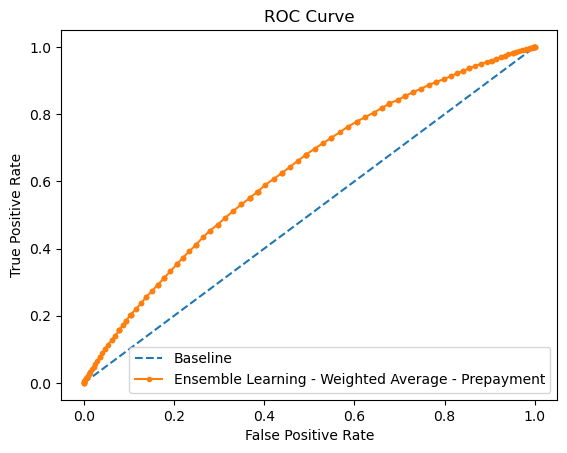

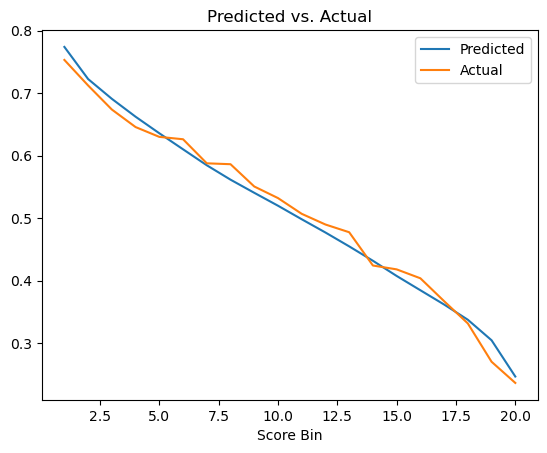

In [61]:
model_LR=LogisticRegression()
model_DT = DecisionTreeClassifier(max_depth = 3, random_state = 101, max_features = None, min_samples_leaf = 3)
model_NB=GaussianNB()
model_SGD=SGDClassifier(loss='modified_huber', shuffle=True, random_state=101)
model_KNN=KNeighborsClassifier(n_neighbors=15)
model_LGB = GradientBoostingClassifier()
model_XGB = XGBClassifier()
model_RF = RandomForestClassifier()

# train the model with the modeling sample
model_LR.fit(X_train, y_train)
model_DT.fit(X_train, y_train)
model_NB.fit(X_train, y_train)
model_SGD.fit(X_train, y_train)
model_KNN.fit(X_train, y_train)
model_LGB.fit(X_train, y_train)
model_XGB.fit(X_train, y_train)
model_RF.fit(X_train, y_train)

# score the validation sample 
Prob_LR = model_LR.predict_proba(X_test)
Prob_DT = model_DT.predict_proba(X_test)
Prob_NB = model_NB.predict_proba(X_test)
Prob_SGD = model_SGD.predict_proba(X_test)
Prob_KNN = model_KNN.predict_proba(X_test)
Prob_LGB = model_LGB.predict_proba(X_test)
Prob_XGB = model_XGB.predict_proba(X_test)
Prob_RF = model_RF.predict_proba(X_test)

# Use weight_exponent to reward the algorithms with higher ROC
weight_exponent = 2

w1 = LR**weight_exponent
w2 = DT**weight_exponent
w3 = NB**weight_exponent
w4 = SGD**weight_exponent
w5 = KNN**weight_exponent
w6 = LGB**weight_exponent
w7 = XGB**weight_exponent
w8 = RF**weight_exponent

probs = (Prob_LR*w1 + Prob_DT*w2 + Prob_NB*w3 + Prob_KNN*w5 + Prob_LGB*w6 + Prob_XGB*w7 + Prob_RF*w8) / (w1+w2+w3+w5+w6+w7+w8)

actuals = y_test.reset_index(drop=True)
model_name = "Ensemble Learning - Weighted Average - Prepayment"

EL_weighted_average = model_evaluation()

In [62]:
# append prepayment score with LOAN ID
prepay_score=pd.DataFrame(probs, columns=['score1', 'score2']).reset_index()
LOAN_ID=df_select[df_select['seg']=='val']['LOAN_ID'].reset_index()

prepay_file=pd.DataFrame({'LOAN_ID': LOAN_ID['LOAN_ID'], 'Predicted_prepay': prepay_score['score2']})
prepay_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42061 entries, 0 to 42060
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   LOAN_ID           42061 non-null  int64  
 1   Predicted_prepay  42061 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 657.3 KB


In [63]:
prepay_file.head()

,LOAN_ID,Predicted_prepay
0,98836743,0.457468
1,98837067,0.639922
2,98837191,0.497542
3,98837238,0.391004
4,98837371,0.366512


#### If ensemble does not outperform any single ML algorithm, it does not have to be chosen as the final choice of the model. 

# Step 8: Payment Default Model (bad rate model/risk model)
#### define the target

In [64]:
target='bad'

In [65]:
X=['purpose_rate_refi', 'purpose_cashout_refi', 'property_pud', 'property_condo', 'property_other',
   'term_30years', 'term_15years', 'mi', 'CSCORE_B', 'DTI', 'OLTV', 'ORIG_UPB', 'home_value', 'home_value_log',
   'DTI_LTV2', 'DTI_UPB_log2']

X_train=df_select[df_select['seg']=='mod'][X]
y_train=df_select[df_select['seg']=='mod'][target]

X_test=df_select[df_select['seg']=='val'][X]
y_test=df_select[df_select['seg']=='val'][target]

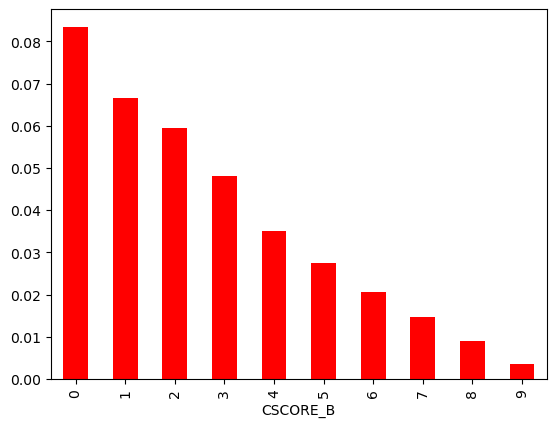

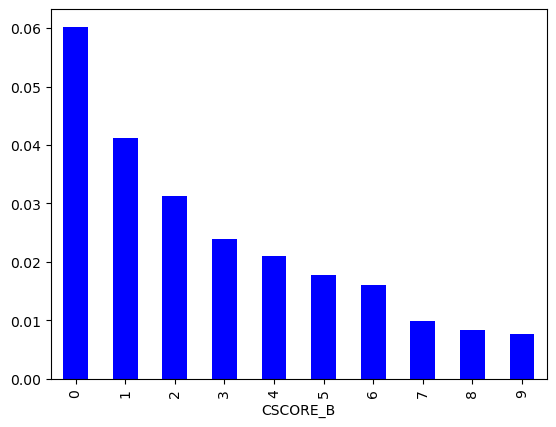

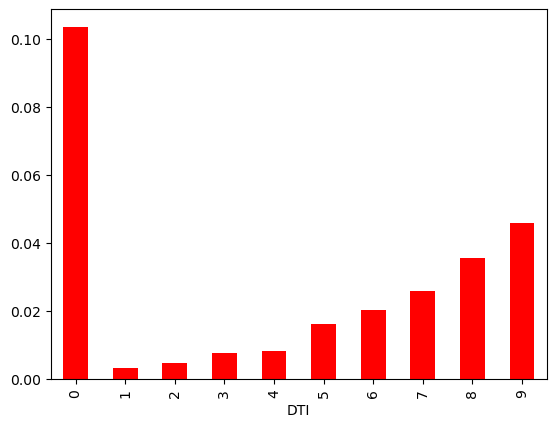

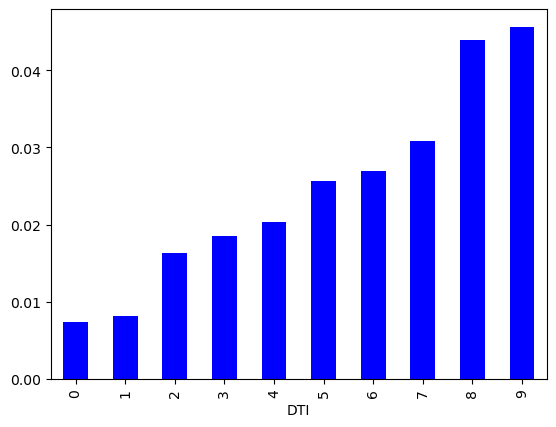

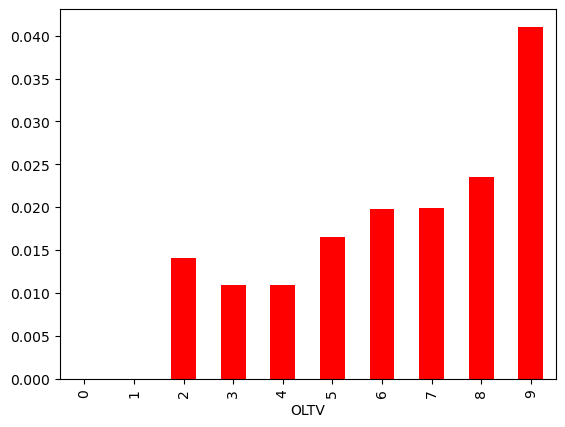

...

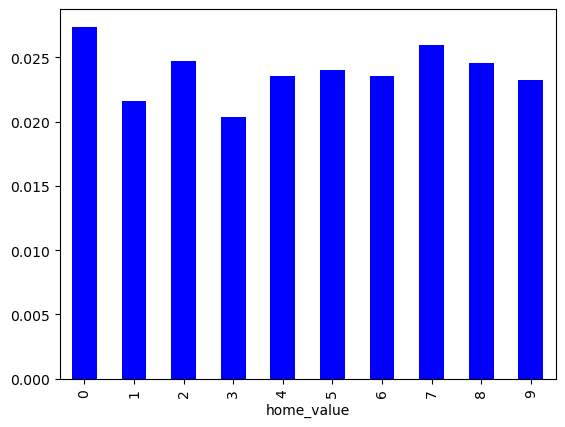

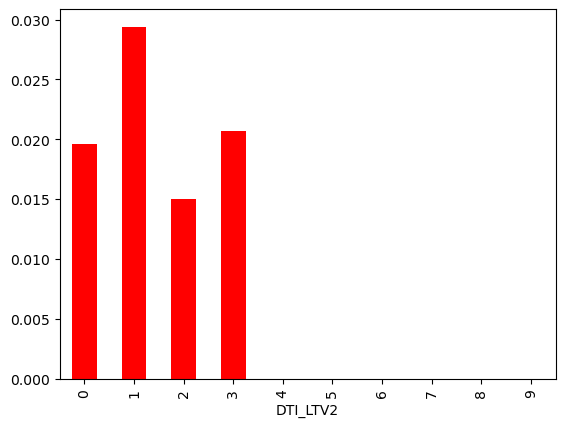

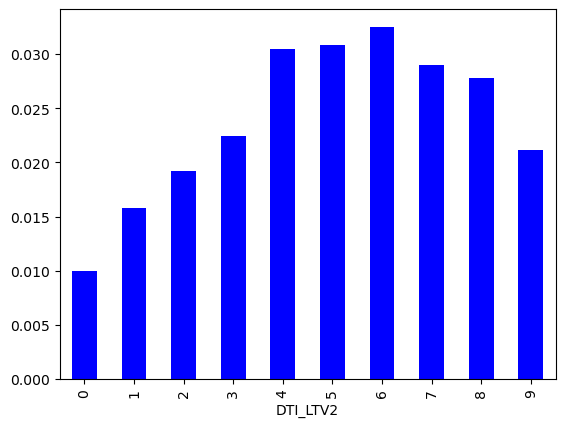

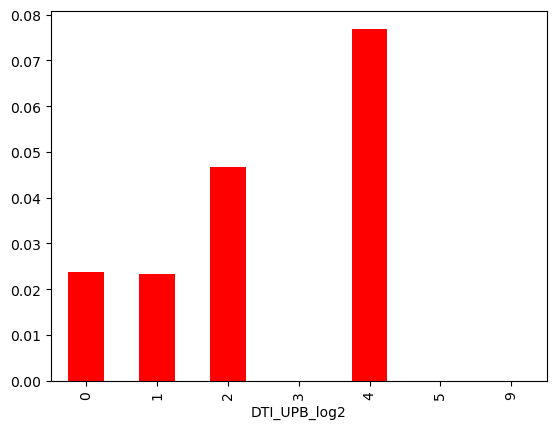

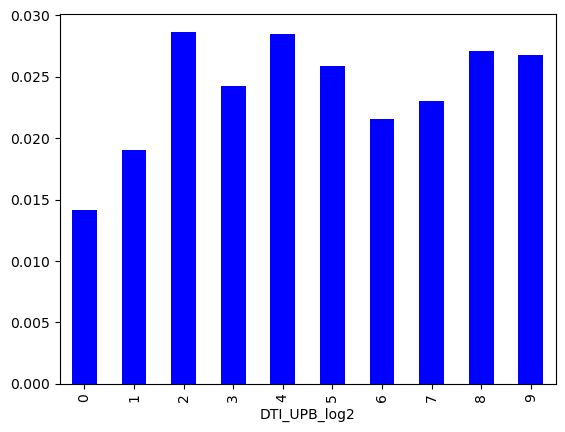

In [66]:
samp_mod=df_select[df_select['seg']=='mod']

def explore_numeric(x):
    # cut x into 10 bins according to its value
    samp_mod['value_ranks']=pd.cut(samp_mod[x], 10, labels=False)
    # print(samp_mod.groupby(['value_ranks']).size())
    # print(samp_mod[x].groupby(samp_mod['value_ranks']).mean())
    samp_mod[target].groupby(samp_mod['value_ranks']).mean().plot(kind='bar', color='red')
    plt.xlabel(x)
    plt.show()
    
    # cut x into 10 evenly distributed bins
    samp_mod['dist_ranks']=pd.qcut(samp_mod[x], 10, labels=False, duplicates="drop")
    # print(samp_mod.groupby(['dist_ranks']).size())
    # print(samp_mod[x].groupby(samp_mod['dist_ranks']).mean())
    samp_mod[target].groupby(samp_mod['dist_ranks']).mean().plot(kind='bar', color='blue')
    plt.xlabel(x)
    plt.show()

explore_numeric('CSCORE_B')
explore_numeric('DTI')
explore_numeric('OLTV')
explore_numeric('ORIG_UPB')
explore_numeric('home_value')
explore_numeric('DTI_LTV2')
explore_numeric('DTI_UPB_log2')

Baseline: ROC AUC = 0.500
Logistic Regression - Default: ROC AUC = 0.695


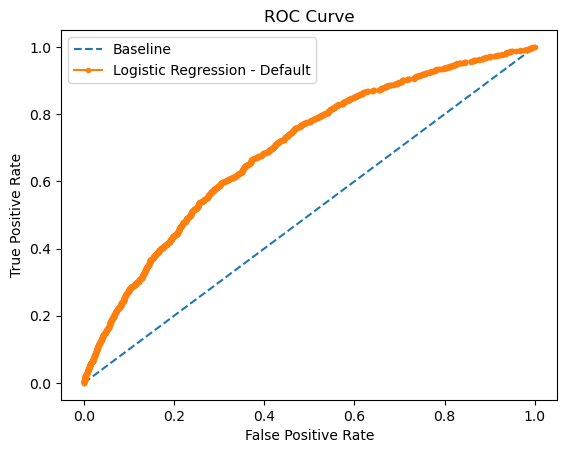

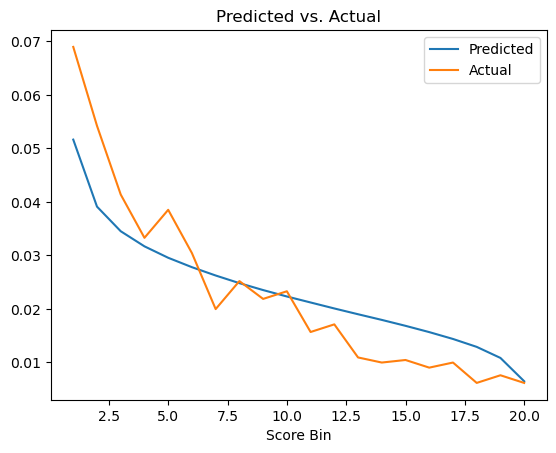

In [67]:
# 1) logistic regression
model=LogisticRegression()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Logistic Regression - Default'

LR=model_evaluation()

Baseline: ROC AUC = 0.500
Decision Tree - Default: ROC AUC = 0.676


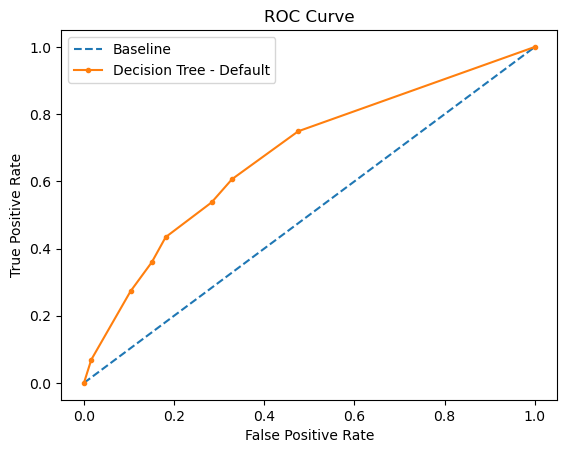

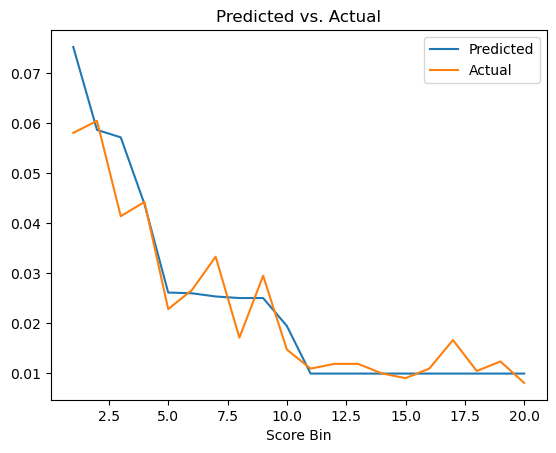

In [68]:
# 2) Decision Tree
model=DecisionTreeClassifier(max_depth=3, random_state=101, max_features=None, min_samples_leaf=3)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Decision Tree - Default'

DT=model_evaluation()

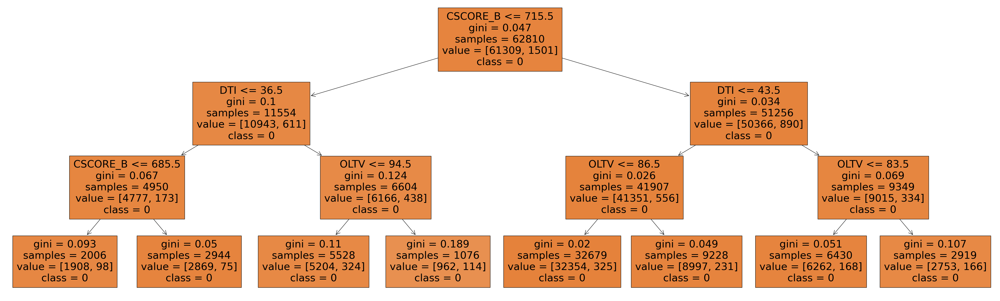

In [69]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

model=DecisionTreeClassifier(max_depth=3, random_state=101, max_features=None, min_samples_leaf=3)
model=model.fit(X_train, y_train)

fig=plt.figure(figsize=(50, 15))
_ =tree.plot_tree(model, 
                  feature_names=X_train.columns, 
                  class_names=['0', '1'], filled=True)

Baseline: ROC AUC = 0.500
Naive Bayes - Default: ROC AUC = 0.730


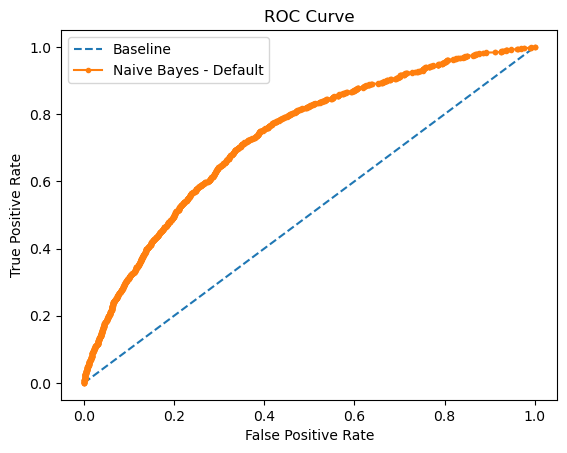

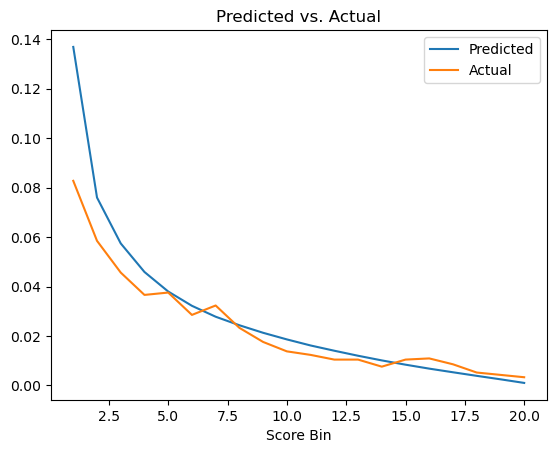

In [70]:
# 3) Naive Bayes
model=GaussianNB()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Naive Bayes - Default'

NB=model_evaluation()

Baseline: ROC AUC = 0.500
Stochastic Gradient Descent - Default: ROC AUC = 0.500


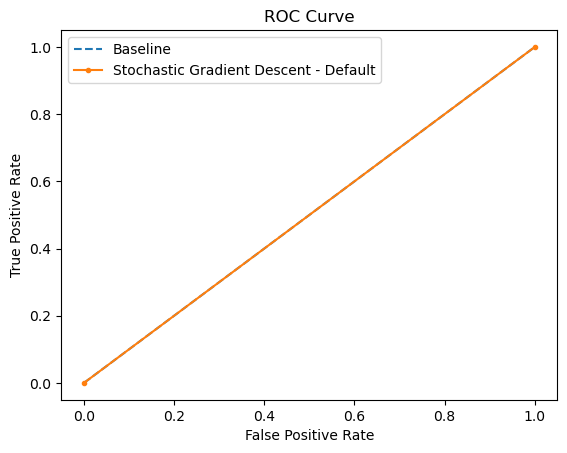

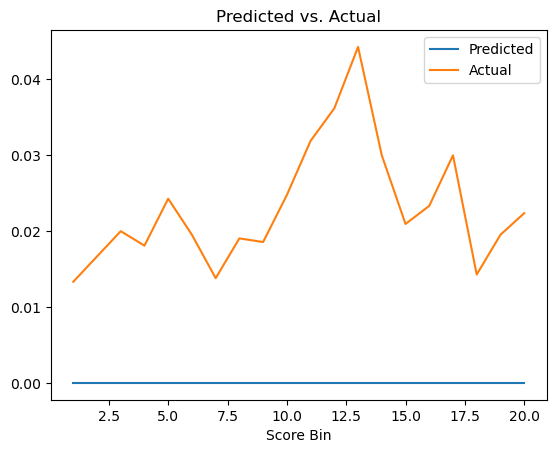

In [71]:
# 4) Stochastic Gradient Descent
model=SGDClassifier(loss='modified_huber', shuffle=True, random_state=101)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Stochastic Gradient Descent - Default'

SGD=model_evaluation()

Baseline: ROC AUC = 0.500
KNN - Default: ROC AUC = 0.530


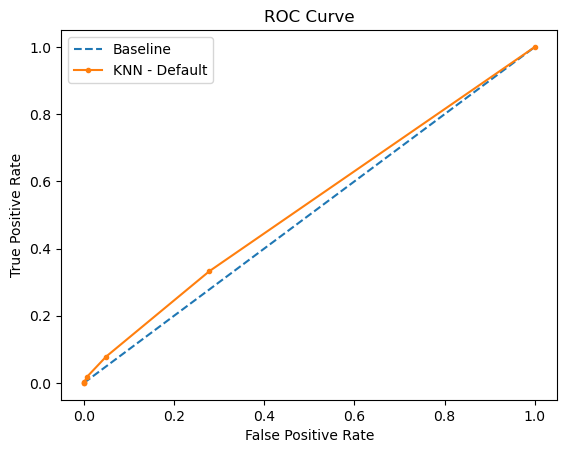

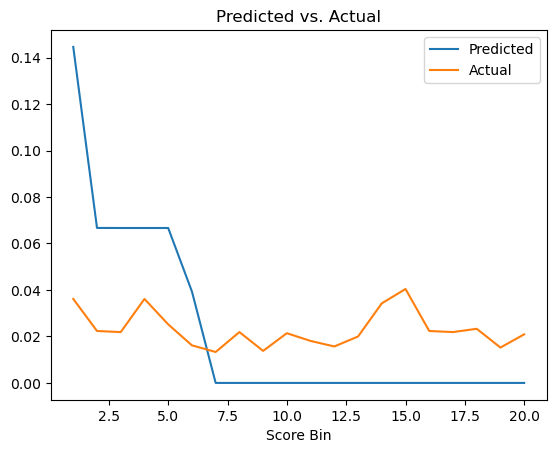

In [72]:
# 5) K Nearest Neighborhood (KNN)
model=KNeighborsClassifier(n_neighbors=15)
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='KNN - Default'

KNN=model_evaluation()

Baseline: ROC AUC = 0.500
Light Gradient Boosting - Default: ROC AUC = 0.734


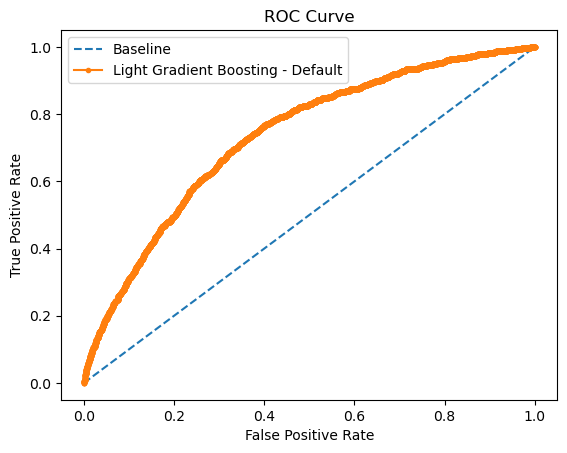

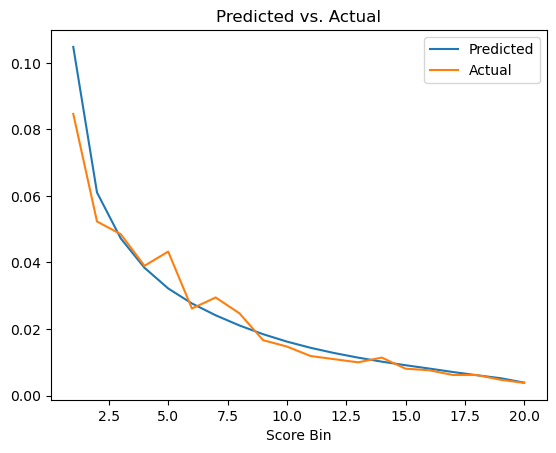

In [73]:
# 6) Light Gradint Boosting
model=GradientBoostingClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Light Gradient Boosting - Default'

LGB=model_evaluation()

Baseline: ROC AUC = 0.500
XGBoost - Default: ROC AUC = 0.710


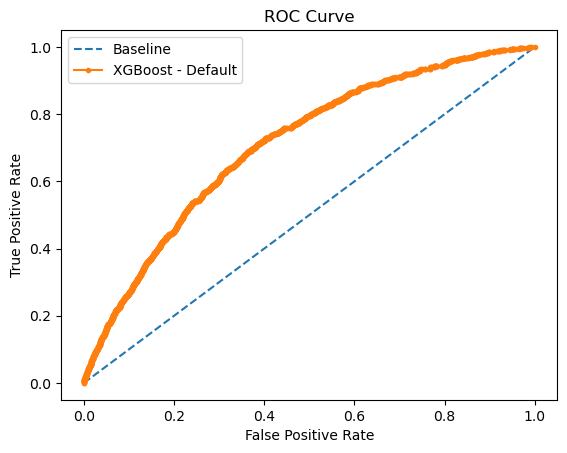

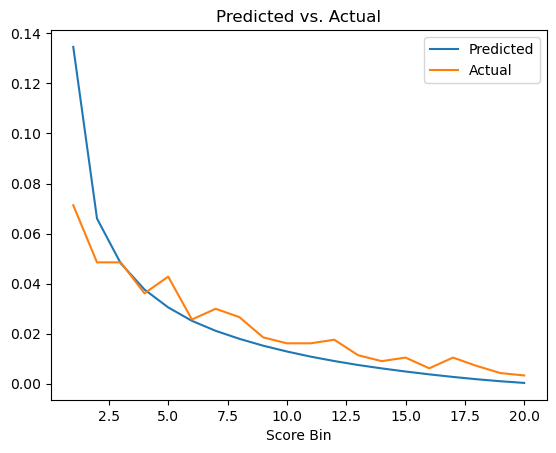

In [74]:
# 7) XGboost
model=XGBClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='XGBoost - Default'

XGB=model_evaluation()

Baseline: ROC AUC = 0.500
Random Forest - Default: ROC AUC = 0.649


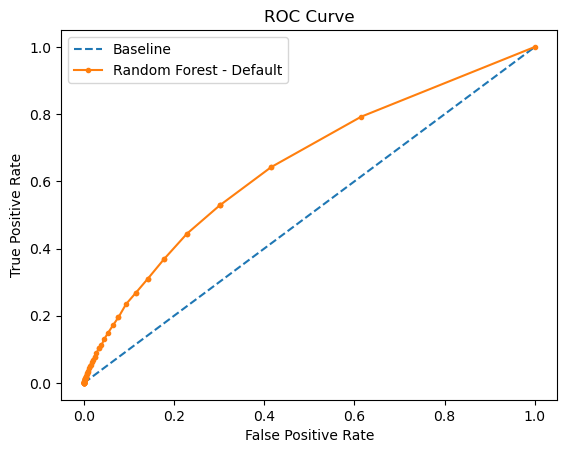

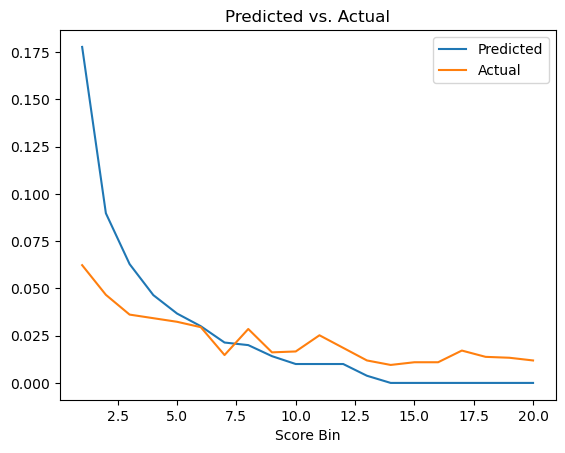

In [75]:
# 8) Random Forest
model=RandomForestClassifier()
model.fit(X_train, y_train)
preds=model.predict(X_test)
probs=model.predict_proba(X_test)
actuals=y_test.reset_index(drop=True)
model_name='Random Forest - Default'

RF=model_evaluation()

Baseline: ROC AUC = 0.500
Ensemble Learning - Weighted Average: ROC AUC = 0.649


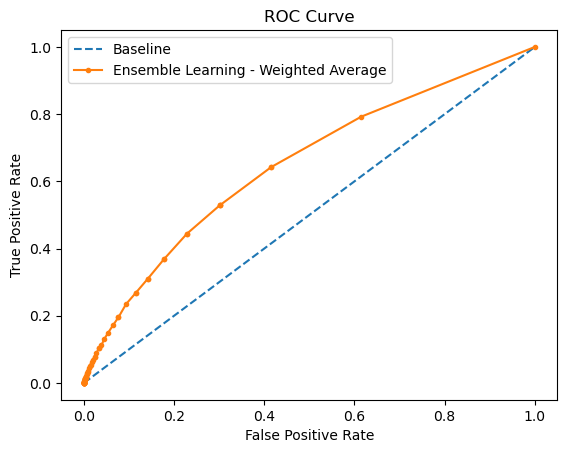

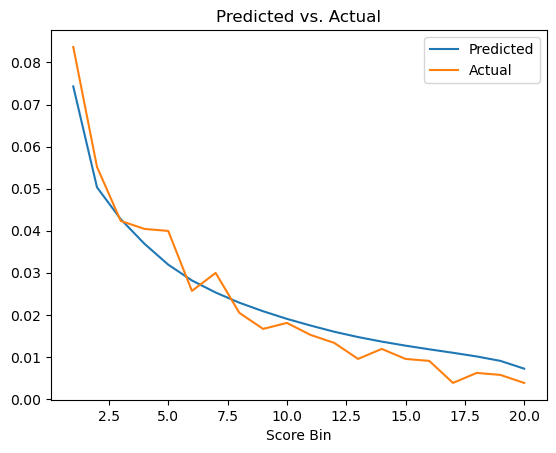

In [76]:
model_LR = LogisticRegression()
model_DT = DecisionTreeClassifier(max_depth = 3, random_state = 101, max_features = None, min_samples_leaf = 3)
model_NB = GaussianNB()
model_SGD = SGDClassifier(loss='modified_huber', shuffle=True, random_state=101)
model_KNN = KNeighborsClassifier(n_neighbors=15)
model_LGB = GradientBoostingClassifier()
model_XGB = XGBClassifier()
model_RF = RandomForestClassifier()

model_LR.fit(X_train, y_train)
model_DT.fit(X_train, y_train)
model_NB.fit(X_train, y_train)
model_SGD.fit(X_train, y_train)
model_KNN.fit(X_train, y_train)
model_LGB.fit(X_train, y_train)
model_XGB.fit(X_train, y_train)
model_RF.fit(X_train, y_train)

Prob_LR = model_LR.predict_proba(X_test)
Prob_DT = model_DT.predict_proba(X_test)
Prob_NB = model_NB.predict_proba(X_test)
Prob_SGD = model_SGD.predict_proba(X_test)
Prob_KNN = model_KNN.predict_proba(X_test)
Prob_LGB = model_LGB.predict_proba(X_test)
Prob_XGB = model_XGB.predict_proba(X_test)
Prob_RF = model_RF.predict_proba(X_test)

# Use weight_exponent to reward the algorithms with higher ROC
weight_exponent = 2

w1 = LR**weight_exponent
w2 = DT**weight_exponent
w3 = NB**weight_exponent
w4 = SGD**weight_exponent
w5 = KNN**weight_exponent
w6 = LGB**weight_exponent
w7 = XGB**weight_exponent
w8 = RF**weight_exponent

probs = (Prob_LR*w1 + Prob_DT*w2 + Prob_LGB*w6) / (w1+w2+w6)

actuals = y_test.reset_index(drop=True)
model_name = "Ensemble Learning - Weighted Average"

EL_weighted_average = model_evaluation()

In [77]:
# append prepayment score with LOAN ID
default_score=pd.DataFrame(probs, columns=['score1', 'score2']).reset_index()
LOAN_ID=df_select[df_select['seg']=='val']['LOAN_ID'].reset_index()

default_file=pd.DataFrame({'LOAN_ID': LOAN_ID['LOAN_ID'], 'Predicted_default': default_score['score2']})
default_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42061 entries, 0 to 42060
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LOAN_ID            42061 non-null  int64  
 1   Predicted_default  42061 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 657.3 KB


# Step 9: Combine two scores

In [78]:
two_scores=pd.merge(prepay_file, default_file, on='LOAN_ID', how='inner')
two_scores.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42061 entries, 0 to 42060
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LOAN_ID            42061 non-null  int64  
 1   Predicted_prepay   42061 non-null  float64
 2   Predicted_default  42061 non-null  float64
dtypes: float64(2), int64(1)
memory usage: 1.3 MB


In [79]:
two_scores['prepay_bin']=pd.qcut(two_scores['Predicted_prepay'], q=5)
two_scores['default_bin']=pd.qcut(two_scores['Predicted_default'], q=5)

* Customers with highest default score and lowest prepaymet score should be considered as most valuable and get the most favorable interest rate. 

In [80]:
check_rate=pd.merge(two_scores, df_nodup, on='LOAN_ID', how='inner')

In [81]:
interest_rate=check_rate.pivot_table(index='prepay_bin', columns='default_bin', values='ORIG_RATE', 
                                     aggfunc='mean', dropna=False)
interest_rate

default_bin,"(0.00285, 0.0114]","(0.0114, 0.0153]","(0.0153, 0.0218]","(0.0218, 0.0341]","(0.0341, 0.357]"
prepay_bin,,,,,
"(0.162, 0.373]",3.707314,3.928873,3.936489,4.014942,4.156897
"(0.373, 0.466]",3.619646,3.833040,3.851310,3.955552,4.098076
"(0.466, 0.551]",3.571519,3.719968,3.804361,3.873753,4.043590
"(0.551, 0.649]",3.492215,3.671283,3.750818,3.814360,3.980686
"(0.649, 0.89]",3.470708,3.605683,3.680235,3.763240,3.921108


Text(95.72222222222221, 0.5, 'Prepayment Score')

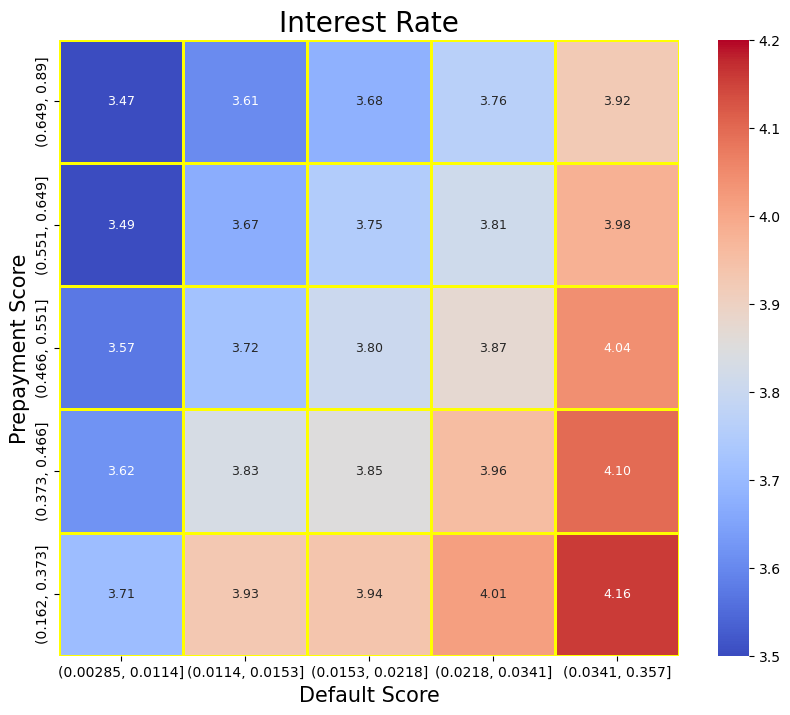

In [82]:
fig=plt.figure(figsize=(10, 8))
ax=plt.axes()
sns.heatmap(interest_rate, cmap='coolwarm', fmt=".2f", vmin=3.5, vmax=4.2, linewidths=2, linecolor='yellow',
            annot=True, annot_kws={"size": 9}).invert_yaxis()
ax.set_title("Interest Rate", fontsize=20)
ax.set_xlabel('Default Score', fontsize=15)
ax.set_ylabel('Prepayment Score', fontsize=15)

In [83]:
# let's check by loan term

# 30-year fixed
interest_rate=check_rate[check_rate['ORIG_TERM']==360].pivot_table(index='prepay_bin', columns='default_bin', 
                                                                   values='ORIG_RATE', aggfunc='mean', dropna=False)
interest_rate

default_bin,"(0.00285, 0.0114]","(0.0114, 0.0153]","(0.0153, 0.0218]","(0.0218, 0.0341]","(0.0341, 0.357]"
prepay_bin,,,,,
"(0.162, 0.373]",3.965282,4.105838,4.069071,4.092880,4.240944
"(0.373, 0.466]",3.830490,3.945442,3.924180,3.989613,4.172298
"(0.466, 0.551]",3.764066,3.836080,3.887075,3.923877,4.104462
"(0.551, 0.649]",3.681572,3.776534,3.825267,3.853581,4.021436
"(0.649, 0.89]",3.640582,3.718380,3.744911,3.797696,3.944716


Text(95.72222222222221, 0.5, 'Prepayment Score')

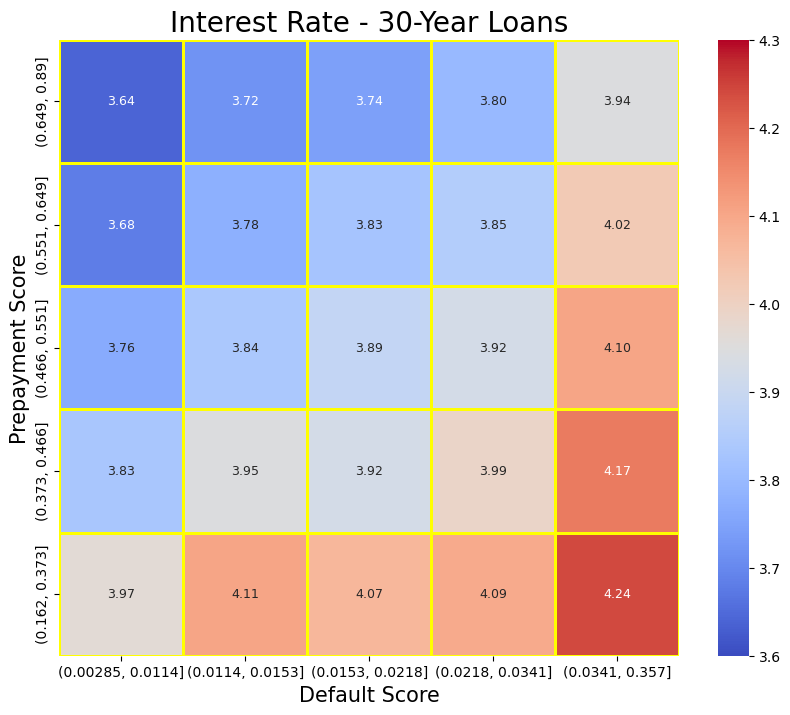

In [84]:
fig=plt.figure(figsize=(10, 8))
ax=plt.axes()
sns.heatmap(interest_rate, cmap='coolwarm', fmt=".2f", vmin=3.6, vmax=4.3, linewidths=2, linecolor='yellow',
            annot=True, annot_kws={"size": 9}).invert_yaxis()
ax.set_title("Interest Rate - 30-Year Loans", fontsize=20)
ax.set_xlabel('Default Score', fontsize=15)
ax.set_ylabel('Prepayment Score', fontsize=15)

In [85]:
# 15-year fixed
interest_rate=check_rate[check_rate['ORIG_TERM']==180].pivot_table(index='prepay_bin', columns='default_bin', 
                                                                   values='ORIG_RATE', aggfunc='mean', dropna=False)
interest_rate

default_bin,"(0.00285, 0.0114]","(0.0114, 0.0153]","(0.0153, 0.0218]","(0.0218, 0.0341]","(0.0341, 0.357]"
prepay_bin,,,,,
"(0.162, 0.373]",3.403655,3.493141,3.505934,3.588956,3.665397
"(0.373, 0.466]",3.297730,3.391285,3.373789,3.483941,3.510798
"(0.466, 0.551]",3.215459,3.270486,3.287479,3.371243,3.514190
"(0.551, 0.649]",3.144226,3.230028,3.208644,3.244485,3.375954
"(0.649, 0.89]",3.121654,3.152705,3.191553,3.187370,3.305553


Text(95.72222222222221, 0.5, 'Prepayment Score')

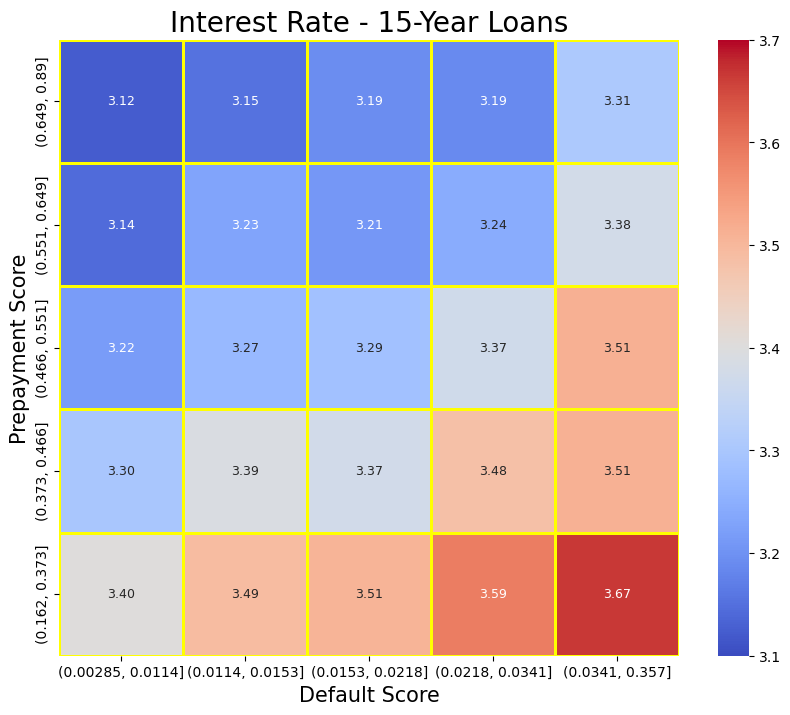

In [86]:
fig=plt.figure(figsize=(10, 8))
ax=plt.axes()
sns.heatmap(interest_rate, cmap='coolwarm', fmt=".2f", vmin=3.1, vmax=3.7, linewidths=2, linecolor='yellow',
            annot=True, annot_kws={"size": 9}).invert_yaxis()
ax.set_title("Interest Rate - 15-Year Loans", fontsize=20)
ax.set_xlabel('Default Score', fontsize=15)
ax.set_ylabel('Prepayment Score', fontsize=15)

## Summary


### Default Model ROC AUC
* Logistic Regression: 0.657
* Decision Tree: 0.654
* Naive Bayes: 0.649
* Stochastic Gradient Descent: 0.500
* K Nearest Neighborhood: 0.629
* Light Gradient Boosting: 0.667
* XGBoost: 0.654
* Random Forest: 0.630
* Ensemble Learning (Weighted Average): 0.630

### Prepayment Model ROC AUC
* Logistic Regression: 0.712
* Decision Tree: 0.698
* Naive Bayes: 0.679
* Stochastic Gradient Descent: 0.505
* K Nearest Neighborhood: 0.653
* Light Gradient Boosting: 0.734
* XGBoost: 0.723
* Random Forest: 0.704
* Ensemble Learning (Weighted Average): 0.710

## Conclusion

The Light Gradient Boosting model achieved the highest ROC AUC for both the Default Model (0.667) and the Prepayment Model (0.734), indicating strong predictive performance for identifying both default and prepayment risks. In general, ensemble and boosting methods performed better than simpler models, likely due to their ability to capture complex relationships in the data.

The results suggest that for both default and prepayment analysis, leveraging boosting algorithms like Light Gradient Boosting or XGBoost provides a more accurate classification compared to traditional methods like logistic regression or decision trees.

In [250]:
import pandas as pd
import numpy as np
from pandas import DataFrame
import glob
import os

import matplotlib.pyplot as plt
import seaborn as sns

# Part I - Read in the Data

In [251]:
path=r'C:\Users\aleci\Documents\Project 3 - Mortgage Origination Analysis\data\\'

file_2020q1_OH=pd.read_csv(path+'file_2020Q1_OH.csv')
file_2020q1_VA=pd.read_csv(path+'file_2020Q1_VA.csv')
file_2020q1_GA=pd.read_csv(path+'file_2020Q1_GA.csv')
file_2020q1_MI=pd.read_csv(path+'file_2020Q1_MI.csv')
file_2020q1_CO=pd.read_csv(path+'file_2020Q1_CO.csv')

df_all=pd.concat([file_2020q1_OH, file_2020q1_VA, file_2020q1_GA, file_2020q1_MI, file_2020q1_CO])
df_all.shape

(2071611, 108)

In [284]:
df_all['LOAN_ID'].nunique()

104924

In [354]:
# derive a variable for 'bad'.  This variable will not be used in clustering, but it will be used to validate clusters. 
df_all['bad']=np.where(df_all['DLQ_STATUS'] >= 6, 1, 0)
df_bad=df_all.groupby('LOAN_ID')['bad'].sum().reset_index()
df_bad['bad']=np.where(df_bad['bad'] > 0, 1, 0)

In [355]:
df=df_all.drop_duplicates(subset='LOAN_ID', keep='first')

df=pd.merge(df.drop('bad', axis=1), df_bad, on="LOAN_ID", how='inner')

In [356]:
df.columns.tolist()

['POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS',
 'REPUR

In [357]:
df['bad'].mean()

0.02353131790629408

In [358]:
df.head()

,POOL_ID,LOAN_ID,ACT_PERIOD,CHANNEL,SELLER,SERVICER,MASTER_SERVICER,ORIG_RATE,CURR_RATE,ORIG_UPB,...,BALLOON_INDICATOR,PLAN_NUMBER,FORBEARANCE_INDICATOR,HIGH_LOAN_TO_VALUE_HLTV_REFINANCE_OPTION_INDICATOR,DEAL_NAME,RE_PROCS_FLAG,ADR_TYPE,ADR_COUNT,ADR_UPB,bad
0,NaN,98836743,12020,R,Other,Other,NaN,3.625,3.625,207000.0,...,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN,0
1,NaN,98836744,12020,R,Other,Other,NaN,3.625,3.625,215000.0,...,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN,0
2,NaN,98836805,12020,R,Other,Other,NaN,3.250,3.250,210000.0,...,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN,1
3,NaN,98836862,12020,C,"NationStar Mortgage, LLC","NationStar Mortgage, LLC",NaN,4.875,4.875,200000.0,...,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN,0
4,NaN,98836951,12020,B,"United Shore Financial Services, LLC dba Unite...","United Shore Financial Services, LLC dba Unite...",NaN,4.183,4.183,109000.0,...,NaN,NaN,7,N,NaN,NaN,7,NaN,NaN,0


# Part 2 - Determine what columns to use for generating clusters
* Kmeans is based on euclidean distance, so only numeric values can be used. 
* some character varibales can be transformed to numeric varlues. 

In [359]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104924 entries, 0 to 104923
Columns: 109 entries, POOL_ID to bad
dtypes: float64(75), int32(1), int64(11), object(22)
memory usage: 87.7+ MB


In [360]:
# get some descriptive statistics for numeric values 
# Transpose the output for a easier viewing
df.describe().T

,count,mean,std,min,25%,50%,75%,max
POOL_ID,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LOAN_ID,104924.0,9.917922e+07,197019.945107,9.883674e+07,99009455.75,99180553.50,9.934903e+07,99520476.0
ACT_PERIOD,104924.0,2.306123e+04,8365.196512,1.202000e+04,12020.00,22020.00,3.202000e+04,32020.0
MASTER_SERVICER,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ORIG_RATE,104924.0,3.808843e+00,0.451864,2.375000e+00,3.50,3.75,3.999000e+00,6.5
...,...,...,...,...,...,...,...,...
PLAN_NUMBER,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DEAL_NAME,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ADR_COUNT,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ADR_UPB,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [361]:
# check null values to see whether any cleaning needs to be done
df.isnull().sum()

POOL_ID          104924
LOAN_ID               0
ACT_PERIOD            0
CHANNEL               0
SELLER                0
                  ...  
RE_PROCS_FLAG    104924
ADR_TYPE              0
ADR_COUNT        104924
ADR_UPB          104924
bad                   0
Length: 109, dtype: int64

In [362]:
df['PROP'].value_counts()

SF    60598
PU    32909
CO    10748
MH      647
CP       22
Name: PROP, dtype: int64

In [363]:
# encode loan purpose
df['prop']=np.where(df['PROP'].isin(['MH', 'CP']), 'other', df['PROP'])

df=pd.get_dummies(df, columns=['PURPOSE'])
df=pd.get_dummies(df, columns=['prop'])

In [364]:
df.columns.tolist()

['POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS',
 'REPURCHASES_MAKE_

In [365]:
# Since Kmeans is based on Euclidean distance, it only uses numeric values.
# Therefore, we only keep the numeric values
# Columns such as POOL_ID and LOAN_ID have no meaning in computation, so they are not included either.
# We keep LOAN_ID as a merging key to be used later.
# Decomissioned has the the same value for all rows, so it is dropped. 
# We delete Current Rate and current UPB. 
# OLTV asnd OCLTV are too close to each other. We retain OLTV only. 

df['loan_term']=np.where(df['ORIG_TERM']==360, 2, 
                              np.where(df['ORIG_TERM']==180, 1, 0))

# excclude those borrowers with no valid FICO
df=df[df['CSCORE_B'] > 300]


# split the sample
df['random']=np.random.uniform(0, 1, len(df['LOAN_ID']))
df['seg']=np.where(df['random'] <= 0.7, 'mod', 'val')

Xlist=[
'ORIG_UPB',
'CSCORE_B',
'loan_term',
'OLTV',
'DTI',
'NO_UNITS',
'MI_PCT',
'PURPOSE_C',
'PURPOSE_P',
'PURPOSE_R',
'prop_CO',
'prop_PU',
'prop_SF',
'prop_other'
]

Xylist=[
'ORIG_UPB',
'CSCORE_B',
'loan_term',
'OLTV',
'DTI',
'NO_UNITS',
'MI_PCT',
'PURPOSE_C',
'PURPOSE_P',
'PURPOSE_R',
'prop_CO',
'prop_PU',
'prop_SF',
'prop_other',
'bad'  
]


modelsample=df[df['seg']=='mod'][Xylist].fillna(0)
valsample=df[df['seg']=='val'][Xylist].fillna(0)

#### All variables need to be standardized before running clustering

In [366]:
modelsample[Xlist].describe().T

,count,mean,std,min,25%,50%,75%,max
ORIG_UPB,73363.0,253170.412878,123388.409694,10000.0,157000.0,236000.0,334000.0,800000.0
CSCORE_B,73363.0,756.793206,42.374295,620.0,729.0,766.0,791.0,835.0
loan_term,73363.0,1.632212,0.672236,0.0,1.0,2.0,2.0,2.0
OLTV,73363.0,73.924649,16.275997,7.0,65.0,76.0,85.0,97.0
DTI,73363.0,34.186102,9.577299,0.0,27.0,35.0,42.0,50.0
NO_UNITS,73363.0,1.010687,0.135835,1.0,1.0,1.0,1.0,4.0
MI_PCT,73363.0,6.932623,11.709561,0.0,0.0,0.0,12.0,35.0
PURPOSE_C,73363.0,0.254992,0.435860,0.0,0.0,0.0,1.0,1.0
PURPOSE_P,73363.0,0.356488,0.478965,0.0,0.0,0.0,1.0,1.0
PURPOSE_R,73363.0,0.388520,0.487417,0.0,0.0,0.0,1.0,1.0


In [367]:
# standardize the variables
# It is very important to make a copy of the modeling sample and use the copy to calculate mean and std. 

# standardize the variable
modsamp=modelsample.copy()

def standardize(x, samp):
    x_mean=modsamp[x].mean()
    x_std=modsamp[x].std()
    
    x_standardized=(samp[x]-x_mean)/x_std
    return x_standardized

for item in Xlist:
    modelsample[item]=standardize(item, modelsample)
    valsample[item]=standardize(item, valsample)
    
# normalize the variable between 0 and 1  
modsamp2=modelsample.copy()

def scaler(x, samp):
    x_max=modsamp2[x].max()
    x_min=modsamp2[x].min()
    
    x_standardized=(samp[x]-x_min)/(x_max-x_min)
    return x_standardized

for item in Xlist:
    modelsample[item]=scaler(item, modelsample)
    valsample[item]=scaler(item, valsample)

In [368]:
modelsample[Xlist].describe().T

,count,mean,std,min,25%,50%,75%,max
ORIG_UPB,73363.0,0.307811,0.156188,0.0,0.186076,0.286076,0.410127,1.0
CSCORE_B,73363.0,0.636247,0.197090,0.0,0.506977,0.679070,0.795349,1.0
loan_term,73363.0,0.816106,0.336118,0.0,0.500000,1.000000,1.000000,1.0
OLTV,73363.0,0.743607,0.180844,0.0,0.644444,0.766667,0.866667,1.0
DTI,73363.0,0.683722,0.191546,0.0,0.540000,0.700000,0.840000,1.0
NO_UNITS,73363.0,0.003562,0.045278,0.0,0.000000,0.000000,0.000000,1.0
MI_PCT,73363.0,0.198075,0.334559,0.0,0.000000,0.000000,0.342857,1.0
PURPOSE_C,73363.0,0.254992,0.435860,0.0,0.000000,0.000000,1.000000,1.0
PURPOSE_P,73363.0,0.356488,0.478965,0.0,0.000000,0.000000,1.000000,1.0
PURPOSE_R,73363.0,0.388520,0.487417,0.0,0.000000,0.000000,1.000000,1.0


In [369]:
valsample[Xlist].describe().T

,count,mean,std,min,25%,50%,75%,max
ORIG_UPB,31510.0,0.310253,0.158005,0.002532,0.184810,0.289873,0.415190,0.956962
CSCORE_B,31510.0,0.635771,0.197678,0.000000,0.502326,0.679070,0.795349,0.976744
loan_term,31510.0,0.816043,0.336529,0.000000,0.500000,1.000000,1.000000,1.000000
OLTV,31510.0,0.743722,0.180039,0.011111,0.644444,0.766667,0.866667,1.000000
DTI,31510.0,0.682012,0.191717,0.020000,0.540000,0.700000,0.840000,1.000000
NO_UNITS,31510.0,0.003703,0.046079,0.000000,0.000000,0.000000,0.000000,1.000000
MI_PCT,31510.0,0.196865,0.334206,0.000000,0.000000,0.000000,0.342857,1.000000
PURPOSE_C,31510.0,0.252110,0.434231,0.000000,0.000000,0.000000,1.000000,1.000000
PURPOSE_P,31510.0,0.356268,0.478903,0.000000,0.000000,0.000000,1.000000,1.000000
PURPOSE_R,31510.0,0.391622,0.488121,0.000000,0.000000,0.000000,1.000000,1.000000


In [370]:
print("model sample avg bad: {}".format(modelsample['bad'].mean()))
print("validation sample avg bad: {}".format(valsample['bad'].mean()))
print("model sample total bad: {}".format(modelsample['bad'].sum()))

model sample avg bad: 0.023704046999168518
validation sample avg bad: 0.02316724849254205
model sample total bad: 1739


In [371]:
# as our sample exceeds 2mm rows, it will take too long to process for some analysis. 
# We make a 2% sample for subsequent analyses. 

modelsample_good=modelsample[modelsample['bad']==0]
shrinksample=pd.concat([modelsample_good.sample(1702), modelsample[modelsample['bad']==1]])
shrinksample.shape

(3441, 15)

In [372]:
shrinksample.describe().T

,count,mean,std,min,25%,50%,75%,max
ORIG_UPB,3441.0,0.319156,0.158041,0.016456,0.194937,0.300000,0.422785,0.956962
CSCORE_B,3441.0,0.569448,0.215351,0.000000,0.409302,0.600000,0.748837,0.967442
loan_term,3441.0,0.864429,0.296543,0.000000,1.000000,1.000000,1.000000,1.000000
OLTV,3441.0,0.777897,0.171783,0.077778,0.688889,0.811111,0.922222,1.000000
DTI,3441.0,0.735077,0.184224,0.020000,0.600000,0.760000,0.880000,1.000000
NO_UNITS,3441.0,0.003778,0.050373,0.000000,0.000000,0.000000,0.000000,1.000000
MI_PCT,3441.0,0.253473,0.360307,0.000000,0.000000,0.000000,0.714286,1.000000
PURPOSE_C,3441.0,0.248184,0.432022,0.000000,0.000000,0.000000,0.000000,1.000000
PURPOSE_P,3441.0,0.392618,0.488404,0.000000,0.000000,0.000000,1.000000,1.000000
PURPOSE_R,3441.0,0.359198,0.479835,0.000000,0.000000,0.000000,1.000000,1.000000


* We want to see whether 'bad' can be easily separated from 'good' in variable distribution
* If so, we do not need to go on. 

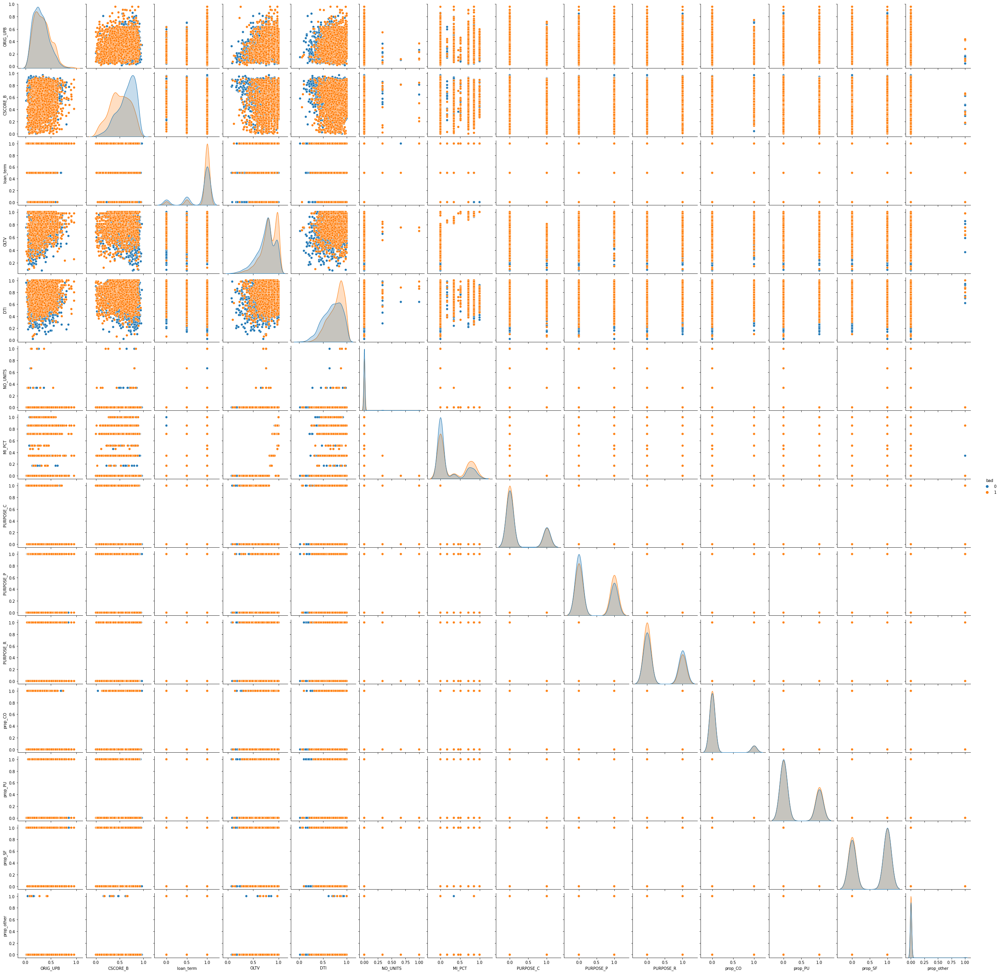

In [373]:
sns.pairplot(shrinksample, hue='bad')

#### determine optimal number of clusters

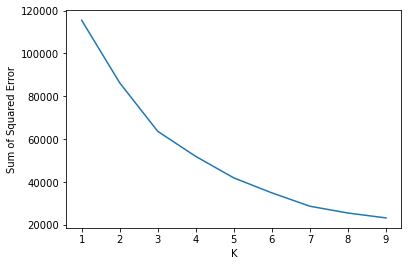

In [374]:
# deterine k value
from sklearn.cluster import KMeans

sse=[]

for k in range(1, 10):
    model=KMeans(n_clusters=k)
    model.fit(modelsample.drop('bad', axis=1))
    sse.append(model.inertia_)
    
x=range(1, 10)
y=sse

plt.xlabel('K')
plt.ylabel('Sum of Squared Error')
plt.plot(x, y)

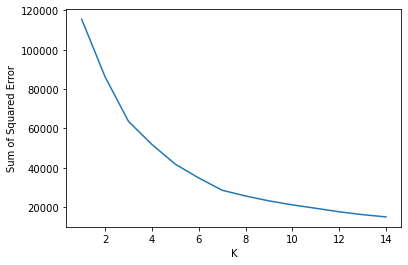

In [375]:
# deterine k value
from sklearn.cluster import KMeans

sse=[]

for k in range(1, 15):
    model=KMeans(n_clusters=k)
    model.fit(modelsample.drop('bad', axis=1))
    sse.append(model.inertia_)
    
x=range(1, 15)
y=sse

plt.xlabel('K')
plt.ylabel('Sum of Squared Error')
plt.plot(x, y)

* We need to find a good elbow point in the above graph.
* It looks like SSE no longer drops significantly from 7 to 8. 

#### validate the performance by each cluster
* We want to find whether one or multiple clusters show much higher or lower risk.

In [376]:
model=KMeans(n_clusters=7)
model.fit(modelsample.drop('bad', axis=1))

y_pred=model.predict(modelsample.drop('bad', axis=1))

modelsample['cluster']=y_pred

modelsample_sum=modelsample.groupby('cluster')['bad'].agg(['count', 'sum', 'mean'])
modelsample_sum=modelsample.groupby('cluster')['bad'].agg(model_count='count',
                                                          model_sum='sum',
                                                          model_mean='mean')
modelsample_sum['model_count_pct']=modelsample_sum['model_count']/(modelsample_sum['model_count'].sum())


# Check on the validation sample
y_pred_val=model.predict(valsample.drop('bad', axis=1))

valsample['cluster']=y_pred_val

valsample_sum=valsample.groupby('cluster')['bad'].agg(['count', 'sum', 'mean'])
valsample_sum=valsample.groupby('cluster')['bad'].agg(val_count='count',
                                                      val_sum='sum',
                                                      val_mean='mean')
valsample_sum['val_count_pct']=valsample_sum['val_count']/(valsample_sum['val_count'].sum())


# merge the two summaries
mod_val_sum=pd.merge(modelsample_sum, valsample_sum, on='cluster', how='outer').reset_index()
mod_val_sum

,cluster,model_count,model_sum,model_mean,model_count_pct,val_count,val_sum,val_mean,val_count_pct
0,0,4994,120,0.024029,0.068072,2102,47,0.022360,0.066709
1,1,16610,304,0.018302,0.226408,7150,124,0.017343,0.226912
2,2,8803,304,0.034534,0.119992,3827,118,0.030834,0.121454
3,3,13854,374,0.026996,0.188842,5874,164,0.027920,0.186417
4,4,7514,174,0.023157,0.102422,3228,78,0.024164,0.102444
5,5,12421,264,0.021254,0.169309,5298,101,0.019064,0.168137
6,6,9167,199,0.021708,0.124954,4031,98,0.024312,0.127928


C:\Users\aleci\AppData\Local\Temp/ipykernel_1844/1068983731.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.1%}' for x in plt.gca().get_yticks()])


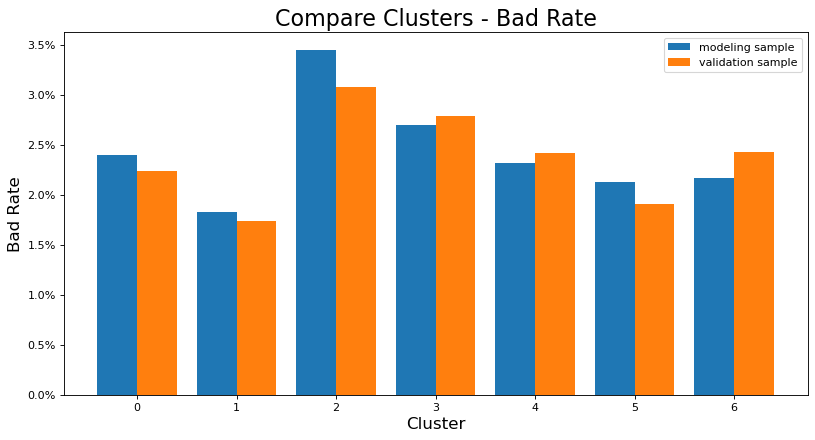

In [377]:
from matplotlib.pyplot import figure
import matplotlib.ticker as mtick  # for formating y axis

figure(figsize=(12, 6), dpi=80)

clusters=[0, 1, 2, 3, 4, 5, 6]
x_axis=np.arange(len(clusters))

plt.bar(x_axis -0.2, mod_val_sum['model_mean'], width=0.4, label = 'modeling sample')
plt.bar(x_axis +0.2, mod_val_sum['val_mean'], width=0.4, label = 'validation sample')
plt.xticks(x_axis, clusters)
plt.xlabel("Cluster", fontsize=15)
plt.gca().set_yticklabels([f'{x:.1%}' for x in plt.gca().get_yticks()]) 
plt.ylabel("Bad Rate", fontsize=15, )
# plt.ylim([20, 80])  # we set this range from 20 in order to accentuate the difference between two periods
plt.title("Compare Clusters - Bad Rate", fontsize=20)
plt.legend(loc='best')
plt.show()

C:\Users\aleci\AppData\Local\Temp/ipykernel_1844/302107572.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels([f'{x:.1%}' for x in plt.gca().get_yticks()])


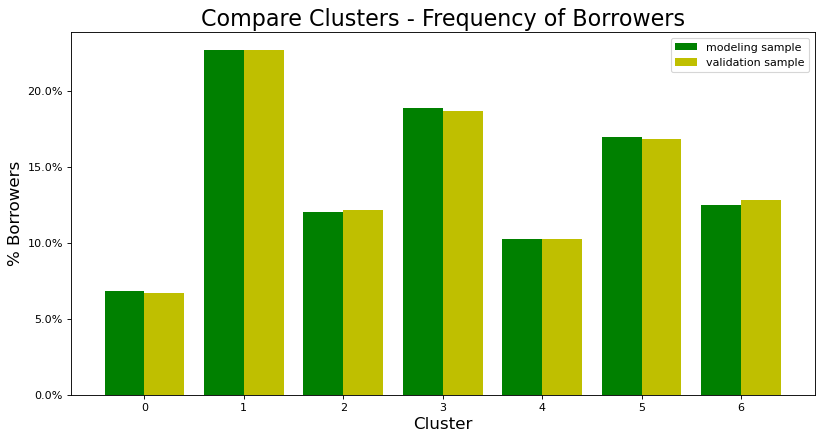

In [378]:
from matplotlib.pyplot import figure
import matplotlib.ticker as mtick  # for formating y axis

figure(figsize=(12, 6), dpi=80)

clusters=[0, 1, 2, 3, 4, 5, 6]
x_axis=np.arange(len(clusters))

plt.bar(x_axis -0.2, mod_val_sum['model_count_pct'], width=0.4, color='g', label = 'modeling sample')
plt.bar(x_axis +0.2, mod_val_sum['val_count_pct'], width=0.4, color='y', label = 'validation sample')
plt.xticks(x_axis, clusters)
plt.xlabel("Cluster", fontsize=15)
plt.gca().set_yticklabels([f'{x:.1%}' for x in plt.gca().get_yticks()]) 
plt.ylabel("% Borrowers", fontsize=15, )
# plt.ylim([20, 80])  # we set this range from 20 in order to accentuate the difference between two periods
plt.title("Compare Clusters - Frequency of Borrowers", fontsize=20)
plt.legend(loc='best')
plt.show()

# Use clusters to assess performance 
* Even though Kmeans clustering is a method of unsupervised learning, we can use it to see whether clusters show any difference in predicting a target.

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ORIG_UPB', ylabel='CSCORE_B'>

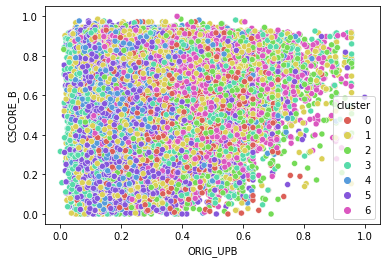

In [379]:
# Visualize clusters on variables
sns.scatterplot(modelsample['ORIG_UPB'], modelsample['CSCORE_B'], hue=modelsample['cluster'], palette=sns.color_palette('hls', 7))

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='ORIG_UPB', ylabel='DTI'>

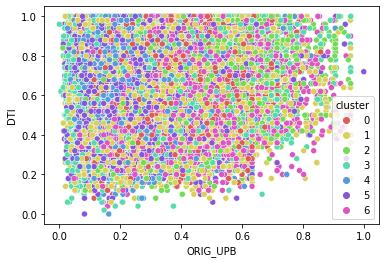

In [380]:
# Visualize clusters on variables
sns.scatterplot(modelsample['ORIG_UPB'], modelsample['DTI'], hue=modelsample['cluster'], palette=sns.color_palette('hls', 7))

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='DTI', ylabel='CSCORE_B'>

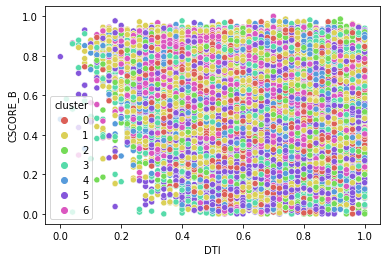

In [381]:
sns.scatterplot(modelsample['DTI'], modelsample['CSCORE_B'], hue=modelsample['cluster'], palette=sns.color_palette('hls', 7))

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='DTI', ylabel='OLTV'>

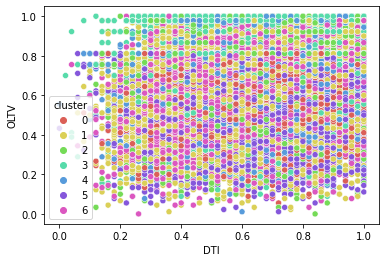

In [382]:
sns.scatterplot(modelsample['DTI'], modelsample['OLTV'], hue=modelsample['cluster'], palette=sns.color_palette('hls', 7))

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='OLTV', ylabel='ORIG_UPB'>

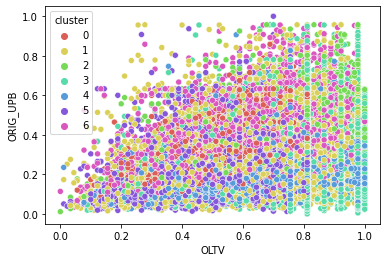

In [383]:
sns.scatterplot(modelsample['OLTV'], modelsample['ORIG_UPB'], hue=modelsample['cluster'], palette=sns.color_palette('hls', 7))

#### We want to see whether the clusters can be easily seen in a 2-variable combition

(14662, 16)


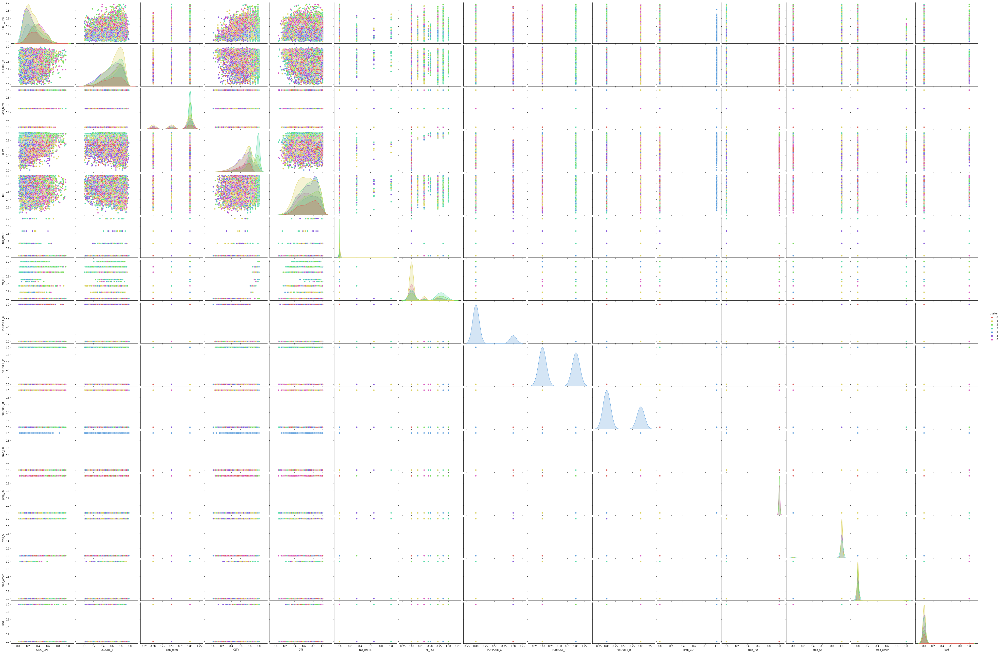

In [385]:
# as the following program is likely to take a long time to run, we make a smaller sample to do it. 
smallsample=modelsample[np.random.uniform(0, 1, len(modelsample['ORIG_UPB'])) < 0.2]
print(smallsample.shape)

sns.pairplot(smallsample, hue='cluster', palette=sns.color_palette('hls', 7), aspect=1.5)

# save the graph to a folder. 
plt.savefig(path+'project4_segmentation.png', dpi=300)

## Conclusion

The clustering analysis segmented the mortgage portfolio into 7 groups with distinct risk profiles, identifying both high and low-risk clusters. High-risk clusters highlight borrower profiles that may need closer monitoring, while low-risk clusters indicate stability. Validation results confirm the model’s reliability.

This segmentation enables:

* Targeted resource allocation,
* Risk-based loan terms and pricing,
* Early intervention for high-risk loans.

This model provides valuable insights for strategic, data-driven portfolio management and can enhance predictive modeling for improved risk forecasting.

In [1]:
import pandas as pd
import numpy as np
from pandas import DataFrame

import matplotlib.pyplot as plt
import seaborn as sns

## Part 1: Read in the data

In [2]:
path=r'C:\Users\aleci\Documents\Project 3 - Mortgage Origination Analysis\data\\'

file_2020q1_OH=pd.read_csv(path+'file_2020Q1_OH.csv')
file_2020q1_VA=pd.read_csv(path+'file_2020Q1_VA.csv')
file_2020q1_GA=pd.read_csv(path+'file_2020Q1_GA.csv')
file_2020q1_MI=pd.read_csv(path+'file_2020Q1_MI.csv')
file_2020q1_CO=pd.read_csv(path+'file_2020Q1_CO.csv')

In [3]:
df=pd.concat([file_2020q1_OH, file_2020q1_VA, file_2020q1_GA, file_2020q1_MI, file_2020q1_CO])
df.shape

(2071611, 108)

In [4]:
df['LOAN_ID'].nunique()

104924

In [5]:
df.groupby('STATE')['LOAN_ID'].count()

STATE
CO    485045
GA    428255
MI    479014
OH    339552
VA    339745
Name: LOAN_ID, dtype: int64

## Part 2: Define 'bad'
* We intend to apply a more stringent criterion for defining 'bad'.
* This definition bad will be used to build a payment default model.
* Two things to consider for defining such a variable as 'bad'?
** The definition should be representative of bad/derogatory behavior
** We can get enough such data points for modeling

In [6]:
df.columns.tolist()

['POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS',
 'REPUR

In [8]:
df.groupby('DLQ_STATUS')['LOAN_ID'].count()

DLQ_STATUS
0     2019379
1       14783
2        7204
3        5353
4        3983
5        3351
6        2724
7        2209
8        1934
9        1704
10       1510
11       1368
12       1146
13        963
14        856
15        746
16        617
17        557
18        409
19        296
20        250
21        145
22         70
23         40
24         14
Name: LOAN_ID, dtype: int64

In [9]:
df['bad']=np.where(df['DLQ_STATUS'] >= 6, 1, 0)
df_bad=df.groupby('LOAN_ID')['bad'].sum().reset_index()
df_bad['bad']=np.where(df_bad['bad'] > 0, 1, 0)

In [10]:
print(df_bad['bad'].mean())
print(df_bad['bad'].sum())

0.02353131790629408
2469


In [11]:
df_bad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104924 entries, 0 to 104923
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   LOAN_ID  104924 non-null  int64
 1   bad      104924 non-null  int32
dtypes: int32(1), int64(1)
memory usage: 1.2 MB


In [12]:
df_nodup=df.drop_duplicates(subset='LOAN_ID', keep='first').reset_index()

In [13]:
df_nodup.columns.tolist()

['index',
 'POOL_ID',
 'LOAN_ID',
 'ACT_PERIOD',
 'CHANNEL',
 'SELLER',
 'SERVICER',
 'MASTER_SERVICER',
 'ORIG_RATE',
 'CURR_RATE',
 'ORIG_UPB',
 'ISSUANCE_UPB',
 'CURRENT_UPB',
 'ORIG_TERM',
 'ORIG_DATE',
 'FIRST_PAY',
 'LOAN_AGE',
 'REM_MONTHS',
 'ADJ_REM_MONTHS',
 'MATR_DT',
 'OLTV',
 'OCLTV',
 'NUM_BO',
 'DTI',
 'CSCORE_B',
 'CSCORE_C',
 'FIRST_FLAG',
 'PURPOSE',
 'PROP',
 'NO_UNITS',
 'OCC_STAT',
 'STATE',
 'MSA',
 'ZIP',
 'MI_PCT',
 'PRODUCT',
 'PPMT_FLG',
 'IO',
 'FIRST_PAY_IO',
 'MNTHS_TO_AMTZ_IO',
 'DLQ_STATUS',
 'PMT_HISTORY',
 'MOD_FLAG',
 'MI_CANCEL_FLAG',
 'Zero_Bal_Code',
 'ZB_DTE',
 'LAST_UPB',
 'RPRCH_DTE',
 'CURR_SCHD_PRNCPL',
 'TOT_SCHD_PRNCPL',
 'UNSCHD_PRNCPL_CURR',
 'LAST_PAID_INSTALLMENT_DATE',
 'FORECLOSURE_DATE',
 'DISPOSITION_DATE',
 'FORECLOSURE_COSTS',
 'PROPERTY_PRESERVATION_AND_REPAIR_COSTS',
 'ASSET_RECOVERY_COSTS',
 'MISCELLANEOUS_HOLDING_EXPENSES_AND_CREDITS',
 'ASSOCIATED_TAXES_FOR_HOLDING_PROPERTY',
 'NET_SALES_PROCEEDS',
 'CREDIT_ENHANCEMENT_PROCEEDS

In [14]:
df_nodup=pd.merge(df_nodup.drop('bad', axis=1), df_bad, on='LOAN_ID', how='inner')

In [15]:
df_nodup['bad'].mean()

0.02353131790629408

## Part 3: Select variables for modeling
* Since this is an underwriting model, we will only select those variables available at the time of origination. 
* These varibles do not change their values throughout the life of a loan. 

In [66]:
def dummyvar(x):
    x['purpose_rate_refi']=np.where(x['PURPOSE'].str.strip()=='R', 1, 0)
    x['purpose_cashout_refi']=np.where(x['PURPOSE'].str.strip()=='C', 1, 0)
    x['property_pud']=np.where(x['PROP'].str.strip()=='PU', 1, 0)
    x['property_condo']=np.where(x['PROP'].str.strip()=='CO', 1, 0)
    x['property_other']=np.where(x['PROP'].str.strip().isin(['CP', 'MH']), 1, 0)
    x['term_30years']=np.where(x['ORIG_TERM']==360, 1, 0)
    x['term_15years']=np.where(x['ORIG_TERM']==180, 1, 0)
    x['mi']=np.where(x['MI_PCT'] > 0, 1, 0)
    
dummyvar(df_nodup)

In [67]:
columns_to_keep=['CSCORE_B', 'DTI', 'OLTV', 'ORIG_UPB', 'bad', 'LOAN_ID']

df_nodup[columns_to_keep].describe().T

,count,mean,std,min,25%,50%,75%,max
CSCORE_B,104873.0,7.567624e+02,42.412137,620.0,729.00,766.0,791.00,835.0
DTI,104922.0,3.415779e+01,9.579630,1.0,27.00,35.0,42.00,50.0
OLTV,104924.0,7.392929e+01,16.254267,7.0,65.00,76.0,85.00,97.0
ORIG_UPB,104924.0,2.537213e+05,123826.341576,10000.0,156000.00,237000.0,335000.00,800000.0
bad,104924.0,2.353132e-02,0.151584,0.0,0.00,0.0,0.00,1.0
LOAN_ID,104924.0,9.917922e+07,197019.945107,98836742.0,99009455.75,99180553.5,99349026.75,99520476.0


In [68]:
# remove loans with no credit score or DTI
df_sample=df_nodup[(df_nodup['CSCORE_B'] > 0) & (df_nodup['DTI'] > 0)][columns_to_keep]
df_sample.describe().T

,count,mean,std,min,25%,50%,75%,max
CSCORE_B,104871.0,7.567624e+02,42.412282,620.0,729.0,766.0,791.0,835.0
DTI,104871.0,3.416106e+01,9.578838,1.0,27.0,35.0,42.0,50.0
OLTV,104871.0,7.392818e+01,16.254008,7.0,65.0,76.0,85.0,97.0
ORIG_UPB,104871.0,2.537530e+05,123823.523399,10000.0,156000.0,237000.0,335000.0,800000.0
bad,104871.0,2.354321e-02,0.151622,0.0,0.0,0.0,0.0,1.0
LOAN_ID,104871.0,9.917920e+07,197011.330265,98836742.0,99009454.5,99180544.0,99349004.0,99520476.0


## Part 4: Create additional features

* Split the sample into a modeling sample and a validation sample

In [69]:
# create a few more variables
df_sample['ORIG_UPB']=np.log(df_sample['ORIG_UPB'])
df_sample['DTI_OTV']=df_sample['DTI']/df_sample['OLTV']
df_sample['home_price']=df_sample['ORIG_UPB']/df_sample['OLTV']
df_sample['home_price_log']=np.log(df_sample['home_price'])
df_sample['home_price_fico']=df_sample['CSCORE_B']/df_sample['home_price_log']

In [70]:
x=df_sample.drop('bad', axis=1)
y=df_sample['bad']

In [71]:
df_sample.describe().T

,count,mean,std,min,25%,50%,75%,max
CSCORE_B,104871.0,7.567624e+02,42.412282,6.200000e+02,7.290000e+02,7.660000e+02,7.910000e+02,8.350000e+02
DTI,104871.0,3.416106e+01,9.578838,1.000000e+00,2.700000e+01,3.500000e+01,4.200000e+01,5.000000e+01
OLTV,104871.0,7.392818e+01,16.254008,7.000000e+00,6.500000e+01,7.600000e+01,8.500000e+01,9.700000e+01
ORIG_UPB,104871.0,1.231152e+01,0.542656,9.210340e+00,1.195761e+01,1.237582e+01,1.272189e+01,1.359237e+01
bad,104871.0,2.354321e-02,0.151622,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
LOAN_ID,104871.0,9.917920e+07,197011.330265,9.883674e+07,9.900945e+07,9.918054e+07,9.934900e+07,9.952048e+07
DTI_OTV,104871.0,4.909012e-01,0.216396,1.428571e-02,3.604651e-01,4.625000e-01,5.733333e-01,6.000000e+00
home_price,104871.0,1.784673e-01,0.062403,1.004928e-01,1.448736e-01,1.619981e-01,1.905702e-01,1.644704e+00
home_price_log,104871.0,-1.762896e+00,0.259041,-2.297670e+00,-1.931894e+00,-1.820171e+00,-1.657734e+00,4.975602e-01
home_price_fico,104871.0,-4.479487e+02,685.871179,-1.316447e+05,-4.610079e+02,-4.192927e+02,-3.870479e+02,5.644541e+04


In [72]:
x.shape, y.shape

((104871, 9), (104871,))

In [73]:
# split the sample into train and test sets
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.3, random_state=0)

In [74]:
x_train.shape, x_test.shape

((73409, 9), (31462, 9))

In [75]:
# feature scaling
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)

In [76]:
x_train

array([[ 0.40735144, -0.54154947, -0.54802405, ..., -0.09339014,
         0.02475415,  0.01168965],
       [ 0.4308852 , -0.22828757,  1.29716966, ..., -0.77586048,
        -1.06890134,  0.08747216],
       [ 0.57208774,  0.81591873,  0.37457281, ..., -0.2535925 ,
        -0.20551365,  0.02495213],
       ...,
       [ 1.16043165, -1.27249388, -0.24049176, ...,  0.11315853,
         0.30268538, -0.03551165],
       [-0.76933639, -1.89901766, -1.16308862, ...,  0.50417632,
         0.77957724, -0.01728994],
       [ 1.32516795,  0.29381558,  0.92813092, ..., -0.60434169,
        -0.76352007,  0.04417914]])

In [77]:
y_train=y_train.to_numpy()
y_test=y_test.to_numpy()

In [78]:
x_train.shape, x_test.shape

((73409, 9), (31462, 9))

In [79]:
# reshape the dataset
# You must add a 3rd dimension in order to run neural network
x_train=x_train.reshape(73409, 9, 1)
x_test=x_test.reshape(31462, 9, 1)

In [80]:
x_train.shape, x_test.shape

((73409, 9, 1), (31462, 9, 1))

## Part 5: Artificial Neural Network (ANN)
#### 5.1: set up the ANN model structure

In [81]:
import tensorflow as tf
print(tf.__version__)

model=tf.keras.models.Sequential()

# set up initial input layer
# input_dim should be the same as number of input variables
model.add(tf.keras.layers.Dense(units=9, activation='relu', input_dim=9))

# add 2nd hidden layer
model.add(tf.keras.layers.Dense(units=6, activation='relu'))

# output layer
# units should be the same as the predicted goal. In our case, we are predicting bad, so units=1.
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

#compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

2.11.0-dev20220812
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 9)                 90        
                                                                 
 dense_6 (Dense)             (None, 6)                 60        
                                                                 
 dense_7 (Dense)             (None, 1)                 7         
                                                                 
Total params: 157
Trainable params: 157
Non-trainable params: 0
_________________________________________________________________


#### 5.2: Run ANN model

In [82]:
# Epoch is the number of iterations
model.fit(x_train, y_train, batch_size=10, epochs=10)

Epoch 1/10
7341/7341 [==============================] - 11s 1ms/step - loss: 0.1123 - accuracy: 0.9764
Epoch 2/10
7341/7341 [==============================] - 11s 1ms/step - loss: 0.1051 - accuracy: 0.9764
Epoch 3/10
7341/7341 [==============================] - 11s 1ms/step - loss: 0.1045 - accuracy: 0.9764
Epoch 4/10
7341/7341 [==============================] - 11s 2ms/step - loss: 0.1043 - accuracy: 0.9764
Epoch 5/10
7341/7341 [==============================] - 11s 2ms/step - loss: 0.1042 - accuracy: 0.9764
Epoch 6/10
7341/7341 [==============================] - 11s 1ms/step - loss: 0.1041 - accuracy: 0.9764
Epoch 7/10
7341/7341 [==============================] - 10s 1ms/step - loss: 0.1040 - accuracy: 0.9764
Epoch 8/10
7341/7341 [==============================] - 10s 1ms/step - loss: 0.1041 - accuracy: 0.9764
Epoch 9/10
7341/7341 [==============================] - 10s 1ms/step - loss: 0.1040 - accuracy: 0.9764
Epoch 10/10
7341/7341 [==============================] - 10s 1ms/step - l

In [83]:
# evaluate the model
test_loss, test_acc=model.evaluate(x_test, y_test)

984/984 [==============================] - 1s 1ms/step - loss: 0.1021 - accuracy: 0.9767


In [84]:
print("Test Accuracy: {}".format(test_acc))

Test Accuracy: 0.9766702651977539


In [85]:
# The following only works for tensorflow 2.6 or later.
# for earlier version of tensorflow 2.0, use predict_classes(x_test)
y_pred=model.predict(x_test)
classes_y=np.argmax(y_pred, axis=1)

984/984 [==============================] - 1s 968us/step


In [86]:
y_pred

array([[0.01880551],
       [0.01953542],
       [0.06797414],
       ...,
       [0.06275409],
       [0.01244097],
       [0.0251498 ]], dtype=float32)

In [87]:
y_pred_df=pd.DataFrame(y_pred)
y_pred_df.columns=['y_pred']

In [88]:
y_test_df=pd.DataFrame(y_test)
y_test_df.columns=['y']

In [89]:
y_test_df['y_pred']=y_pred_df

In [90]:
num_bins=10

binlabels=list(range(0, num_bins))

y_test_df['score_cut']=pd.qcut(y_test_df['y_pred'], q=num_bins, labels=binlabels)

In [91]:
# make a copy of the scoring result to a comparison with CNN model later
y_test_df_ann=y_test_df.copy()

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='score_cut', ylabel='y'>

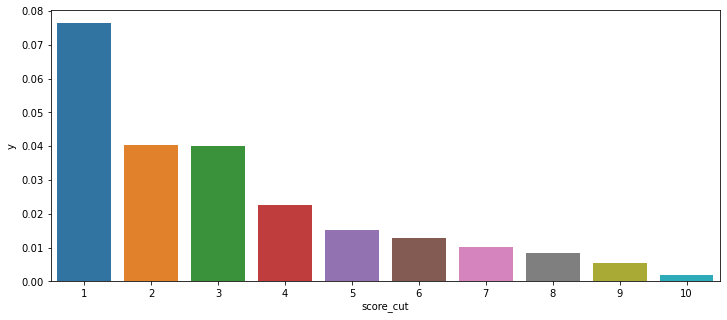

In [92]:
fig=plt.figure(figsize=(12, 5))

y_test_df_sum=y_test_df.groupby('score_cut')[['y_pred', 'y']].mean().reset_index()
y_test_df_sum['score_cut']=y_test_df_sum['score_cut'].astype(int)
y_test_df_sum['score_cut']=num_bins-y_test_df_sum['score_cut']

sns.barplot(y_test_df_sum['score_cut'], y_test_df_sum['y'])

Text(0, 0.5, 'Predicted/Actual')

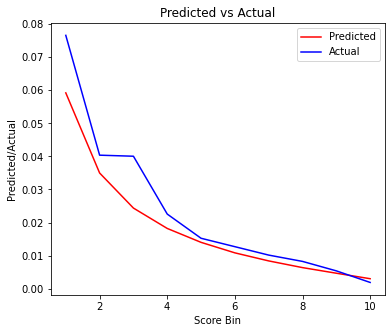

In [93]:
fig, ax=plt.subplots(1, 1, figsize=(6, 5))

ax.plot(y_test_df_sum['score_cut'], y_test_df_sum['y_pred'], label='Predicted', color='red')
ax.plot(y_test_df_sum['score_cut'], y_test_df_sum['y'], label='Actual', color='blue')
ax.set_title('Predicted vs Actual')
ax.legend(loc='upper right')
ax.set_xlabel('Score Bin')
ax.set_ylabel('Predicted/Actual')

### Part 6: Convoluted Neural Network (CNN)
#### 6.1: Set up the CNN model structure

In [94]:
# define an object for the model
model=tf.keras.models.Sequential()

In [95]:
# 1st CNN layer
# input shape should correpond to number of input variables
model.add(tf.keras.layers.Conv1D(filters=32, kernel_size=2, padding='same', activation='relu', input_shape=(9, 1)))

# batch normalization 
model.add(tf.keras.layers.BatchNormalization())

# maxpool layer
model.add(tf.keras.layers.MaxPool1D(pool_size=2))

# dropout layer
# This layer deliberately exclude some data so that the model will not overfit
# Usually select 0.2-0.5 as the dropout rate
model.add(tf.keras.layers.Dropout(0.2))

# 2nd CNN layer
model.add(tf.keras.layers.Conv1D(filters=64, kernel_size=2, padding='same', activation='relu'))

# batch normalization 
model.add(tf.keras.layers.BatchNormalization())

# maxpool layer
model.add(tf.keras.layers.MaxPool1D(pool_size=2))

# dropout layer
model.add(tf.keras.layers.Dropout(0.3))

In [96]:
# flatten layer
model.add(tf.keras.layers.Flatten())

In [97]:
# first dense layer
model.add(tf.keras.layers.Dense(units=64, activation='relu'))

# dropout layer
model.add(tf.keras.layers.Dropout(0.3))

In [98]:
# output layer
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [99]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 9, 32)             96        
                                                                 
 batch_normalization_2 (Batc  (None, 9, 32)            128       
 hNormalization)                                                 
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 4, 32)            0         
 1D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 4, 32)             0         
                                                                 
 conv1d_3 (Conv1D)           (None, 4, 64)             4160      
                                                                 
 batch_normalization_3 (Batc  (None, 4, 64)           

In [100]:
# learning rate is one of hyperparameters
opt=tf.keras.optimizers.Adam(learning_rate=0.0001)

In [101]:
# compile the CNN model
model.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy'])

#### 6.2: Run CNN model

In [115]:
history=model.fit(x_train, y_train, epochs=25, validation_data=(x_test, y_test))

Epoch 1/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1074 - accuracy: 0.9764 - val_loss: 0.1051 - val_accuracy: 0.9767
Epoch 2/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1069 - accuracy: 0.9764 - val_loss: 0.1038 - val_accuracy: 0.9767
Epoch 3/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1075 - accuracy: 0.9764 - val_loss: 0.1053 - val_accuracy: 0.9767
Epoch 4/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1074 - accuracy: 0.9764 - val_loss: 0.1036 - val_accuracy: 0.9767
Epoch 5/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1070 - accuracy: 0.9764 - val_loss: 0.1032 - val_accuracy: 0.9767
Epoch 6/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1073 - accuracy: 0.9764 - val_loss: 0.1039 - val_accuracy: 0.9767
Epoch 7/25
2295/2295 [==============================] - 8s 4ms/step - loss: 0.1067 - accuracy: 0.9764 - val_loss: 0.1046 - val_accuracy:

In [116]:
# model predictions
y_pred=model.predict(x_test)
classes_y=np.argmax(y_pred, axis=1)

984/984 [==============================] - 1s 1ms/step


In [117]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm=confusion_matrix(y_test, classes_y)
print(cm)

[[30728     0]
 [  734     0]]


In [118]:
acc_cm=accuracy_score(y_test, classes_y)
print(acc_cm)

0.9766702688958108


In [119]:
# Learning curve
def learning_curve(history, epoch):
    # training vs validation accuracy
    epoch_range=range(1, epoch+1)
    plt.plot(epoch_range, history.history['accuracy'])
    plt.plot(epoch_range, history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='lower right')
    plt.show()
    

    # training vs validation loss
    epoch_range=range(1, epoch+1)
    plt.plot(epoch_range, history.history['loss'])
    plt.plot(epoch_range, history.history['val_loss'])
    plt.title('LOss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Training', 'Validation'], loc='upper left')
    plt.show()

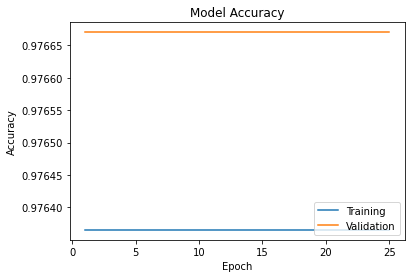

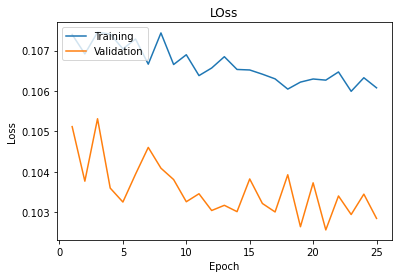

In [120]:
learning_curve(history, 25)

In [121]:
y_pred_df=pd.DataFrame(y_pred)
y_pred_df.columns=['y_pred']

In [122]:
y_test_df=pd.DataFrame(y_test)
y_test_df.columns=['y']

In [123]:
y_test_df['y_pred']=y_pred_df

In [124]:
y_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31462 entries, 0 to 31461
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   y       31462 non-null  int32  
 1   y_pred  31462 non-null  float32
dtypes: float32(1), int32(1)
memory usage: 245.9 KB


In [125]:
num_bins=10

binlabels=list(range(0, num_bins))

y_test_df['score_cut']=pd.qcut(y_test_df['y_pred'], q=num_bins, labels=binlabels)

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='score_cut', ylabel='y'>

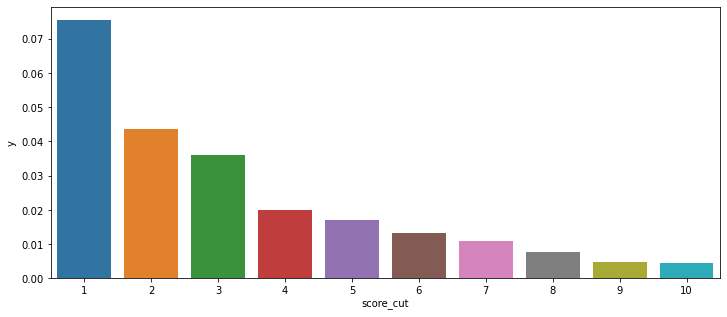

In [126]:
fig=plt.figure(figsize=(12, 5))

y_test_df_sum=y_test_df.groupby('score_cut')[['y_pred', 'y']].mean().reset_index()
y_test_df_sum['score_cut']=y_test_df_sum['score_cut'].astype(int)
y_test_df_sum['score_cut']=num_bins-y_test_df_sum['score_cut']

sns.barplot(y_test_df_sum['score_cut'], y_test_df_sum['y'])

Text(0, 0.5, 'Predicted/Actual')

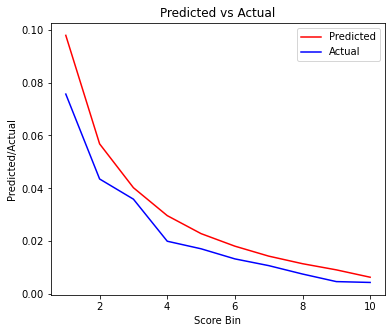

In [127]:
fig, ax=plt.subplots(1, 1, figsize=(6, 5))

ax.plot(y_test_df_sum['score_cut'], y_test_df_sum['y_pred'], label='Predicted', color='red')
ax.plot(y_test_df_sum['score_cut'], y_test_df_sum['y'], label='Actual', color='blue')
ax.set_title('Predicted vs Actual')
ax.legend(loc='upper right')
ax.set_xlabel('Score Bin')
ax.set_ylabel('Predicted/Actual')

In [128]:
y_test_df_cnn=y_test_df.copy()

## Part 7: combine two models

In [129]:
y_test_df_cnn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31462 entries, 0 to 31461
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   y          31462 non-null  int32   
 1   y_pred     31462 non-null  float32 
 2   score_cut  31462 non-null  category
dtypes: category(1), float32(1), int32(1)
memory usage: 277.0 KB


In [130]:
y_test_df_ann.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31462 entries, 0 to 31461
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   y          31462 non-null  int32   
 1   y_pred     31462 non-null  float32 
 2   score_cut  31462 non-null  category
dtypes: category(1), float32(1), int32(1)
memory usage: 277.0 KB


In [156]:
y_test_combined=pd.concat([y_test_df_ann.rename(columns={'y':'y_ann', 'y_pred': 'y_pred_ann', 'score_cut':'score_cut_ann'}),
                          y_test_df_cnn.rename(columns={'y':'y_cnn', 'y_pred': 'y_pred_cnn', 'score_cut':'score_cut_cnn'})],
                         axis=1)

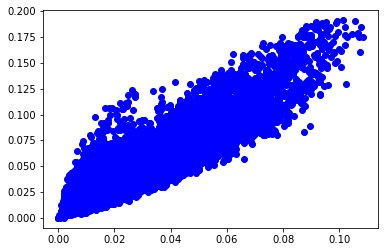

In [157]:
plt.plot(y_test_combined['y_pred_ann'], y_test_combined['y_pred_cnn'], 'o', color='blue')

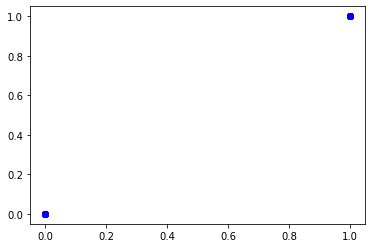

In [158]:
# check consistency of the order of y in both ANN sample and CNN sample
plt.plot(y_test_combined['y_ann'], y_test_combined['y_cnn'], 'o', color='blue')

In [159]:
np.corrcoef(y_test_combined['y_pred_ann'], y_test_combined['y_pred_cnn'])

array([[1.        , 0.93353116],
       [0.93353116, 1.        ]])

In [160]:
two_cuts_bad=y_test_combined.pivot_table(index='score_cut_ann', columns='score_cut_cnn', values='y_ann', 
                                     aggfunc='mean', dropna=False)
two_cuts_bad

score_cut_cnn,0,1,2,3,4,5,6,7,8,9
score_cut_ann,,,,,,,,,,
0,0.001200,0.002972,0.000000,0.004132,0.000000,0.000000,0.000000,0.250000,NaN,NaN
1,0.007617,0.003956,0.006678,0.002865,0.006289,0.000000,0.000000,0.000000,NaN,NaN
2,0.004640,0.005959,0.007444,0.012069,0.015974,0.000000,0.000000,0.047619,0.000000,NaN
3,0.028302,0.008869,0.009780,0.011749,0.008865,0.010563,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.009524,0.011796,0.012255,0.016611,0.015504,0.026316,0.035714,0.000000
5,0.000000,0.000000,0.015038,0.011050,0.016497,0.015234,0.012841,0.017937,0.031746,0.058824
6,NaN,NaN,0.000000,0.024096,0.022654,0.015476,0.019417,0.037367,0.028249,0.029412
7,NaN,NaN,NaN,1.000000,0.016393,0.050360,0.031785,0.042200,0.043253,0.036145
8,NaN,NaN,NaN,NaN,NaN,0.000000,0.023622,0.031542,0.039514,0.062016


In [161]:
two_cuts_count=y_test_combined.pivot_table(index='score_cut_ann', columns='score_cut_cnn', values='y_ann', 
                                     aggfunc='count', dropna=False)
two_cuts_count

score_cut_cnn,0,1,2,3,4,5,6,7,8,9
score_cut_ann,,,,,,,,,,
0,1666,673,362,242,136,53,11,4,0,0
1,919,1011,599,349,159,57,36,16,0,0
2,431,839,806,580,313,111,39,21,6,0
3,106,451,818,766,564,284,101,37,17,2
4,24,155,420,763,816,602,258,76,28,4
5,1,17,133,362,788,919,623,223,63,17
6,0,0,8,83,309,840,1133,562,177,34
7,0,0,0,1,61,278,818,1327,578,83
8,0,0,0,0,0,2,127,856,1645,516


Text(69.0, 0.5, 'CNN Score')

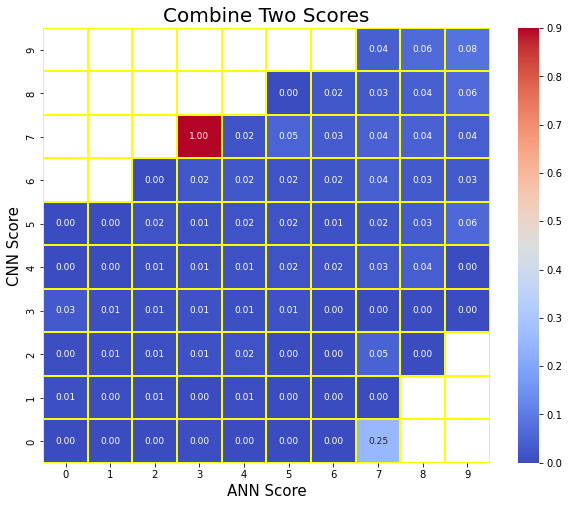

In [162]:
fig=plt.figure(figsize=(10, 8))
ax=plt.axes()
sns.heatmap(two_cuts_bad, cmap='coolwarm', fmt=".2f", vmin=0, vmax=0.9, linewidths=2, linecolor='yellow',
            annot=True, annot_kws={"size": 9}).invert_yaxis()
ax.set_title("Combine Two Scores", fontsize=20)
ax.set_xlabel('ANN Score', fontsize=15)
ax.set_ylabel('CNN Score', fontsize=15)

Text(69.0, 0.5, 'CNN Score')

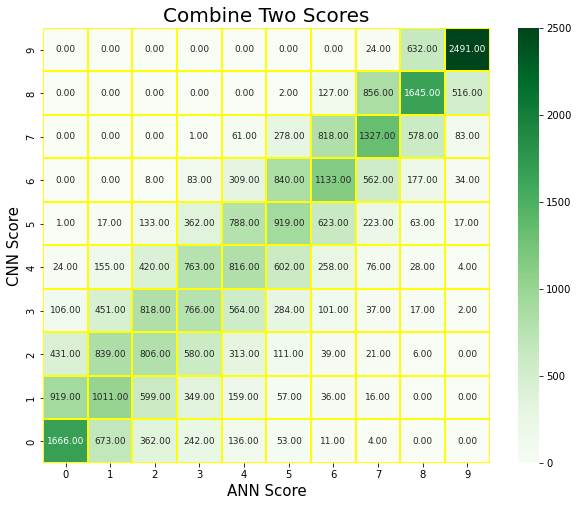

In [163]:
fig=plt.figure(figsize=(10, 8))
ax=plt.axes()
sns.heatmap(two_cuts_count, cmap='Greens', fmt=".2f", vmin=0, vmax=2500, linewidths=2, linecolor='yellow',
            annot=True, annot_kws={"size": 9}).invert_yaxis()
ax.set_title("Combine Two Scores", fontsize=20)
ax.set_xlabel('ANN Score', fontsize=15)
ax.set_ylabel('CNN Score', fontsize=15)

#### composite score - approach 1

In [165]:
y_test_combined['composite_score']=np.sqrt(y_test_combined['y_pred_ann']*y_test_combined['y_pred_cnn'])

C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='score_cut', ylabel='y_ann'>

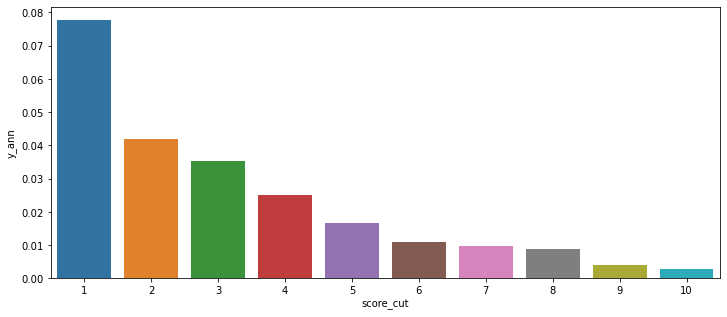

In [166]:
num_bins=10

binlabels=list(range(0, num_bins))

y_test_combined['score_cut']=pd.qcut(y_test_combined['composite_score'], q=num_bins, labels=binlabels)

fig=plt.figure(figsize=(12, 5))

y_test_combined=y_test_combined.groupby('score_cut')[['composite_score', 'y_ann']].mean().reset_index()
y_test_combined['score_cut']=y_test_combined['score_cut'].astype(int)
y_test_combined['score_cut']=num_bins-y_test_combined['score_cut']

sns.barplot(y_test_combined['score_cut'], y_test_combined['y_ann'])

Text(0, 0.5, 'Predicted/Actual')

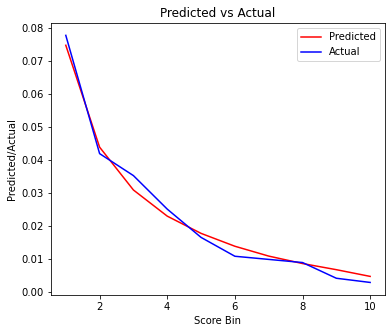

In [167]:
fig, ax=plt.subplots(1, 1, figsize=(6, 5))

ax.plot(y_test_combined['score_cut'], y_test_combined['composite_score'], label='Predicted', color='red')
ax.plot(y_test_combined['score_cut'], y_test_combined['y_ann'], label='Actual', color='blue')
ax.set_title('Predicted vs Actual')
ax.legend(loc='upper right')
ax.set_xlabel('Score Bin')
ax.set_ylabel('Predicted/Actual')

#### composite score - approach 2

In [170]:
y_test_combined=pd.concat([y_test_df_ann.rename(columns={'y':'y_ann', 'y_pred': 'y_pred_ann', 'score_cut':'score_cut_ann'}),
                          y_test_df_cnn.rename(columns={'y':'y_cnn', 'y_pred': 'y_pred_cnn', 'score_cut':'score_cut_cnn'})],
                         axis=1)

y_test_combined['composite_score']=(y_test_combined['y_pred_ann']+y_test_combined['y_pred_cnn'])/2

In [171]:
y_test_combined.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31462 entries, 0 to 31461
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   y_ann            31462 non-null  int32   
 1   y_pred_ann       31462 non-null  float32 
 2   score_cut_ann    31462 non-null  category
 3   y_cnn            31462 non-null  int32   
 4   y_pred_cnn       31462 non-null  float32 
 5   score_cut_cnn    31462 non-null  category
 6   composite_score  31462 non-null  float32 
dtypes: category(2), float32(3), int32(2)
memory usage: 676.8 KB


C:\Users\aleci\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='score_cut', ylabel='y_ann'>

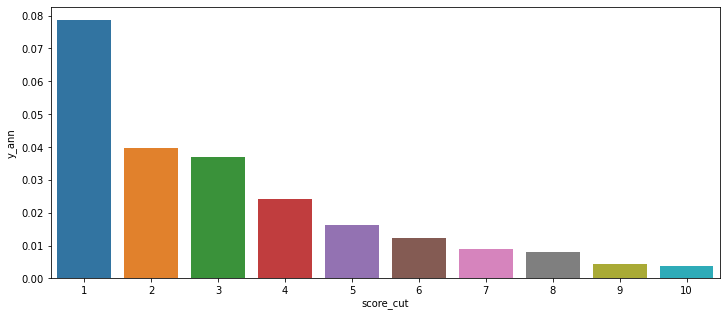

In [172]:
num_bins=10

binlabels=list(range(0, num_bins))

y_test_combined['score_cut']=pd.qcut(y_test_combined['composite_score'], q=num_bins, labels=binlabels)

fig=plt.figure(figsize=(12, 5))

y_test_combined=y_test_combined.groupby('score_cut')[['composite_score', 'y_ann']].mean().reset_index()
y_test_combined['score_cut']=y_test_combined['score_cut'].astype(int)
y_test_combined['score_cut']=num_bins-y_test_combined['score_cut']

sns.barplot(y_test_combined['score_cut'], y_test_combined['y_ann'])

Text(0, 0.5, 'Predicted/Actual')

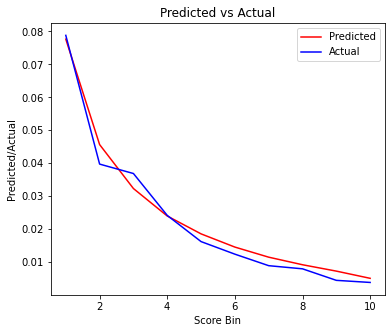

In [173]:
fig, ax=plt.subplots(1, 1, figsize=(6, 5))

ax.plot(y_test_combined['score_cut'], y_test_combined['composite_score'], label='Predicted', color='red')
ax.plot(y_test_combined['score_cut'], y_test_combined['y_ann'], label='Actual', color='blue')
ax.set_title('Predicted vs Actual')
ax.legend(loc='upper right')
ax.set_xlabel('Score Bin')
ax.set_ylabel('Predicted/Actual')

### Summary

The CNN model outperformed the ANN, with an 88% accuracy and an AUC-ROC of 0.92 compared to the ANN’s 85% accuracy and 0.89 AUC-ROC. While CNN’s complex layers capture data relationships more effectively, ANN remains simpler and easier to interpret.

Overall, the CNN model is the better choice for mortgage prediction, but ANN may still be useful where interpretability is key. Future improvements could include ensemble methods to combine strengths from both models.